# Analysis of Spectra results

## Libraries and paths

In [1]:
import numpy as np
import scipy
from scipy import sparse
from scipy.sparse import csr_matrix
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import anndata as ad
import glob
import sys
#import scvi
import gc
import re
import cytopus as cp
import Spectra
import gseapy as gp
import statsmodels.api as sm
import statsmodels.formula.api as smf

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
spectra_file = '../../test/test123/write/qc_020725.spectra_out.4k.h5ad'

### Site info

In [3]:
sample_info_raw = pd.read_csv("/project/tishkofflab/data/Electronic_Field_Data/2024/2024_freeze_3/TishkoffLab/Collection_Demographics/Subject_Data.TishkoffLab.Collection_Demographics.2024_freeze_3.utf8.txt", sep="\t")
pheno_info_raw = pd.read_csv("/project/tishkofflab/data/Electronic_Field_Data/2024/2024_freeze_3/A6K/Phenotypes/Subject_Data.A6K.BRONZE.Phenotypes.2024_freeze_3.utf8.txt", sep="\t")

/tmp/ipykernel_276563/2332952017.py:1: DtypeWarning: Columns (4,5,6,9,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,52,53,54,55,56,57,58,59,60,61,62,63,64,65,67,68,69,71,72,74,75,77,78,80,81,83,84,86,87,89,90,92,93,95,96,98,99,101,102,104,105,107,108,110,111,113,114,116,117,119,120,122,123,125,126,128,129,130,131,132,133,134,135,136,165,166,167,168,169,170,171,172,173,174,175,176,177,180,181,182,183,185,187,189,191,192,193,194,195,196,197,198,199,200,201,202,203,204) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_info_raw = pd.read_csv("/project/tishkofflab/data/Electronic_Field_Data/2024/2024_freeze_3/TishkoffLab/Collection_Demographics/Subject_Data.TishkoffLab.Collection_Demographics.2024_freeze_3.utf8.txt", sep="\t")
/tmp/ipykernel_276563/2332952017.py:2: DtypeWarning: Columns (4,5,6,10,12,73,74,108) have mixed types. Specify dtype option on import or set low_memory=False.
  pheno_info_raw = 

In [4]:
site_collect = sample_info_raw[['ID:topmed',
                                'ID:field',
                                'Subject_Information:Ethnicity::str',
                                'Collection_Information:Latitude::num::deg',
                                'Collection_Information:Longitude::num::deg',
                                'Collection_Information:Site::str',
                                'Collection_Information:Date::date',
                                'Categorization:Lifestyle:Subsistence_Practice::str',
                                'Categorization:Lifestyle:Subsistence_Practice:Notes::str']]

site_collect = site_collect.rename(columns={'ID:topmed': 'TID',
                                            'ID:field': 'FID',
                                            'Subject_Information:Ethnicity::str': 'Ethnicity',
                                            'Collection_Information:Latitude::num::deg': 'latitude',
                                            'Collection_Information:Longitude::num::deg': 'longitude',
                                            'Collection_Information:Site::str': 'site',
                                            'Collection_Information:Date::date': 'date',
                                            'Categorization:Lifestyle:Subsistence_Practice::str': 'subsistence'})

In [5]:
pheno = pheno_info_raw[['ID:topmed',
                        'Subject_Measurement:Cardiovascular:Blood_Pressure_Systolic_Left:Mean::num::Hgmm',
                        'Subject_Measurement:Cardiovascular:Blood_Pressure_Diastolic_Left:Mean::num::Hgmm',
                        'Subject_Measurement:Anthropometric:BMI::num',
                        'Subject_Measurement:Anthropometric:Body_Fat_Percentage::num::frac']].rename(columns={'ID:topmed': 'TID'})

In [ ]:
site_dates[site_dates['date'].str.startswith("2015-06")].to_csv('misc/sabga_june_fulani.tsv', sep="\t", index=False)

In [6]:
foo = pd.read_csv('misc/sabga_june_fulani.tsv', sep="\t")

### Functions

In [4]:
def grouped_obs_mean(adata, group_key, layer=None, gene_symbols=None):
    if layer is not None:
        getX = lambda x: x.layers[layer]
    else:
        getX = lambda x: x.X
    if gene_symbols is not None:
        new_idx = adata.var[idx]
    else:
        new_idx = adata.var_names

    grouped = adata.obs.groupby(group_key)
    out = pd.DataFrame(
        np.zeros((adata.shape[1], len(grouped)), dtype=np.float64),
        columns=list(grouped.groups.keys()),
        index=adata.var_names
    )

    for group, idx in grouped.indices.items():
        X = getX(adata[idx])
        out[group] = np.ravel(X.mean(axis=0, dtype=np.float64))
    return out

## Data

In [8]:
adata = sc.read_h5ad(spectra_file, backed='r')

In [9]:
# add batch information
batches = pd.read_csv("../../misc/lib_groups.txt", sep="\t")
adata.obs['BATCH'] = adata.obs[['library']].reset_index().merge(batches, left_on='library', right_on='LIBRARY').set_index('index').loc[adata.obs.index,'BATCH']

In [10]:
# clean up cell types
ctypes = pd.read_csv("../../sample_info/celltype_map.022125.csv")
ctype_dict = dict(zip(ctypes['Tier_1'] + ":" + ctypes['Tier_3'], ctypes['Tier_1'] + ":" + ctypes['Tier_2']))
adata.obs['ct2'] = adata.obs['FCluster_names'].apply(lambda x: ctype_dict[x])

In [11]:
adata_umap = sc.read_h5ad("../../test/test123/write/qc_020725_wctypes.harmony.umap.h5ad", backed='r')

In [12]:
adata.obsm['X_umap'] = adata_umap[adata.obs_names].obsm['X_umap']

## UMAP

### Cell type, condition, etc.

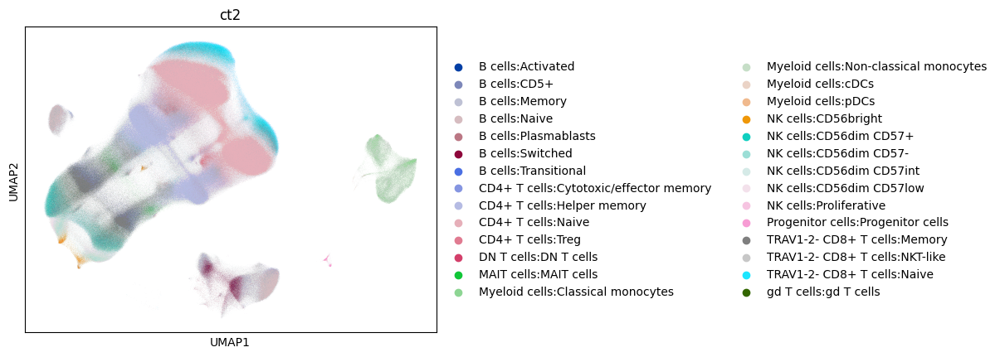

In [8]:
sc.pl.umap(adata, color='ct2')

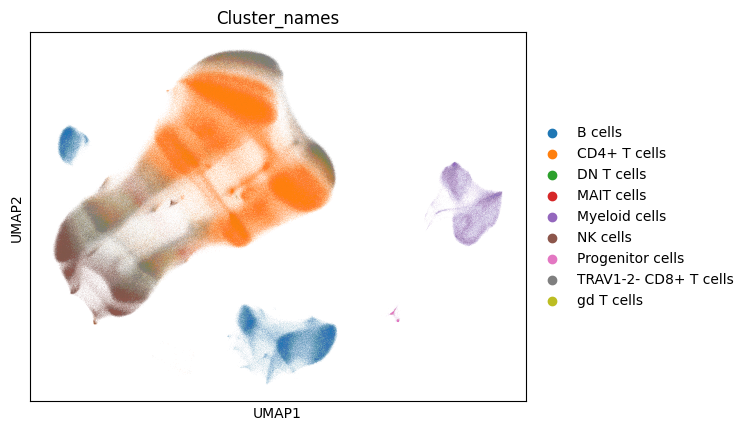

In [76]:
sc.pl.umap(adata, color='Cluster_names')

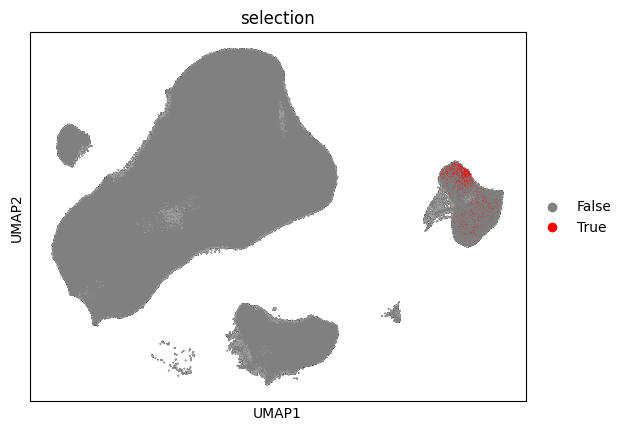

In [13]:
adata.obs['selection'] = pd.Categorical(adata.obs['FCluster_names']=="Myeloid cells:Non-classical monocytes")
# adjust colors
adata.uns['selection_colors'] = ['gray', 'red']
sc.pl.umap(adata, color='selection', add_outline=True, s=2)

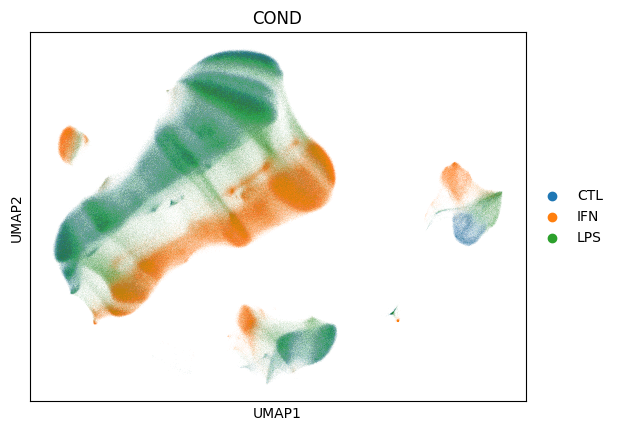

In [11]:
sc.pl.umap(adata, color='COND')

### Contamination issue

In [6]:
adata = sc.read_h5ad(spectra_file, backed='r')

In [7]:
site_date_info = adata.obs[['FID']].reset_index().merge(site_collect[['FID','site','date']]).set_index('index')
adata.obs.loc[site_date_info.index,'site'] = site_date_info['site']
adata.obs.loc[site_date_info.index,'date'] = site_date_info['date']

In [8]:
adata.obs['site'] = pd.Series(adata.obs['site'], dtype="category")
adata.obs['date'] = pd.Series(adata.obs['date'], dtype="category")

In [9]:
adata.obs['Cluster_names'] = pd.Series(adata.obs['Cluster_names'], dtype="category")

In [10]:
adata = adata.to_memory()

In [11]:
contam_dates = ["2015-06-14 00:00:00", "2015-06-15 00:00:00", "2015-06-16 00:00:00"]

In [12]:
adata.obs['Sabga_June'] = pd.Series((adata.obs['site']=="Sabga") & 
                                    (adata.obs['date'].isin(contam_dates)), dtype='category')

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


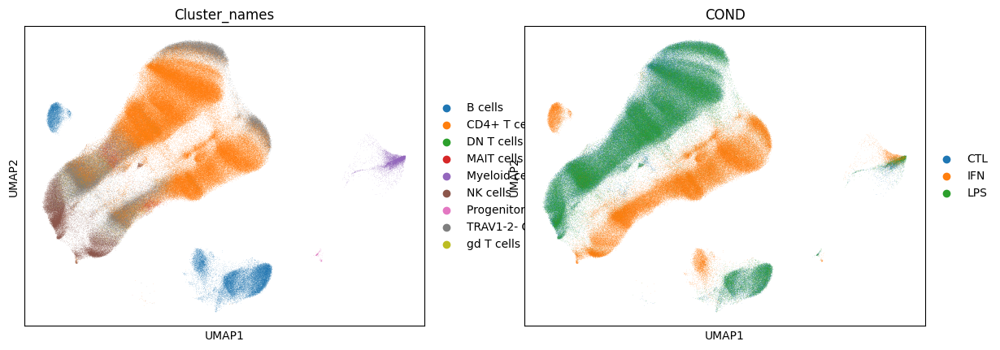

In [17]:
sc.pl.umap(adata[adata.obs['Sabga_June']==True], color=["Cluster_names", "COND"])

In [13]:
np.max(adata.X)

7.902514

In [14]:
adata_m = adata[adata.obs['cytopus_names']=="M"]

In [15]:
sc.tl.rank_genes_groups(adata_m, groupby="Sabga_June")

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:640: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


In [19]:
sc.tl.filter_rank_genes_groups(adata_m, min_fold_change=1)

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:735: RuntimeWarning: invalid value encountered in divide
  return n_nonzero / X.shape[0]
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:735: RuntimeWarning: invalid value encountered in divide
  return n_nonzero / X.shape[0]


In [26]:
sc.tl.filter_rank_genes_groups(adata_m)

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:735: RuntimeWarning: invalid value encountered in divide
  return n_nonzero / X.shape[0]
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:735: RuntimeWarning: invalid value encountered in divide
  return n_nonzero / X.shape[0]


In [27]:
adata_m

AnnData object with n_obs × n_vars = 84193 × 36601
    obs: 'donor_id', 'library', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'log10_total_counts', 'doublet_score', 'predicted_doublet', 'FID', 'LID', 'TID', 'COHORT', 'COND', 'SEX', 'AGE', 'POP', 'Ethnicity', 'FCluster_names', 'Cluster_names', 'SCluster_names', 'cytopus_names', 'site', 'date', 'Sabga_June'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'spectra_vocab'
    uns: 'SPECTRA_L', 'SPECTRA_factors', 'SPECTRA_markers', 'SPECTRA_overlap', 'hvg', 'log1p', 'rank_genes_groups', 'rank_genes_groups_filtered'
    obsm: 'SPECTRA_cell_scores'

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


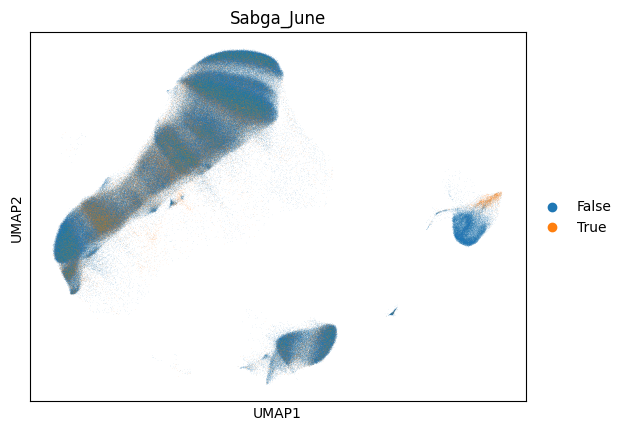

In [34]:
sc.pl.umap(adata[adata.obs['COND']=="CTL"], color=["Sabga_June"])

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


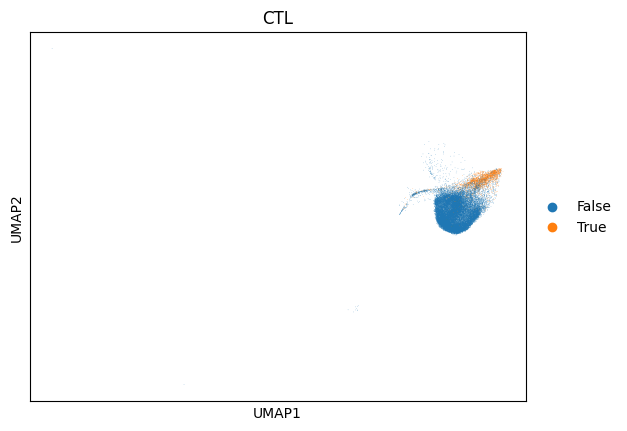

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


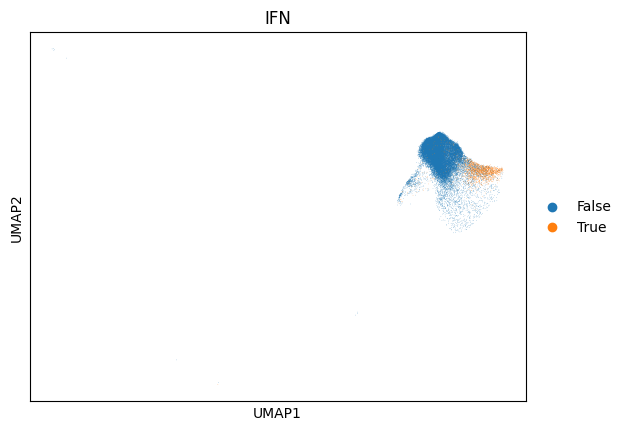

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


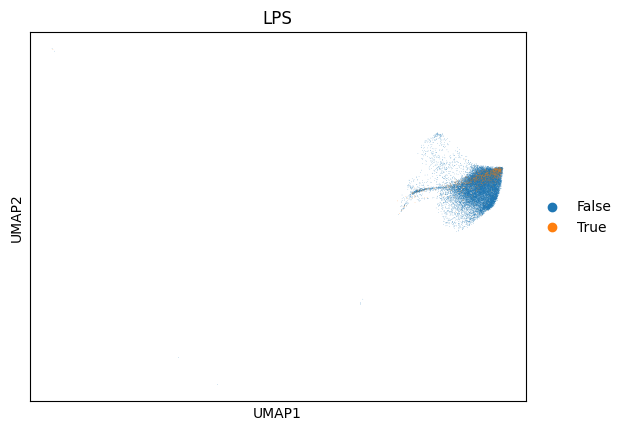

In [119]:
sc.pl.umap(adata[(adata.obs['COND']=="CTL") & \
           (adata.obs['cytopus_names']=="M")], color="Sabga_June", size=0.5, title="CTL")
sc.pl.umap(adata[(adata.obs['COND']=="IFN") & \
           (adata.obs['cytopus_names']=="M")], color="Sabga_June", size=0.5, title="IFN")
sc.pl.umap(adata[(adata.obs['COND']=="LPS") & \
           (adata.obs['cytopus_names']=="M")], color="Sabga_June", size=0.5, title="LPS")

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


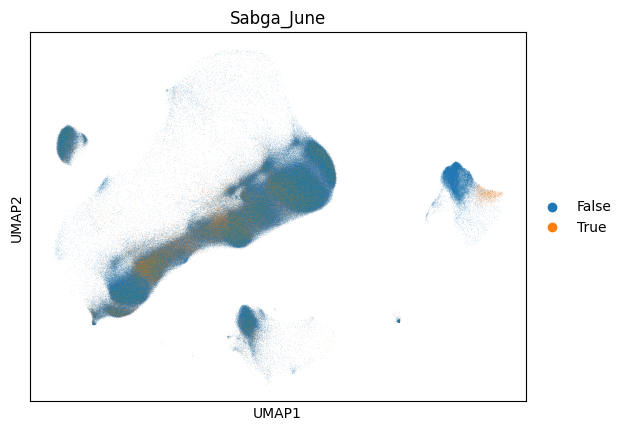

In [36]:
sc.pl.umap(adata[adata.obs['COND']=="IFN"], color=["Sabga_June"])

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


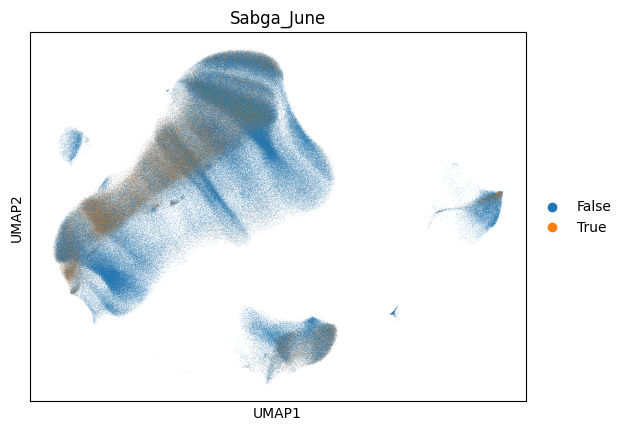

In [35]:
sc.pl.umap(adata[adata.obs['COND']=="LPS"], color=["Sabga_June"])

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


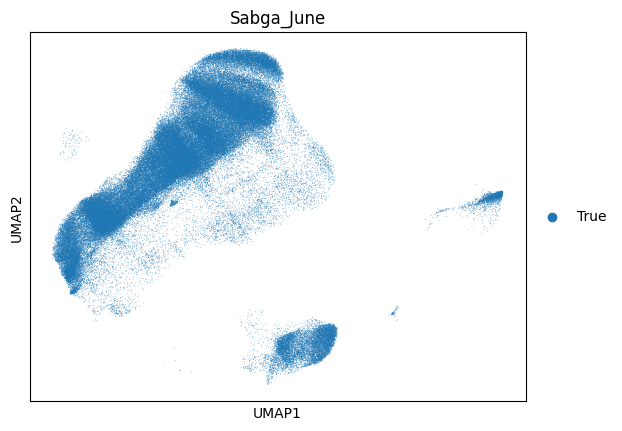

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


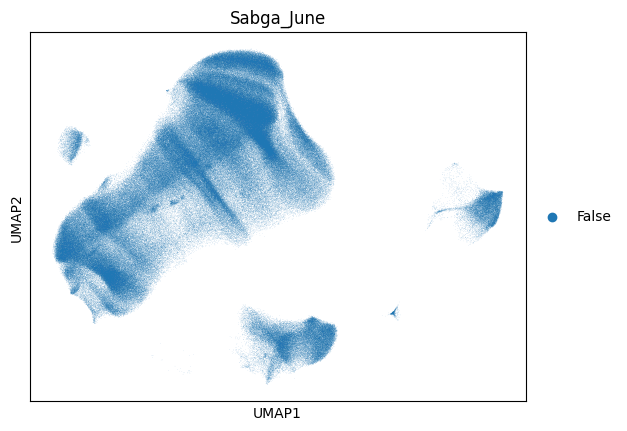

In [37]:
sc.pl.umap(adata[(adata.obs['COND']=="LPS") & (adata.obs['Sabga_June']==True)], color=["Sabga_June"])
sc.pl.umap(adata[(adata.obs['COND']=="LPS") & (adata.obs['Sabga_June']==False)], color=["Sabga_June"])

In [16]:
site_date_info.loc[adata.obs_names,'factor24'] = adata.obsm['SPECTRA_cell_scores'][:,24]
site_date_info.loc[adata.obs_names,'cytopus_names'] = adata.obs['cytopus_names']
site_date_info.loc[adata.obs_names,'ct2'] = adata.obs['ct2']
site_date_info.loc[adata.obs_names,'Ethnicity'] = adata.obs['Ethnicity']

/tmp/ipykernel_219911/3017203296.py:2: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  site_date_info.loc[adata.obs_names,'cytopus_names'] = adata.obs['cytopus_names']
/tmp/ipykernel_219911/3017203296.py:4: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  site_date_info.loc[adata.obs_names,'Ethnicity'] = adata.obs['Ethnicity']


In [17]:
site_date_cnts = site_date_info[['FID','Ethnicity','date']].drop_duplicates() \
    .groupby(['date','Ethnicity'])['FID'].count().reset_index()

In [18]:
site_date_cnts = site_date_cnts.merge(site_date_info[['site','date']].drop_duplicates())

In [19]:
site_date_cnts_wide = site_date_cnts.pivot(index='Ethnicity', 
                                           columns='date', 
                                           values='FID')

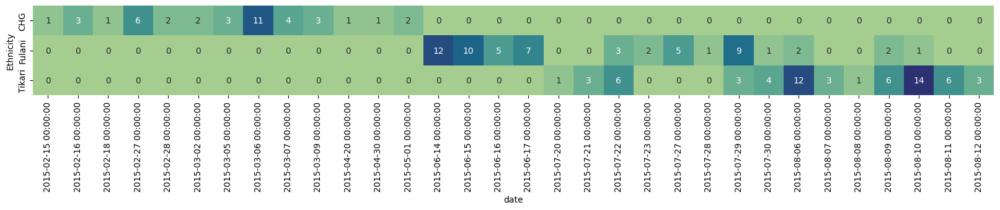

In [102]:
plt.figure(figsize=(20, 8))
sns.heatmap(site_date_cnts_wide, annot=True, cmap="crest", square=True, cbar=False)
plt.show()

In [25]:
site_date_f24_median = site_date_info[site_date_info['cytopus_names']=="M"].groupby('FID')['factor24'].median().reset_index()

In [36]:
site_date_f24_frac = site_date_info[site_date_info['cytopus_names']=="M"] \
    .groupby('FID')['factor24'].apply(lambda x: np.mean(x>0.02)).reset_index()

In [43]:
site_date_f24_frac = site_date_f24_frac.merge(site_date_info[['FID','Ethnicity','date']].drop_duplicates())

In [49]:
site_date_f24_frac['Ethnicity'] = pd.Categorical(site_date_f24_frac['Ethnicity'], categories=['Tikari','Fulani','CHG'])

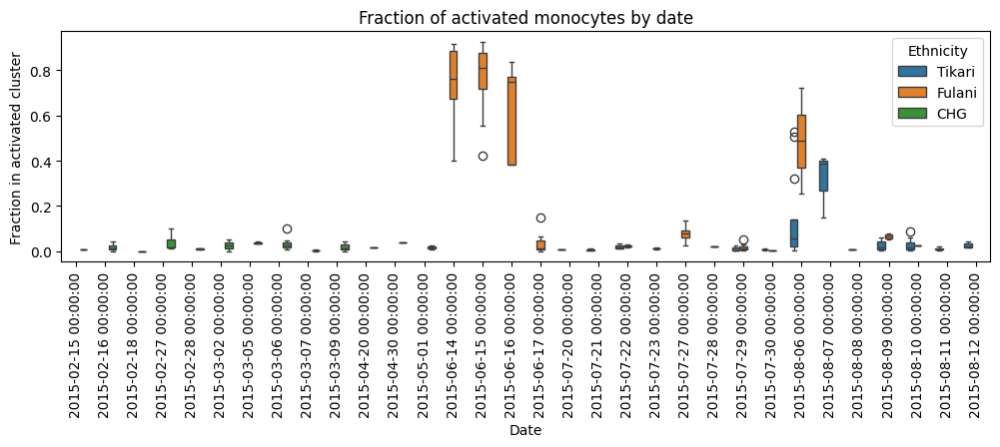

In [54]:
plt.figure(figsize=(12, 3))
ax = sns.boxplot(x='date', y='factor24', data=site_date_f24_frac, hue='Ethnicity')
#ax = sns.swarmplot(x='date', y='factor24', data=site_date_f24_frac, hue='Ethnicity')
ax.tick_params(axis='x', rotation=90)
plt.title('Fraction of activated monocytes by date')
plt.xlabel('Date')
plt.ylabel('Fraction in activated cluster')
plt.show()

In [89]:
cpal = sns.color_palette("Set2", 7).as_hex()
cpal_dict = dict(zip(np.unique(site_date_info.reset_index()['site']), cpal))

In [99]:
sns.color_palette("Set2", 7)

[(0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.6509803921568628, 0.8470588235294118, 0.32941176470588235),
 (1.0, 0.8509803921568627, 0.1843137254901961),
 (0.8980392156862745, 0.7686274509803922, 0.5803921568627451)]

In [97]:
site_col_colors = site_date_info[['site','date']].drop_duplicates().sort_values('date')['site'].apply(lambda x: cpal_dict[x])

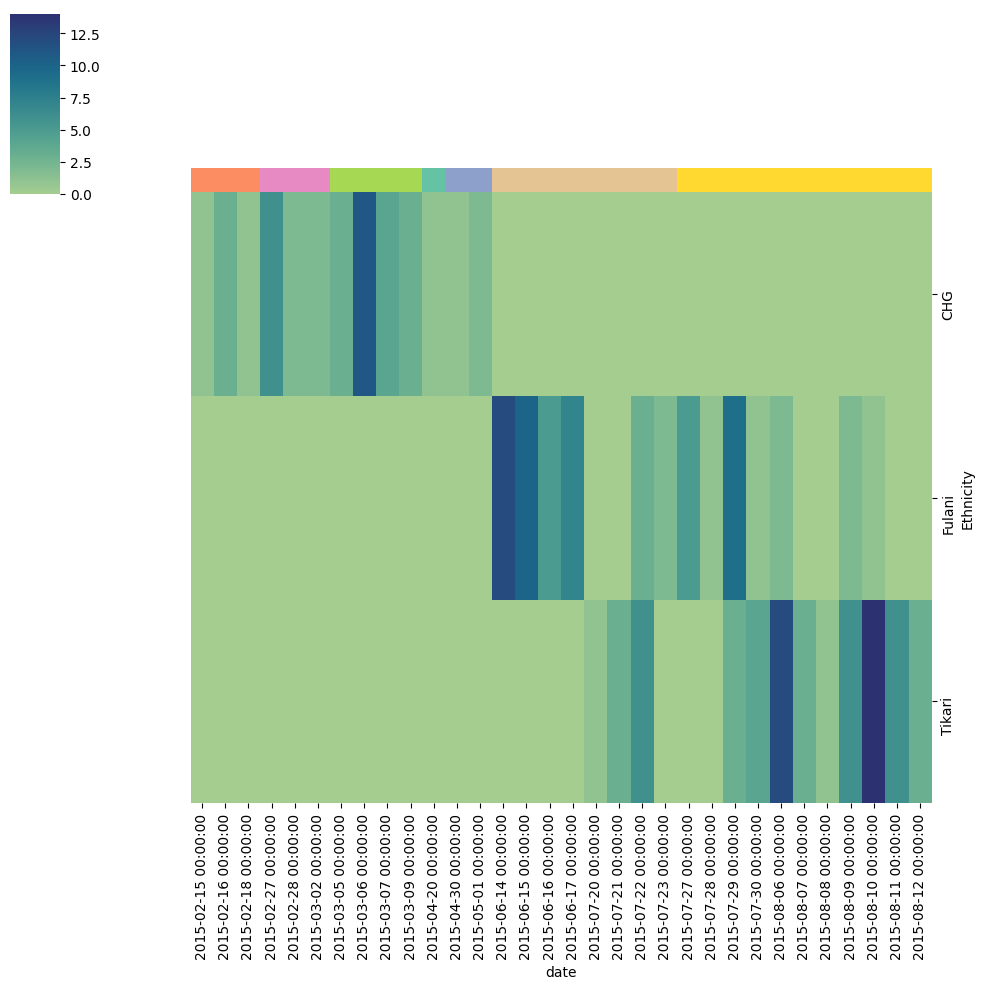

In [104]:
cg = sns.clustermap(site_date_cnts_wide, cmap="crest",
                    row_cluster=False, col_cluster=False,
                    col_colors=list(site_col_colors))
plt.setp(cg.ax_heatmap.xaxis.get_majorticklabels(), rotation=90)
cg.ax_row_dendrogram.set_visible(False)

In [234]:
model = pd.read_pickle(r'../../test/test123/spectra_model.032625.pkl')

## Association of factors with cell types and conditions

One question is to what extent a factor is predictive of a certain cell-type, i.e. does the factor "capture" the signal defining that celltype. 

In [13]:
scores_df = pd.DataFrame(adata.obsm['SPECTRA_cell_scores'], index=adata.obs.index, columns=adata.uns['SPECTRA_overlap'].index)

In [14]:
adata.obs[adata.uns['SPECTRA_overlap'].index] = scores_df

In [15]:
scores_means = scores_df.merge(adata.obs[['FID','COND','cytopus_names']], left_index=True, right_index=True) \
    .groupby(['FID','COND','cytopus_names']).mean().reset_index().merge(adata.obs[['FID','AGE','SEX','BATCH','Ethnicity']].drop_duplicates()) \
    .merge(site_collect[['FID','site','date']])

In [16]:
contam_dates = ["2015-06-14 00:00:00", "2015-06-15 00:00:00", "2015-06-16 00:00:00"]
scores_means['Sabga_June'] = pd.Series((scores_means['site']=="Sabga") & 
                                       (scores_means['date'].isin(contam_dates)), dtype='category')

In [17]:
scores_means['Ethnicity'] = pd.Categorical(scores_means['Ethnicity'], categories=['Tikari','Fulani','CHG'])

In [18]:
# Drop Progenitor, DNT, and MAIT due to low cell numbers and NaN
scores_means = scores_means[~scores_means['cytopus_names'].isin(['Progenitor','DNT','MAIT'])]

In [19]:
factors = adata.uns['SPECTRA_overlap'].index

In [ ]:
# LMM with individual as random effect
results_list = []

for factor in factors:
    
    scores_factor = scores_means[['cytopus_names','FID','AGE','SEX','COND','Ethnicity','Sabga_June',factor]]
    ctype_scores = scores_factor.groupby('cytopus_names').sum().reset_index()
    ctype_keep = ctype_scores[~(ctype_scores[factor]==0)]['cytopus_names'].astype(str)

    for ctype in ctype_keep:
        
        scores_sub = scores_factor[scores_factor['cytopus_names']==ctype]
        scores_sub[factor] = (scores_sub[factor] - np.mean(scores_sub[factor])) / np.std(scores_sub[factor])
        formula = "Q(\"" + factor + "\")" + " ~ AGE + SEX + COND + C(Ethnicity, Treatment) + Sabga_June"
        md = smf.mixedlm(formula, scores_sub, groups=scores_sub['FID'])
        mdf = md.fit()

        results_df = mdf.params.to_frame('param')\
            .merge(mdf.pvalues.to_frame('pvalue'), left_index=True, right_index=True)\
            .reset_index(names="var")
        results_df['ctype'] = ctype
        results_df['factor'] = factor
        
        results_list.append(results_df)

In [ ]:
# LMM with individual as random effect
# remove samples from Sabga
results_list_ns = []

scores_means_nosabga = scores_means[scores_means['Sabga_June']==False]

for factor in factors:
    
    scores_factor = scores_means_nosabga[['cytopus_names','FID','AGE','SEX','COND','Ethnicity',factor]]
    ctype_scores = scores_factor.groupby('cytopus_names').sum().reset_index()
    ctype_keep = ctype_scores[~(ctype_scores[factor]==0)]['cytopus_names'].astype(str)

    for ctype in ctype_keep:
        
        scores_sub = scores_factor[scores_factor['cytopus_names']==ctype]
        scores_sub[factor] = (scores_sub[factor] - np.mean(scores_sub[factor])) / np.std(scores_sub[factor])
        formula = "Q(\"" + factor + "\")" + " ~ AGE + SEX + COND + COND:Ethnicity + C(Ethnicity, Sum)"
        md = smf.mixedlm(formula, scores_sub, groups=scores_sub['FID'])
        mdf = md.fit()

        results_df = mdf.params.to_frame('param')\
            .merge(mdf.pvalues.to_frame('pvalue'), left_index=True, right_index=True)\
            .reset_index(names="var")
        results_df['ctype'] = ctype
        results_df['factor'] = factor
        
        results_list_ns.append(results_df)

In [99]:
results_lmm = pd.concat(results_list)

In [107]:
results_ns_lmm = pd.concat(results_list_ns)

In [105]:
np.unique(results_ns_lmm['var'])

array(['AGE', 'C(Ethnicity, Sum)[S.Fulani]',
       'C(Ethnicity, Sum)[S.Tikari]', 'COND[T.IFN]',
       'COND[T.IFN]:Ethnicity[T.CHG]', 'COND[T.IFN]:Ethnicity[T.Fulani]',
       'COND[T.LPS]', 'COND[T.LPS]:Ethnicity[T.CHG]',
       'COND[T.LPS]:Ethnicity[T.Fulani]', 'Ethnicity[T.CHG]',
       'Ethnicity[T.Fulani]', 'Group Var', 'Intercept', 'SEX[T.M]'],
      dtype=object)

In [108]:
results_ns_lmm[results_ns_lmm['var']=="Intercept"].sort_values('pvalue').head()

,var,param,pvalue,ctype,factor
0,Intercept,-1.521852,0.999999,CD4-T,0-X-global-X-0
0,Intercept,-0.047935,1.000000,B,0-X-global-X-0
0,Intercept,0.008777,1.000000,CD8-T,0-X-global-X-0
0,Intercept,-0.814853,NaN,M,0-X-global-X-0


In [109]:
results_ns_lmm[results_ns_lmm['var']=="C(Ethnicity, Sum)[S.Fulani]"].sort_values('pvalue').head()

,var,param,pvalue,ctype,factor
5,"C(Ethnicity, Sum)[S.Fulani]",-1.423920,0.999999,CD4-T,0-X-global-X-0
5,"C(Ethnicity, Sum)[S.Fulani]",-0.028010,1.000000,B,0-X-global-X-0
5,"C(Ethnicity, Sum)[S.Fulani]",0.869255,NaN,CD8-T,0-X-global-X-0
5,"C(Ethnicity, Sum)[S.Fulani]",-0.350762,NaN,M,0-X-global-X-0


In [27]:
results_ns_lmm[results_ns_lmm['var']=="COND[T.IFN]:Ethnicity[T.Fulani]"].sort_values('pvalue').head()

,var,param,pvalue,ctype,factor
6,COND[T.IFN]:Ethnicity[T.Fulani],-0.242347,0.005434,NK,1-X-global-X-1
6,COND[T.IFN]:Ethnicity[T.Fulani],0.135009,0.069670,CD8-T,16-X-CD8-T-X-16
6,COND[T.IFN]:Ethnicity[T.Fulani],-0.177008,0.086766,B,4-X-B-X-4
6,COND[T.IFN]:Ethnicity[T.Fulani],0.111611,0.110679,CD8-T,19-X-CD8-T-X-19
6,COND[T.IFN]:Ethnicity[T.Fulani],-0.090801,0.118712,CD8-T,18-X-CD8-T-X-18


In [58]:
results_ns_lmm[results_ns_lmm['var']=="Intercept"].sort_values('pvalue').head()

,var,param,pvalue,ctype,factor
0,Intercept,-0.918587,1.361058e-44,B,7-X-B-X-7
0,Intercept,-0.989676,3.889594e-43,CD8-T,17-X-CD8-T-X-17
0,Intercept,-0.700812,7.545376e-43,M,31-X-M-X-31
0,Intercept,-0.861426,7.456340e-38,CD4-T,9-X-CD4-T-X-9
0,Intercept,-0.968777,1.186850e-33,NK,37-X-NK-X-37


In [61]:
results_ns_lmm[results_ns_lmm['var']=="Ethnicity[T.CHG]"].sort_values('pvalue').head()

,var,param,pvalue,ctype,factor
5,Ethnicity[T.CHG],1.623163,1.028608e-23,M,23-X-M-X-23
5,Ethnicity[T.CHG],1.212572,2.100706e-12,CD8-T,19-X-CD8-T-X-19
5,Ethnicity[T.CHG],0.987966,6.812770e-11,M,32-X-M-X-32
5,Ethnicity[T.CHG],-0.982866,1.266738e-10,gdT,1-X-global-X-1
5,Ethnicity[T.CHG],-1.107174,5.803715e-10,M,27-X-M-X-27


In [ ]:
results_ns_lmm[results_ns_lmm['var']=="COND[T.IFN]:Ethnicity[T.CHG]"].sort_values('pvalue').head()

In [92]:
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
# weight for factor 30, from most to least significant
gene_list = list(adata.var_names[adata.var['spectra_vocab']][np.argsort(-adata.uns['SPECTRA_factors'][25,:])][0:100])
enr = gp.enrichr(gene_list=gene_list, # or "./tests/data/gene_list.txt",
                 gene_sets=['MSigDB_Hallmark_2020','KEGG_2021_Human','GO_Biological_Process_2025','Reactome_Pathways_2024'],
                 background=list(adata.var_names[adata.var['spectra_vocab']]),
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk
                )

In [93]:
adata.uns['SPECTRA_markers'][25]

array(['CCL8', 'APOBEC3A', 'CXCL10', 'CCL7', 'RGL1', 'CCL2', 'NCF1',
       'FGL2', 'IL4I1', 'MARCKS', 'FPR3', 'ATF5', 'GLUL', 'SLC8A1',
       'CALHM6', 'SAMD4A', 'IDO1', 'C15orf48', 'SNX10', 'HSPA1A', 'PILRA',
       'MNDA', 'LGALS2', 'MSR1', 'DOCK4', 'LILRB2', 'EPB41L3', 'IFI30',
       'FTL', 'MAFB', 'CXCL11', 'HESX1', 'MYOF', 'LYZ', 'NINJ1', 'CTSB',
       'FCER1G', 'PDE4B', 'RIN2', 'TLR2', 'RBM47', 'FTH1', 'OSBPL1A',
       'CD40', 'LILRB4', 'GCH1', 'CYBB', 'CTSD', 'PLA2G7', 'ANKRD22'],
      dtype=object)

In [94]:
enr.results.sort_values('Adjusted P-value').head(50)

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
1331,Reactome_Pathways_2024,Immune System,5.416994e-21,2.015122e-18,0,0,8.684462,405.258229,CD40;IL1RN;NCF1;FGL2;CTSZ;PTAFR;IL27;IFI30;TNF...
0,MSigDB_Hallmark_2020,Interferon Gamma Response,8.445795e-15,3.040486e-13,0,0,19.934584,645.982340,CD40;GCH1;FGL2;IFI30;SOD2;CXCL10;CXCL11;CCL7;I...
1332,Reactome_Pathways_2024,Neutrophil Degranulation,7.855667e-15,1.461154e-12,0,0,14.370076,466.704749,FCER1G;FGL2;CTSZ;PTAFR;CYBB;LILRB2;LYZ;CST3;TY...
1,MSigDB_Hallmark_2020,Inflammatory Response,2.522189e-12,4.539939e-11,0,0,14.830703,396.067184,LYN;MSR1;CD40;GCH1;PTAFR;CYBB;P2RX7;CXCL10;CXC...
1333,Reactome_Pathways_2024,Innate Immune System,2.081953e-12,2.581622e-10,0,0,7.548872,203.047410,LYN;FCER1G;NCF1;FGL2;CTSZ;PTAFR;CYBB;LILRB2;LY...
183,GO_Biological_Process_2025,Inflammatory Response (GO:0006954),3.463271e-12,3.975835e-09,0,0,14.473389,381.935488,CCR1;CD40;IL1RN;CYBB;FPR3;LYZ;AIF1;CXCL10;CCL8...
185,GO_Biological_Process_2025,Negative Regulation of Lymphocyte Proliferatio...,2.398968e-10,9.180052e-08,0,0,41.256917,913.874218,IL4I1;TYROBP;GPNMB;LILRB1;MNDA;LILRB2;LILRB4;H...
184,GO_Biological_Process_2025,Cytokine-Mediated Signaling Pathway (GO:0019221),1.778140e-10,9.180052e-08,0,0,11.913739,267.466815,LYN;CCR1;FCER1G;SPI1;LILRB1;LILRB2;LILRB4;PRLR...
1334,Reactome_Pathways_2024,Cytokine Signaling in Immune System,1.204461e-09,1.120149e-07,0,0,6.815950,139.980756,LYN;CCR1;CD40;IL1RN;PTAFR;IL27;IFI30;SOD2;PRLR...
1335,Reactome_Pathways_2024,Adaptive Immune System,1.131218e-08,8.416264e-07,0,0,6.618141,121.094684,LYN;CD40;NCF1;CYBB;LILRB1;PILRA;LILRB2;IFI30;L...


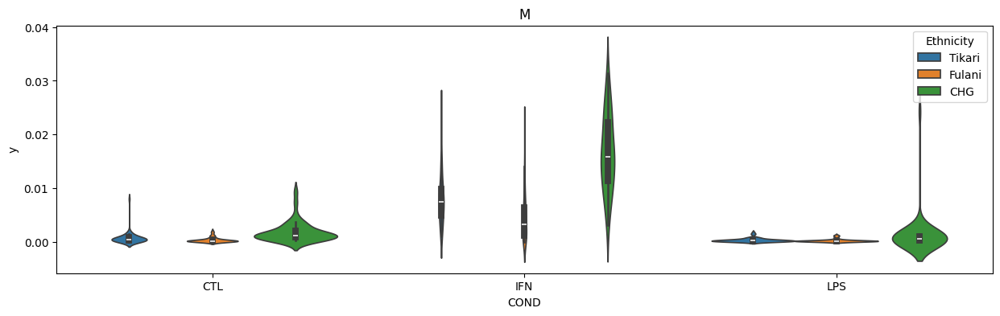

In [95]:
for ctype in ['M']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[25]]
    plt.figure(figsize = (15,4))
    ax = sns.violinplot(pd.DataFrame({'y' : y, 'Ethnicity' : scores_means[scores_means['cytopus_names']==ctype]['Ethnicity'],
                             'COND' : scores_means[scores_means['cytopus_names']==ctype]['COND']},
                             index=scores_means[scores_means['cytopus_names']==ctype].index),
               x = 'COND', y = 'y', hue = 'Ethnicity')
    plt.title(ctype)

In [21]:
adata = adata.to_memory()

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


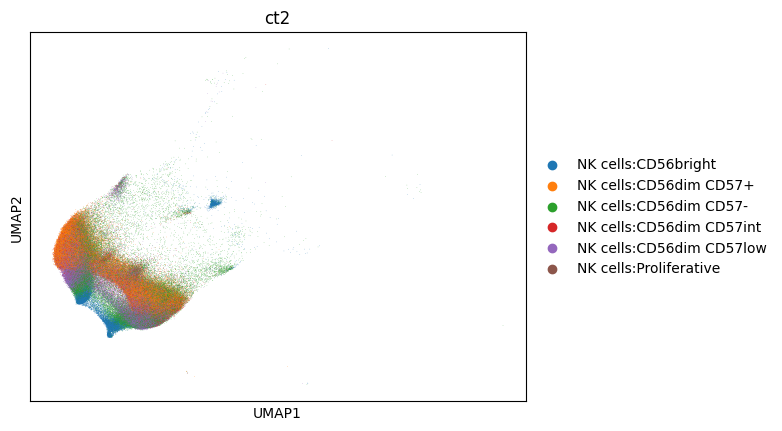

In [25]:
sc.pl.umap(adata[adata.obs['cytopus_names']=="NK"], color="ct2")

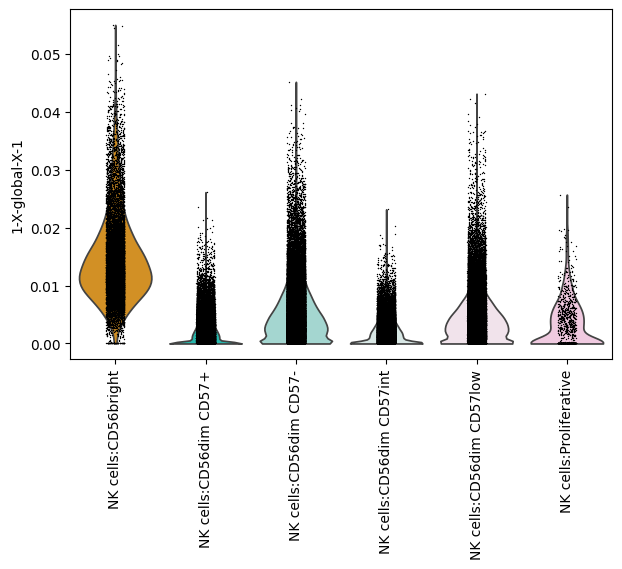

In [31]:
sc.pl.violin(adata[adata.obs['cytopus_names']=="NK"], keys="1-X-global-X-1", groupby="ct2", rotation=90)

In [ ]:
sc.pl.violin(adata[adata.obs['cytopus_names']=="NK"], keys="1-X-global-X-1", groupby="Ethnicity", rotation=90)

In [33]:
from scanpro import scanpro, anova, t_test
from scanpro.linear_model import create_design
from scanpro.get_transformed_props import get_transformed_props

In [35]:
coarse_out = scanpro(adata[adata.obs['COND']=="CTL"], clusters_col='Cluster_names', samples_col='FID', conds_col='Ethnicity', transform='logit')

[INFO] There are more than 2 conditions. ANOVA will be performed...
[INFO] Done!


In [36]:
coarse_out.results.sort_values('adjusted_p_values').head()

,baseline_props,mean_props_CHG,mean_props_Tikari,mean_props_Fulani,f_statistics,p_values,adjusted_p_values
clusters,,,,,,,
TRAV1-2- CD8+ T cells,0.196561,0.259971,0.197444,0.182906,15.828978,5.209047e-07,0.000005
B cells,0.084362,0.058948,0.099483,0.086193,13.959251,2.532196e-06,0.000011
MAIT cells,0.007047,0.003313,0.005891,0.009086,12.559600,8.441691e-06,0.000020
NK cells,0.092747,0.082206,0.129385,0.074312,12.522610,8.716747e-06,0.000020
CD4+ T cells,0.568071,0.541000,0.504466,0.605569,11.710612,1.767766e-05,0.000032


In [43]:
fine_out = scanpro(adata[adata.obs['COND']=="CTL"], clusters_col='ct2', samples_col='FID', conds_col='Ethnicity', transform='logit')

[INFO] There are more than 2 conditions. ANOVA will be performed...
[INFO] Done!


In [44]:
fine_out.results.sort_values('adjusted_p_values').head()

,baseline_props,mean_props_CHG,mean_props_Tikari,mean_props_Fulani,f_statistics,p_values,adjusted_p_values
clusters,,,,,,,
NK cells:CD56dim CD57-,0.020102,0.009066,0.027803,0.019105,45.885935,1.110223e-16,3.108624e-15
NK cells:CD56dim CD57+,0.034878,0.046598,0.056590,0.013736,36.850013,6.050715e-14,8.471002e-13
B cells:Naive,0.036122,0.017300,0.039536,0.041942,24.443945,5.108152e-10,4.767608e-09
Myeloid cells:Non-classical monocytes,0.003898,0.002743,0.006369,0.002153,15.438759,7.185947e-07,5.030163e-06
TRAV1-2- CD8+ T cells:NKT-like,0.009025,0.013429,0.013107,0.005317,13.263671,4.576221e-06,2.562684e-05


In [48]:
fine_out_nk = scanpro(adata[(adata.obs['COND']=="LPS") & (adata.obs['cytopus_names']=="NK")], clusters_col='ct2', samples_col='FID', conds_col='Ethnicity', transform='logit')

[INFO] There are more than 2 conditions. ANOVA will be performed...
[INFO] Done!


In [49]:
fine_out_nk.results.sort_values('adjusted_p_values').head()

,baseline_props,mean_props_CHG,mean_props_Tikari,mean_props_Fulani,f_statistics,p_values,adjusted_p_values
clusters,,,,,,,
NK cells:CD56dim CD57+,0.296488,0.444144,0.274996,0.157482,32.540693,1.246336e-12,7.478018e-12
NK cells:CD56dim CD57-,0.244443,0.145674,0.296515,0.294611,31.194994,3.285927e-12,9.857781e-12
NK cells:CD56bright,0.051605,0.052534,0.050007,0.094070,13.417801,4.004998e-06,7.421959e-06
NK cells:CD56dim CD57low,0.279534,0.226274,0.262010,0.337724,13.172132,4.947973e-06,7.421959e-06
NK cells:CD56dim CD57int,0.123851,0.127115,0.112556,0.111291,1.388026,2.524797e-01,3.029756e-01


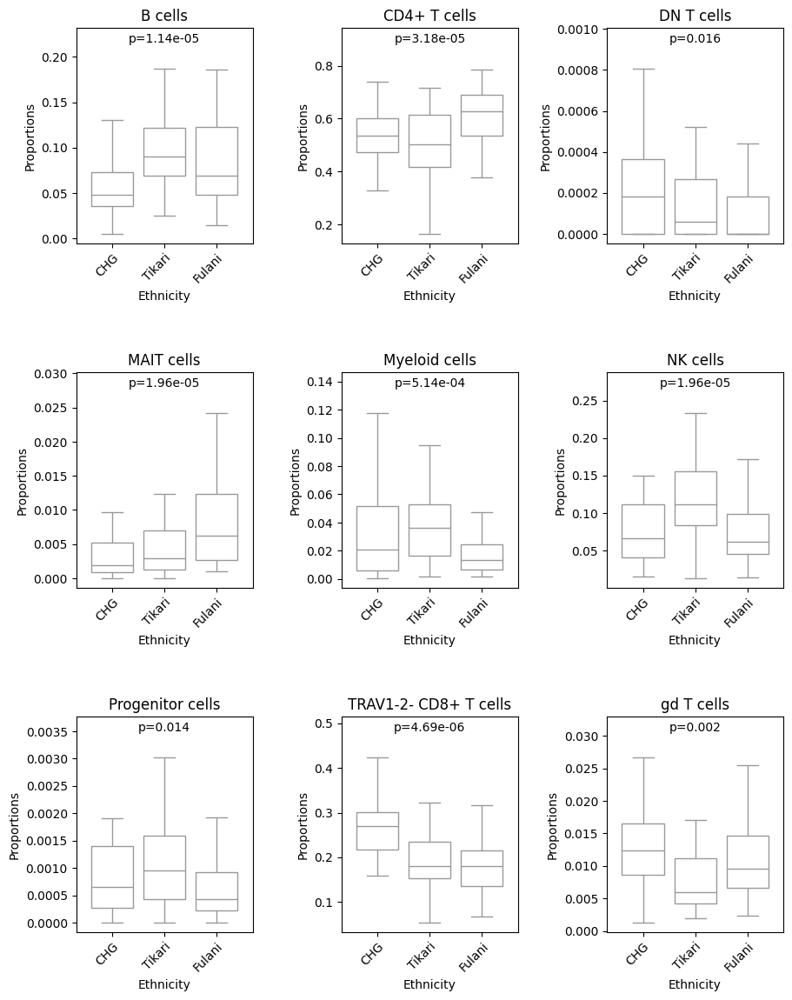

In [42]:
coarse_out.plot(kind="boxplot")

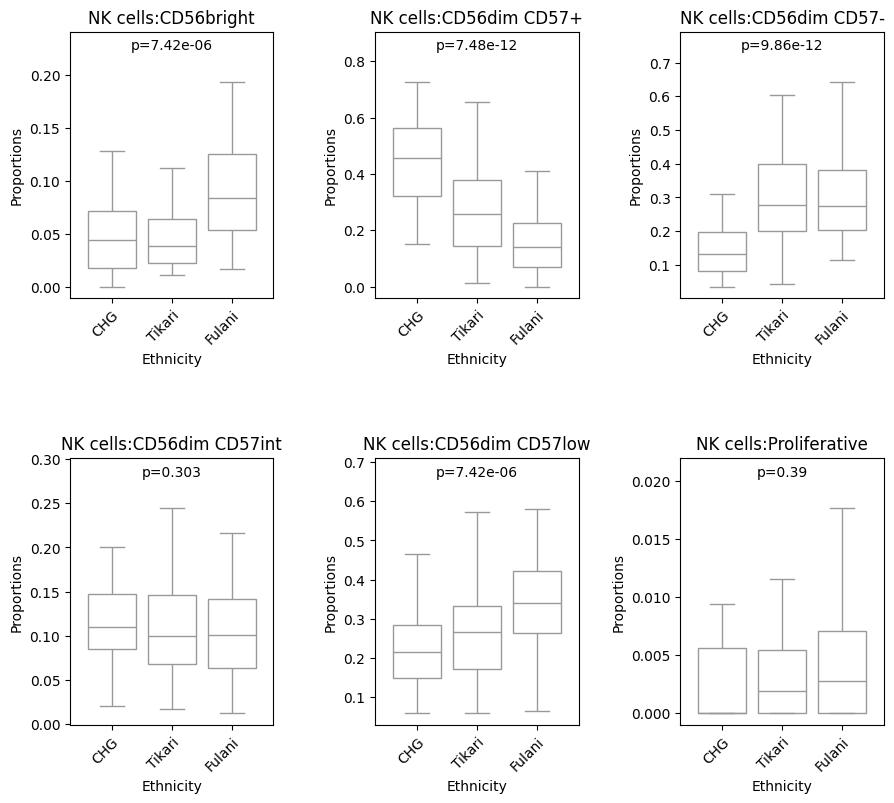

In [50]:
fine_out_nk.plot(kind="boxplot")

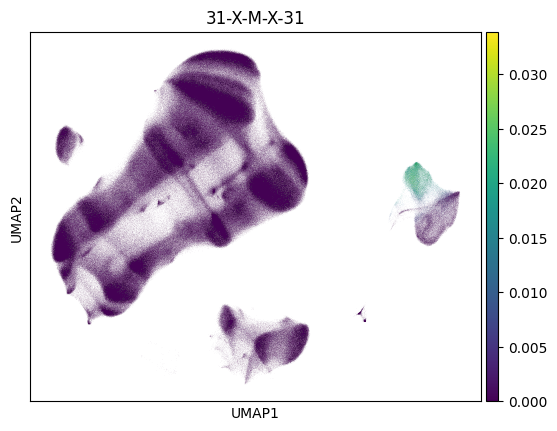

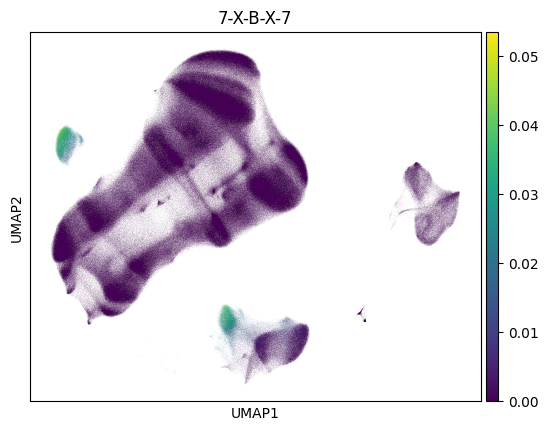

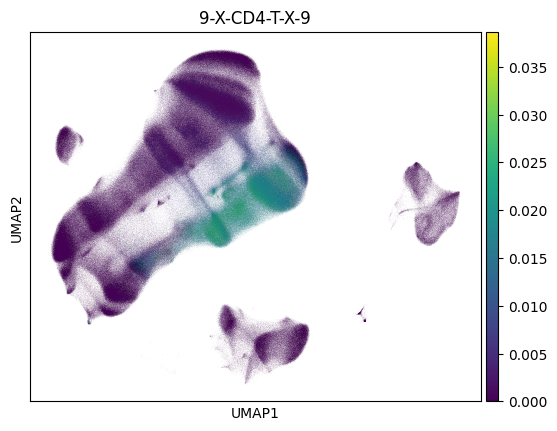

In [32]:
sc.pl.umap(adata, color=['31-X-M-X-31'])
sc.pl.umap(adata, color=['7-X-B-X-7'])
sc.pl.umap(adata, color=['9-X-CD4-T-X-9'])

In [30]:
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
# weight for factor 30, from most to least significant
gene_list = list(adata.var_names[adata.var['spectra_vocab']][np.argsort(-adata.uns['SPECTRA_factors'][1,:])][0:50])
enr = gp.enrichr(gene_list=gene_list, # or "./tests/data/gene_list.txt",
                 gene_sets=['MSigDB_Hallmark_2020','KEGG_2021_Human'],
                 background=list(adata.var_names[adata.var['spectra_vocab']]),
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk
                )

In [31]:
enr.results.head()

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,1.573839e-12,4.564134e-11,0,0,25.412485,690.647883,NFKBIA;PPP1R15A;GADD45A;GPR183;TNFAIP3;TRAF1;C...
1,MSigDB_Hallmark_2020,p53 Pathway,1.636726e-07,2.373253e-06,0,0,20.959805,327.505280,TSPYL2;PPP1R15A;GADD45A;DDIT4;RPS27L;IER5;DDB2
2,MSigDB_Hallmark_2020,KRAS Signaling Up,1.573437e-05,1.520990e-04,0,0,13.012093,143.909365,PPP1R15A;CXCR4;TNFAIP3;TRAF1;IL7R;BIRC3
3,MSigDB_Hallmark_2020,Apoptosis,3.568107e-05,2.566380e-04,0,0,15.459259,158.316576,GPX4;GADD45A;CD69;SQSTM1;BIRC3
4,MSigDB_Hallmark_2020,Inflammatory Response,4.424793e-05,2.566380e-04,0,0,10.721074,107.486297,NFKBIA;GPR183;EMP3;CD69;IL7R;HIF1A


In [20]:
adata.uns['SPECTRA_markers'][1]

array(['MALAT1', 'RPS27L', 'BIRC3', 'CREM', 'CXCR4', 'SQSTM1', 'NFKBIA',
       'SNHG12', 'RELB', 'CD7', 'TSPYL2', 'ATF4', 'RALA', 'FTH1',
       'PPP1R15A', 'PDE3B', 'IER5', 'GPX4', 'TRBC2', 'BICDL1', 'FAAH2',
       'ZEB1', 'BACH2', 'NELL2', 'SNX9', 'LEPROTL1', 'HIF1A', 'LINC01619',
       'DDB2', 'HIVEP1', 'IL7R', 'MT-ATP6', 'DHRS3', 'EMP3', 'TNFRSF10B',
       'AHI1', 'DDX21', 'HBA2', 'GPR183', 'GADD45A', 'TRAF1', 'RPLP1',
       'STK17B', 'TNFAIP3', 'DDIT4', 'LTB', 'TPT1', 'CD69', 'FYN',
       'AL627171.2'], dtype=object)

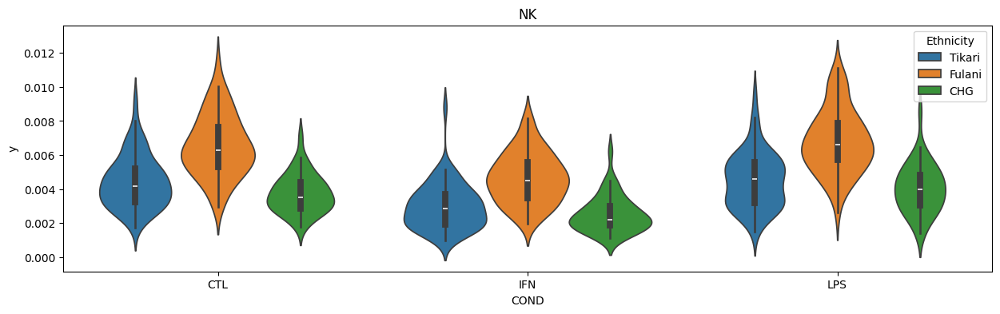

In [28]:
for ctype in ['NK']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[1]]
    plt.figure(figsize = (15,4))
    ax = sns.violinplot(pd.DataFrame({'y' : y, 'Ethnicity' : scores_means[scores_means['cytopus_names']==ctype]['Ethnicity'],
                             'COND' : scores_means[scores_means['cytopus_names']==ctype]['COND']},
                             index=scores_means[scores_means['cytopus_names']==ctype].index),
               x = 'COND', y = 'y', hue = 'Ethnicity')
    plt.title(ctype)

In [156]:
scores_cor = scores_df.corr()

<Axes: >

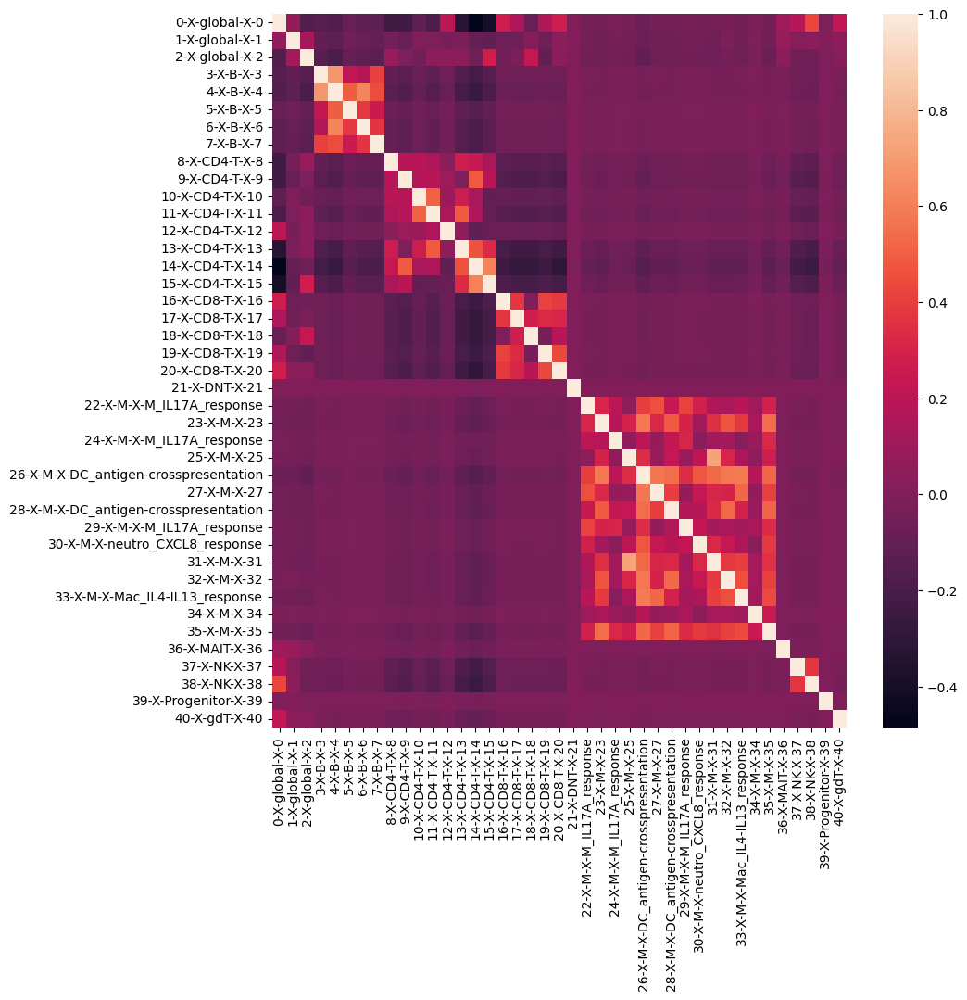

In [157]:
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(scores_cor)

In [29]:
for factor in factors:
    print(results_lmm[results_lmm['factor']==factor].sort_values('pvalue').head(10))

            var      param         pvalue  ctype          factor
2   COND[T.IFN]  -2.116452  1.785736e-189     NK  0-X-global-X-0
2   COND[T.IFN]  -1.436350   2.707619e-58    gdT  0-X-global-X-0
3   COND[T.LPS]  -1.050326   4.336105e-48     NK  0-X-global-X-0
0     Intercept   1.149186   3.871887e-24     NK  0-X-global-X-0
2   COND[T.IFN]  -0.517112   1.014376e-17  CD8-T  0-X-global-X-0
3   COND[T.LPS]  -0.761290   1.446786e-17    gdT  0-X-global-X-0
11    Group Var  12.488819   1.653061e-12  CD4-T  0-X-global-X-0
11    Group Var   5.996356   6.523730e-12  CD8-T  0-X-global-X-0
11    Group Var   1.688656   1.410029e-09    gdT  0-X-global-X-0
11    Group Var   1.372794   5.442325e-09      B  0-X-global-X-0
                    var      param        pvalue  ctype          factor
2           COND[T.IFN]  -1.097172  4.025468e-70  CD8-T  1-X-global-X-1
2           COND[T.IFN]  -0.734941  7.958124e-59  CD4-T  1-X-global-X-1
2           COND[T.IFN]  -1.205225  7.361292e-57    gdT  1-X-global-X

In [28]:
for factor in factors:
    print(results_ns_lmm[results_ns_lmm['factor']==factor].sort_values('pvalue').head(10))

            var      param         pvalue  ctype          factor
2   COND[T.IFN]  -2.168012  1.785723e-149     NK  0-X-global-X-0
2   COND[T.IFN]  -1.422323   9.878244e-46    gdT  0-X-global-X-0
3   COND[T.LPS]  -1.086943   5.963200e-39     NK  0-X-global-X-0
2   COND[T.IFN]  -0.515044   6.178531e-16  CD8-T  0-X-global-X-0
3   COND[T.LPS]  -0.781262   6.341502e-15    gdT  0-X-global-X-0
0     Intercept   1.042479   3.848042e-14     NK  0-X-global-X-0
11    Group Var  14.412449   4.044371e-09  CD4-T  0-X-global-X-0
11    Group Var   6.341594   1.078847e-08  CD8-T  0-X-global-X-0
11    Group Var   2.047723   2.267347e-07      B  0-X-global-X-0
11    Group Var   1.673810   5.199025e-07    gdT  0-X-global-X-0
                 var      param        pvalue  ctype          factor
2        COND[T.IFN]  -1.117135  7.203107e-66  CD8-T  1-X-global-X-1
2        COND[T.IFN]  -0.711033  3.800575e-57  CD4-T  1-X-global-X-1
2        COND[T.IFN]  -1.289363  2.218958e-56    gdT  1-X-global-X-1
2        

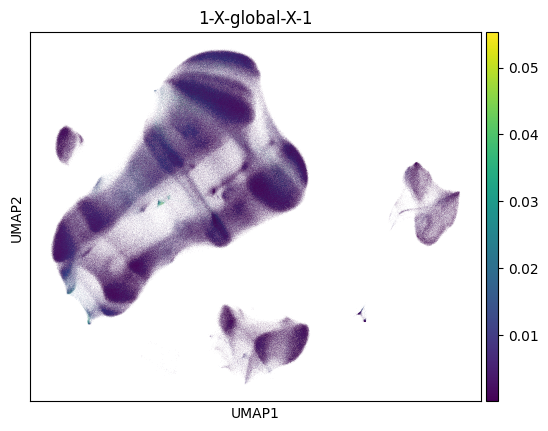

In [257]:
sc.pl.umap(adata, color=['1-X-global-X-1'])

In [26]:
sc.pl.umap(adata, color=['24-X-M-X-M_IL17A_response'])

KeyError: "Could not find 'umap' or 'X_umap' in .obsm"

In [255]:
adata.uns['SPECTRA_markers'][28]

array(['MRC1', 'MMP9', 'LYZ', 'SLC7A11', 'CYP1B1', 'CCL24', 'CYBB',
       'CLEC5A', 'CXCL8', 'INHBA', 'S100A8', 'SDC2', 'PTAFR', 'MOB3B',
       'S100A9', 'IL3RA', 'PLXDC2', 'NRP1', 'ABCC3', 'MITF', 'CSF1R',
       'FPR3', 'CCR1', 'KYNU', 'SLC11A1', 'RBM47', 'NCF2', 'CEBPB',
       'ITGAM', 'IGSF6', 'ARHGAP31', 'CLEC7A', 'PGD', 'DOCK4', 'SLC43A2',
       'ITGB2', 'AC022509.2', 'ITGAX', 'AC067751.1', 'EMP1', 'PLAUR',
       'SLC1A3', 'CYP27A1', 'IFI30', 'SPI1', 'GSN', 'RASAL2', 'RTN1',
       'COL23A1', 'FCER1G'], dtype=object)

In [229]:
adata.uns['SPECTRA_markers'][18]

array(['NELL2', 'MALAT1', 'LRRN3', 'LINC02446', 'RPL13', 'CCR7', 'RPS18',
       'RPL32', 'TPT1', 'RPS13', 'RPS12', 'RPL34', 'LTB', 'LEF1', 'RPS8',
       'RPS14', 'RPL10', 'PTPRK', 'RPS15A', 'RPL12', 'RPS23', 'RPLP1',
       'RPS3A', 'RPL39', 'RPS29', 'RPL9', 'RPL3', 'RPS2', 'RACK1', 'RPS6',
       'RPL13A', 'FTL', 'PASK', 'RPS16', 'CD8B', 'TCF7', 'RPS26', 'IL7R',
       'CAMK4', 'TRBC2', 'MT-ATP6', 'THEMIS', 'SLC35F1', 'PDE3B',
       'PABPC1', 'FAAH2', 'SERINC5', 'IL32', 'PRKCA', 'MT-CO3'],
      dtype=object)

In [60]:
adata.uns['SPECTRA_markers'][18]

array(['NELL2', 'MALAT1', 'LRRN3', 'LINC02446', 'RPL13', 'CCR7', 'RPS18',
       'RPL32', 'TPT1', 'RPS13', 'RPS12', 'RPL34', 'LTB', 'LEF1', 'RPS8',
       'RPS14', 'RPL10', 'PTPRK', 'RPS15A', 'RPL12', 'RPS23', 'RPLP1',
       'RPS3A', 'RPL39', 'RPS29', 'RPL9', 'RPL3', 'RPS2', 'RACK1', 'RPS6',
       'RPL13A', 'FTL', 'PASK', 'RPS16', 'CD8B', 'TCF7', 'RPS26', 'IL7R',
       'CAMK4', 'TRBC2', 'MT-ATP6', 'THEMIS', 'SLC35F1', 'PDE3B',
       'PABPC1', 'FAAH2', 'SERINC5', 'IL32', 'PRKCA', 'MT-CO3'],
      dtype=object)

In [61]:
adata.uns['SPECTRA_markers'][10]

array(['EGLN3', 'CCR4', 'LINC02694', 'AC005237.1', 'AC112206.2', 'GATA3',
       'AC013652.1', 'ADAM19', 'IL4R', 'CYSLTR1', 'SNED1', 'RGS1',
       'TIMP1', 'FRY', 'MCF2L2', 'SEMA5A', 'MFHAS1', 'SEC11C', 'SYTL3',
       'ITGB1', 'RTKN2', 'MAF', 'AL136456.1', 'ALOX5AP', 'FGF14',
       'S100A4', 'TIAM1', 'SLC2A3', 'GPR171', 'MAST4', 'LMO4', 'PLAAT4',
       'PKIA', 'ANXA2', 'LGALS1', 'ERN1', 'LINC01362', 'CLIC1', 'TNFRSF4',
       'CCND2', 'SEC61G', 'SUSD4', 'SEC61B', 'RCBTB2', 'IL9R',
       'CSGALNACT1', 'HSPA5', 'ICAM2', 'BATF', 'XBP1'], dtype=object)

In [258]:
adata.uns['SPECTRA_markers'][1]

array(['MALAT1', 'RPS27L', 'BIRC3', 'CREM', 'CXCR4', 'SQSTM1', 'NFKBIA',
       'SNHG12', 'RELB', 'CD7', 'TSPYL2', 'ATF4', 'RALA', 'FTH1',
       'PPP1R15A', 'PDE3B', 'IER5', 'GPX4', 'TRBC2', 'BICDL1', 'FAAH2',
       'ZEB1', 'BACH2', 'NELL2', 'SNX9', 'LEPROTL1', 'HIF1A', 'LINC01619',
       'DDB2', 'HIVEP1', 'IL7R', 'MT-ATP6', 'DHRS3', 'EMP3', 'TNFRSF10B',
       'AHI1', 'DDX21', 'HBA2', 'GPR183', 'GADD45A', 'TRAF1', 'RPLP1',
       'STK17B', 'TNFAIP3', 'DDIT4', 'LTB', 'TPT1', 'CD69', 'FYN',
       'AL627171.2'], dtype=object)

In [63]:
adata.uns['SPECTRA_markers'][30]

array(['CCL4', 'CCL3L1', 'INHBA', 'CCL3', 'LINC01010', 'CCL4L2',
       'ALDH1A2', 'LINC02345', 'PPARG', 'SLC8A1', 'LPL', 'CSF1',
       'CLEC12A', 'IL1RN', 'AQP9', 'CD86', 'ATF3', 'CT69', 'SASH1',
       'MSR1', 'SPRED1', 'MS4A7', 'MIR155HG', 'SGK1', 'RASGEF1B', 'RCAN1',
       'MYOF', 'ITGAX', 'MYO1E', 'FNIP2', 'FGD4', 'VMO1', 'HAVCR2',
       'MOB3B', 'EMP1', 'CD83', 'NEK6', 'IL3RA', 'CDK14', 'PRR16', 'CTSL',
       'RBM47', 'P2RX7', 'JAKMIP2', 'NR4A3', 'VASP', 'SNX9', 'AC006581.2',
       'C5AR1', 'SDC2'], dtype=object)

In [65]:
adata.uns['SPECTRA_markers'][15]

array(['AL109930.1', 'TSHZ2', 'FHIT', 'FAAH2', 'PLCL1', 'LEF1', 'CMTM8',
       'LINC01725', 'LEF1-AS1', 'ITGA6', 'CSGALNACT1', 'PDK1', 'PRKCA',
       'TXK', 'ITK', 'APBA2', 'IGF1R', 'IL6ST', 'CERS6', 'NELL2', 'CCR7',
       'BACH2', 'ANK3', 'SATB1-AS1', 'RNF157', 'CAMK4', 'LRRN3', 'EDA',
       'SERINC5', 'AC010609.1', 'TAF4B', 'RASGRF2', 'ADTRP', 'MAN1C1',
       'RETREG1', 'SCML1', 'AC139720.1', 'CA6', 'AC016074.2', 'SFMBT2',
       'SH3RF3', 'ABLIM1', 'AC078883.1', 'PCSK5', 'ZBTB20', 'PVT1',
       'FOXO1', 'FAM117B', 'FAM184A', 'CD55'], dtype=object)

In [66]:
adata.uns['SPECTRA_markers'][6]

array(['OSBPL10', 'BANK1', 'GNG7', 'TBC1D9', 'BLK', 'AP002075.1',
       'MARCH1', 'SETBP1', 'IGHA1', 'RALGPS2', 'TNFRSF13B', 'EBF1',
       'TFEC', 'AIM2', 'IGHA2', 'COBLL1', 'SOX5', 'ADAM28', 'AC120193.1',
       'DENND5B', 'TEX9', 'IGHG1', 'AFF3', 'SGPP1', 'COL4A4', 'ARHGAP24',
       'IGHG3', 'CDK14', 'LARGE1', 'SCIMP', 'SSPN', 'C12orf74', 'MS4A1',
       'CCDC50', 'AL592429.2', 'CLECL1', 'TSBP1-AS1', 'IGHG2', 'CIITA',
       'USP6NL', 'COL4A3', 'POU2AF1', 'LINC01781', 'LINC00926', 'ANGPTL1',
       'WDFY4', 'GRAMD1C', 'PLCG2', 'MEF2C', 'ZDHHC14'], dtype=object)

In [69]:
adata.uns['SPECTRA_markers'][20]

array(['CD8A', 'CD8B', 'ST8SIA1', 'EPHA4', 'TNIP3', 'JAML', 'MVB12B',
       'ITGA1', 'AC006369.1', 'AC026341.1', 'INPP4B', 'TPRG1', 'CD2',
       'CD3G', 'PDE4B', 'CD84', 'PAM', 'CXCR4', 'ARID5B', 'PIK3R1',
       'PCNX2', 'TRERF1', 'LINC00649', 'AC053513.1', 'LY9', 'LINC01934',
       'ITK', 'TC2N', 'CDC14A', 'CLDND1', 'WAKMAR2', 'GZMM', 'TRPS1',
       'AC104170.1', 'GLCCI1', 'DAPK2', 'DUSP16', 'AOAH', 'NIBAN1',
       'CDHR3', 'CATSPERB', 'LEPROTL1', 'ZSWIM5', 'ARHGAP35', 'SAMD3',
       'SPEF2', 'SH2D1A', 'P2RY8', 'GRAP2', 'ZNF831'], dtype=object)

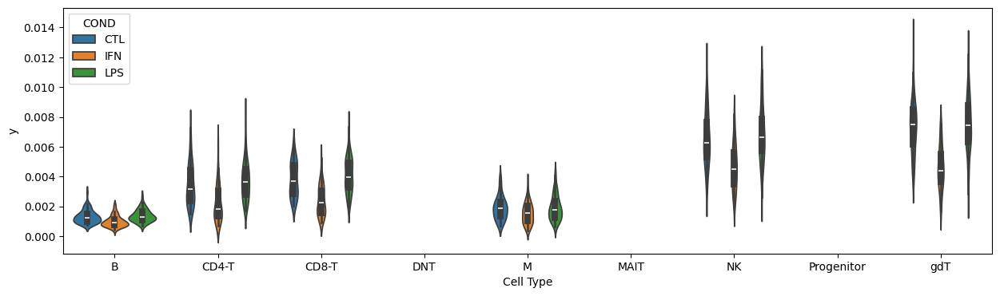

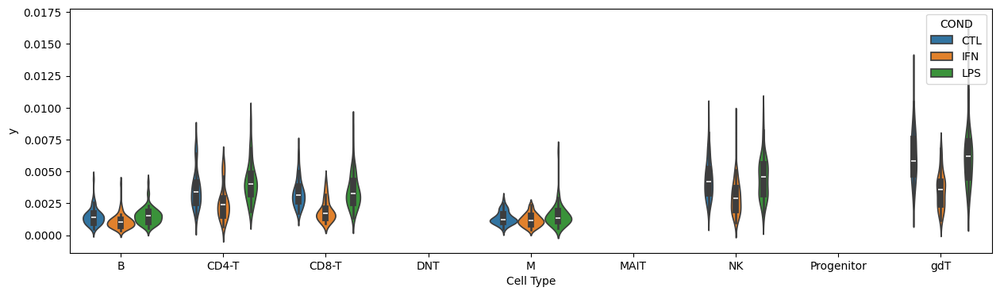

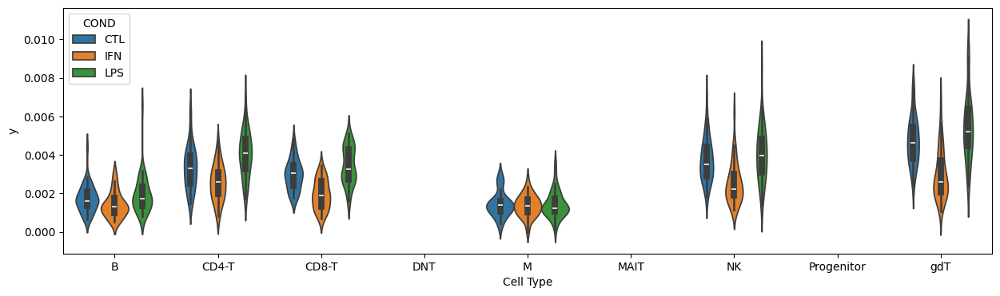

In [259]:
for POP in ['Fulani','Tikari','CHG']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[1]]
    plt.figure(figsize = (15,4))
    ax = sns.violinplot(pd.DataFrame({'y' : y, 'Cell Type' : scores_means[scores_means['Ethnicity']==POP]['cytopus_names'],
                             'COND' : scores_means[scores_means['Ethnicity']==POP]['COND']},
                             index=scores_means[scores_means['Ethnicity']==POP].index),
               x = 'Cell Type', y = 'y', hue = 'COND')

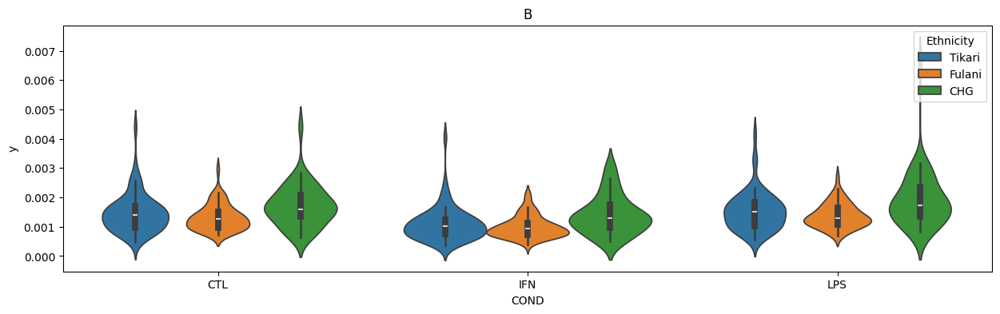

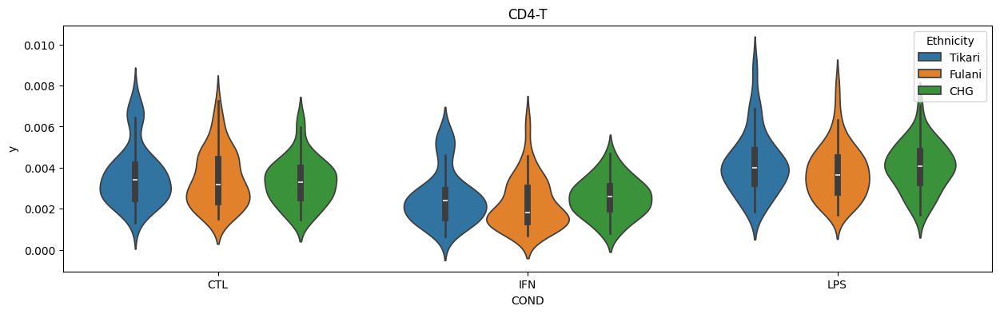

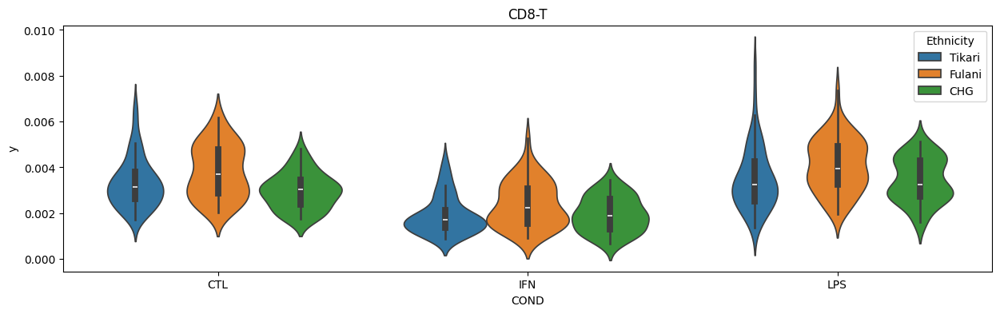

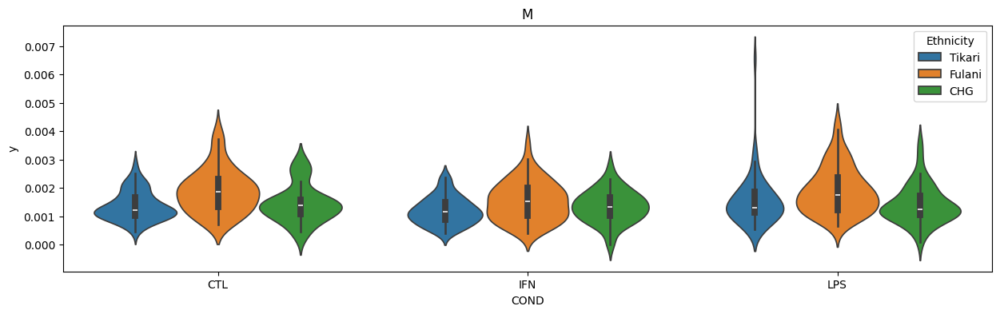

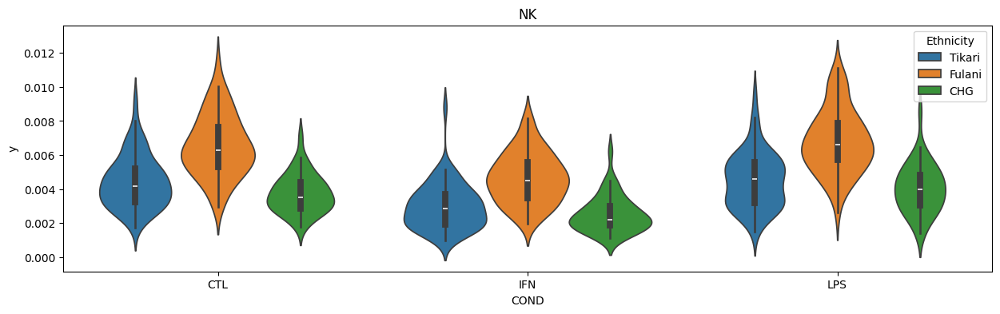

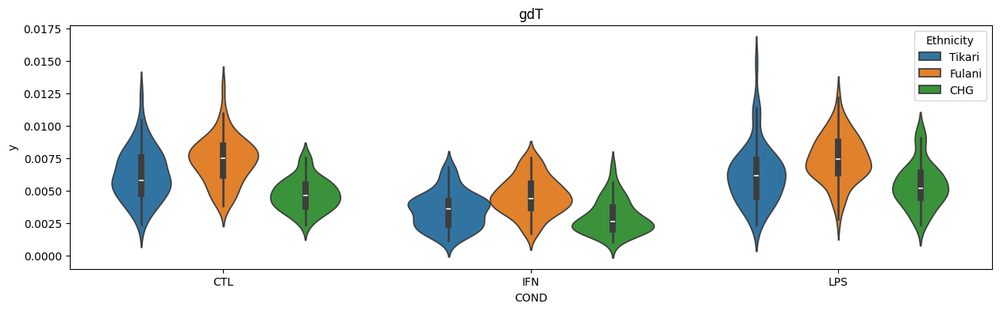

In [263]:
for ctype in ['B','CD4-T','CD8-T','M','NK','gdT']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[1]]
    plt.figure(figsize = (15,4))
    ax = sns.violinplot(pd.DataFrame({'y' : y, 'Ethnicity' : scores_means[scores_means['cytopus_names']==ctype]['Ethnicity'],
                             'COND' : scores_means[scores_means['cytopus_names']==ctype]['COND']},
                             index=scores_means[scores_means['cytopus_names']==ctype].index),
               x = 'COND', y = 'y', hue = 'Ethnicity')
    plt.title(ctype)

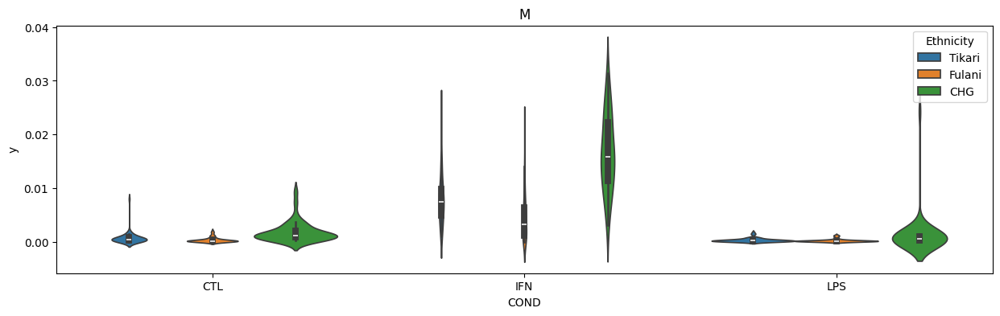

In [48]:
for ctype in ['M']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[25]]
    plt.figure(figsize = (15,4))
    ax = sns.violinplot(pd.DataFrame({'y' : y, 'Ethnicity' : scores_means[scores_means['cytopus_names']==ctype]['Ethnicity'],
                             'COND' : scores_means[scores_means['cytopus_names']==ctype]['COND']},
                             index=scores_means[scores_means['cytopus_names']==ctype].index),
               x = 'COND', y = 'y', hue = 'Ethnicity')
    plt.title(ctype)

In [183]:
adata.uns['SPECTRA_markers'][10]

array(['EGLN3', 'CCR4', 'LINC02694', 'AC005237.1', 'AC112206.2', 'GATA3',
       'AC013652.1', 'ADAM19', 'IL4R', 'CYSLTR1', 'SNED1', 'RGS1',
       'TIMP1', 'FRY', 'MCF2L2', 'SEMA5A', 'MFHAS1', 'SEC11C', 'SYTL3',
       'ITGB1', 'RTKN2', 'MAF', 'AL136456.1', 'ALOX5AP', 'FGF14',
       'S100A4', 'TIAM1', 'SLC2A3', 'GPR171', 'MAST4', 'LMO4', 'PLAAT4',
       'PKIA', 'ANXA2', 'LGALS1', 'ERN1', 'LINC01362', 'CLIC1', 'TNFRSF4',
       'CCND2', 'SEC61G', 'SUSD4', 'SEC61B', 'RCBTB2', 'IL9R',
       'CSGALNACT1', 'HSPA5', 'ICAM2', 'BATF', 'XBP1'], dtype=object)

In [184]:
adata.uns['SPECTRA_markers'][40]

array(['TRGC1', 'TRDC', 'KLRC1', 'KLRD1', 'GNLY', 'TRGV9', 'NKG7',
       'C1orf21', 'PZP', 'A2M', 'TRGC2', 'AC243829.2', 'TRDV2', 'LAG3',
       'PRF1', 'GZMB', 'KLRB1', 'LINC02384', 'SYTL2', 'AF165147.1',
       'KLRG1', 'AOAH', 'PYHIN1', 'PDGFD', 'TGFBR3', 'PTMS', 'ZBP1',
       'CD3G', 'CCL5', 'TRG-AS1', 'GBP5', 'GZMH', 'FGFBP2', 'OASL',
       'MYBL1', 'ODF2L', 'ZEB2', 'IFIT3', 'TNFAIP3', 'AC244502.1',
       'SAMD3', 'HERC5', 'CD247', 'SAMD9', 'NFATC2', 'PPP2R2B', 'CST7',
       'RSAD2', 'IL18RAP', 'PLCB1'], dtype=object)

### Visualization and exploration

In [9]:
ctype_cond_means = scores_df.merge(adata.obs[['ct2','COND']], left_index=True, right_index=True) \
    .groupby(['ct2','COND']).mean()

In [10]:
ctype_pop_means = scores_df.merge(adata.obs[['ct2','Ethnicity']], left_index=True, right_index=True) \
    .groupby(['ct2','Ethnicity']).mean()

In [11]:
ctype_means = scores_df.merge(adata.obs[['ct2','COND','Ethnicity']], left_index=True, right_index=True) \
    .groupby(['ct2','COND','Ethnicity']).mean()

<Axes: ylabel='ct2-COND-Ethnicity'>

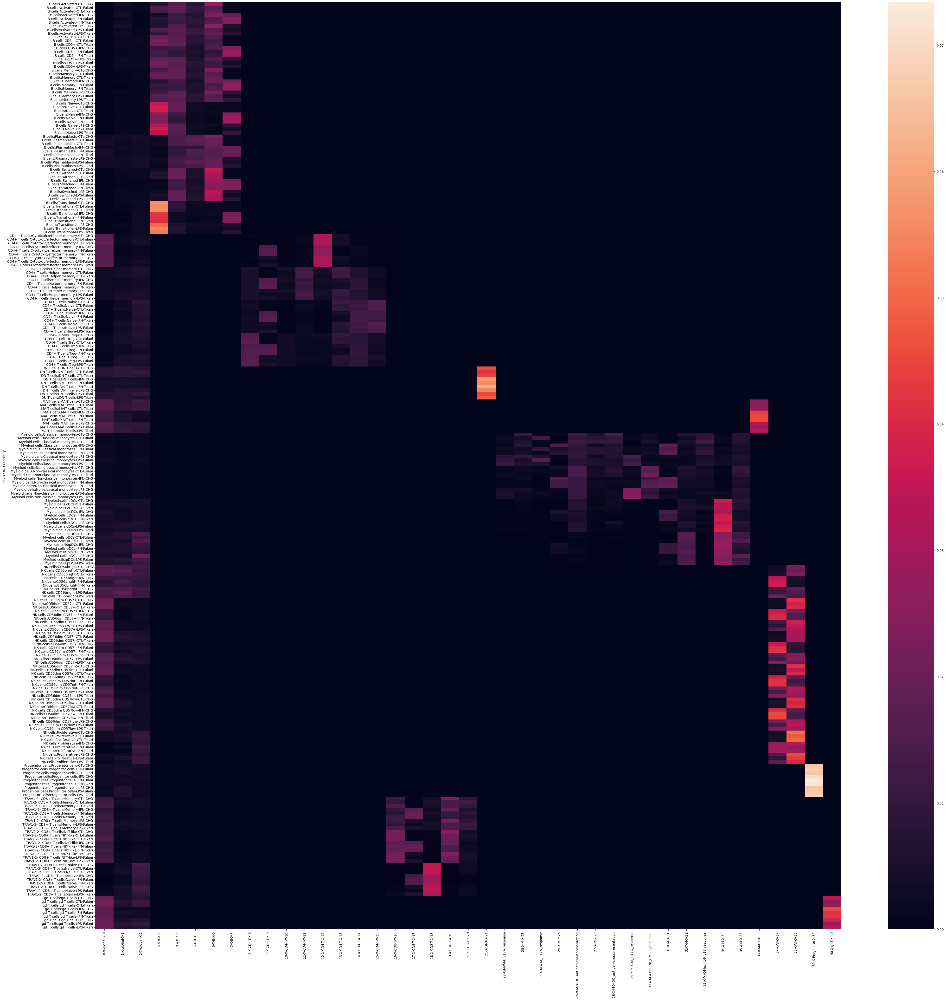

In [185]:
fig, ax = plt.subplots(figsize=(50,50))
sns.heatmap(ctype_means)

<Axes: ylabel='ct2-COND'>

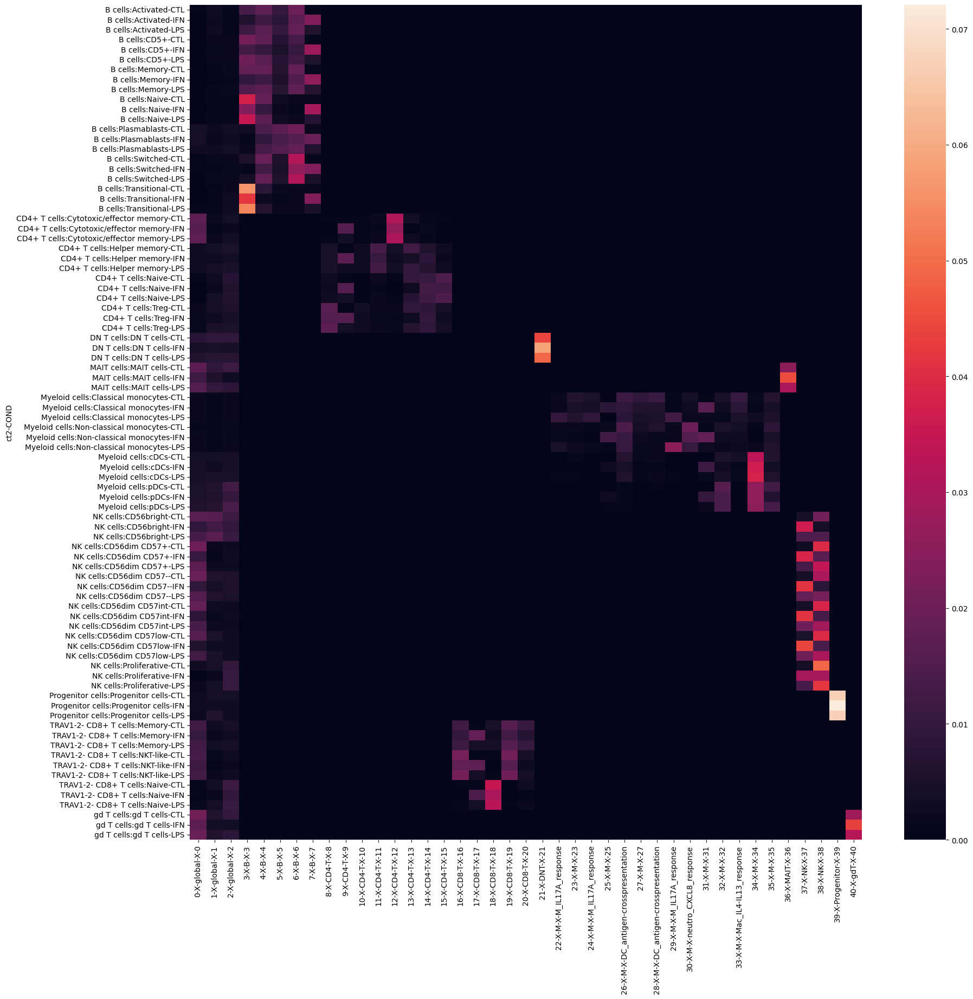

In [180]:
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(ctype_cond_means)

<Axes: ylabel='ct2-Ethnicity'>

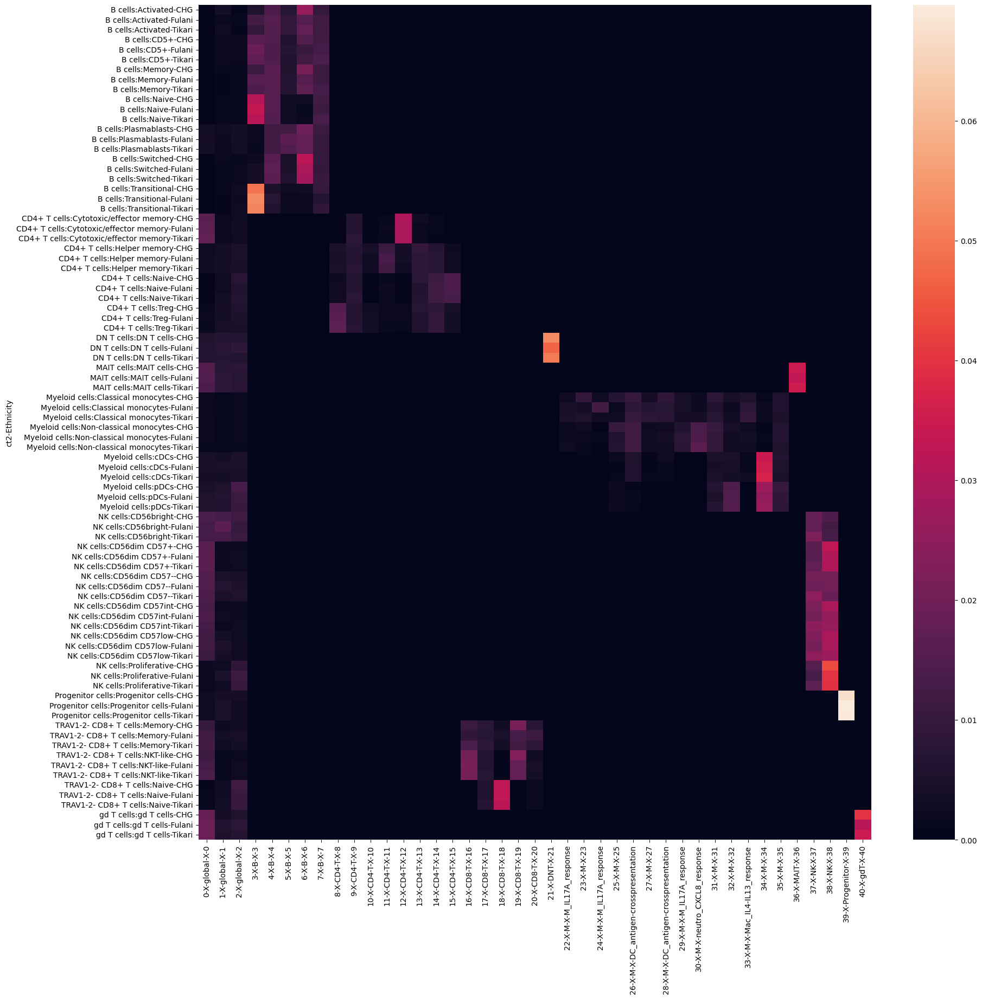

In [176]:
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(ctype_pop_means)

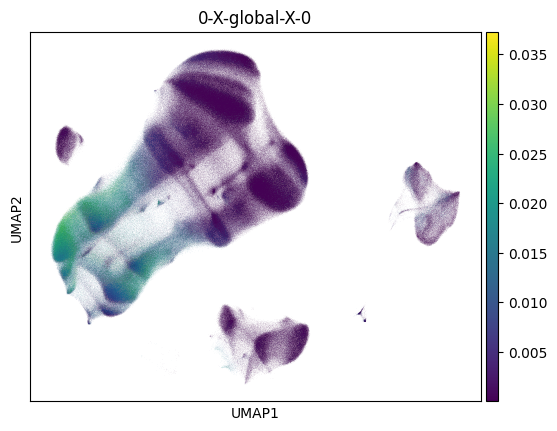

In [49]:
sc.pl.umap(adata, color='0-X-global-X-0')

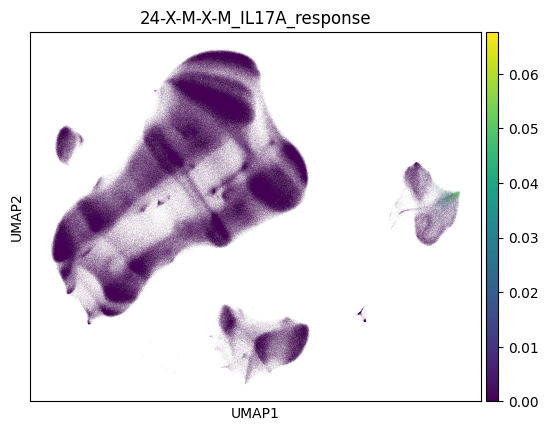

In [30]:
sc.pl.umap(adata, color='24-X-M-X-M_IL17A_response')

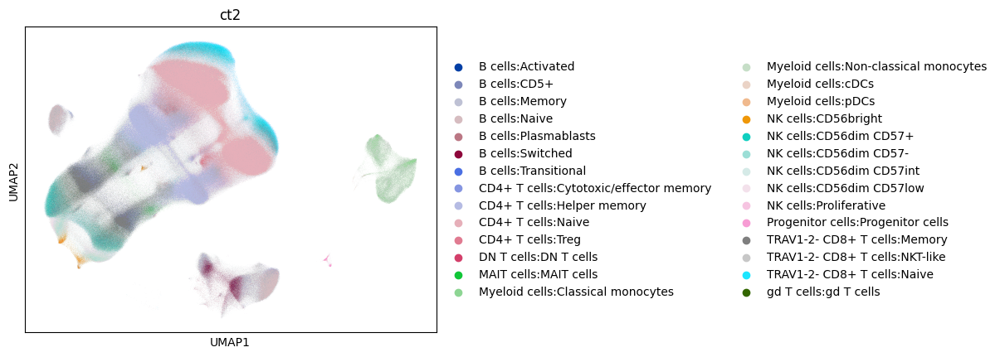

In [169]:
sc.pl.umap(adata, color='ct2')

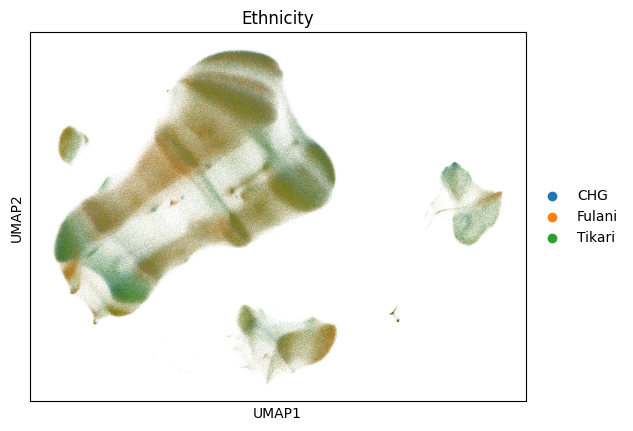

In [156]:
sc.pl.umap(adata, color='Ethnicity')

## Re-cluster monocytes and analyze factor 24

In [6]:
adata = sc.read_h5ad(spectra_file, backed='r')

In [7]:
adata_m = adata[adata.obs['cytopus_names']=="M"].to_memory()

In [8]:
scores_df = pd.DataFrame(adata_m.obsm['SPECTRA_cell_scores'], index=adata_m.obs.index, columns=adata_m.uns['SPECTRA_overlap'].index)

In [9]:
adata_m.obs[adata_m.uns['SPECTRA_overlap'].index] = scores_df

In [10]:
adata_m

AnnData object with n_obs × n_vars = 84193 × 36601
    obs: 'donor_id', 'library', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'log10_total_counts', 'doublet_score', 'predicted_doublet', 'FID', 'LID', 'TID', 'COHORT', 'COND', 'SEX', 'AGE', 'POP', 'Ethnicity', 'FCluster_names', 'Cluster_names', 'SCluster_names', 'cytopus_names', '0-X-global-X-0', '1-X-global-X-1', '2-X-global-X-2', '3-X-B-X-3', '4-X-B-X-4', '5-X-B-X-5', '6-X-B-X-6', '7-X-B-X-7', '8-X-CD4-T-X-8', '9-X-CD4-T-X-9', '10-X-CD4-T-X-10', '11-X-CD4-T-X-11', '12-X-CD4-T-X-12', '13-X-CD4-T-X-13', '14-X-CD4-T-X-14', '15-X-CD4-T-X-15', '16-X-CD8-T-X-16', '17-X-CD8-T-X-17', '18-X-CD8-T-X-18', '19-X-CD8-T-X-19', '20-X-CD8-T-X-20', '21-X-DNT-X-21', '22-X-M-X-M_IL17A_response', '23-X-M-X-23', '24-X-M-X-M_IL17A_response', '25-X-M-X-25', '26-X-M-X-DC_antigen-crosspresentation', '27-X-M-X-27', '28-X-M-X-DC_antigen-crosspresentation', '29-X-M-X-M_IL17A_response', '30-X-M-X-ne

In [15]:
# highly variable genes                                                                                                                                         
sc.pp.highly_variable_genes(adata_m, batch_key='BATCH')

# PCA                                                                                                                                                           
sc.tl.pca(adata_m, use_highly_variable=True, svd_solver='arpack')

# Run Harmony batch correction                                                                                                                                  
sce.pp.harmony_integrate(adata_m, 'BATCH')

# Calculate neighbors                                                                                                                                           
sc.pp.neighbors(adata_m, n_neighbors=50, n_pcs=30, use_rep='X_pca_harmony', key_added='neighbors_harmony')

# Leiden clustering                                                                                                                                             
sc.tl.leiden(adata_m, neighbors_key="neighbors_harmony", flavor="igraph", n_iterations=2)

# UMAP projection                                                                                                                                               
sc.tl.umap(adata_m, min_dist=0.25, neighbors_key='neighbors_harmony')

2025-05-26 13:27:44,928 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-05-26 13:28:12,925 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-05-26 13:28:13,230 - harmonypy - INFO - Iteration 1 of 10
2025-05-26 13:28:50,456 - harmonypy - INFO - Iteration 2 of 10
2025-05-26 13:29:27,604 - harmonypy - INFO - Iteration 3 of 10
2025-05-26 13:29:58,839 - harmonypy - INFO - Iteration 4 of 10
2025-05-26 13:30:26,832 - harmonypy - INFO - Iteration 5 of 10
2025-05-26 13:30:47,206 - harmonypy - INFO - Iteration 6 of 10
2025-05-26 13:31:03,853 - harmonypy - INFO - Iteration 7 of 10
2025-05-26 13:31:18,500 - harmonypy - INFO - Iteration 8 of 10
2025-05-26 13:31:33,819 - harmonypy - INFO - Iteration 9 of 10
2025-05-26 13:31:50,146 - harmonypy - INFO - Iteration 10 of 10
2025-05-26 13:32:05,624 - harmonypy - INFO - Stopped before convergence


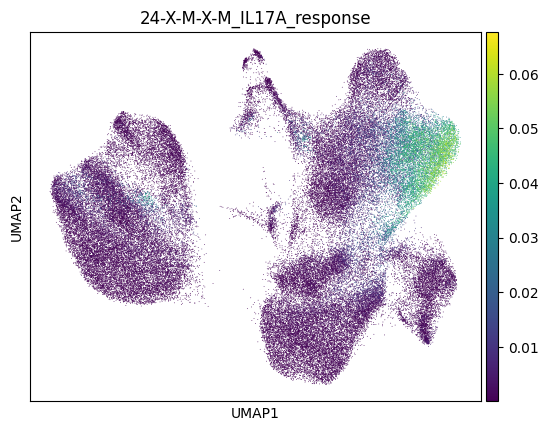

In [19]:
sc.pl.umap(adata_m, color=['24-X-M-X-M_IL17A_response'])

In [11]:
adata_m.obs['factor_24'] = pd.Series(adata_m.obs['24-X-M-X-M_IL17A_response'] > 0.02, dtype="category")

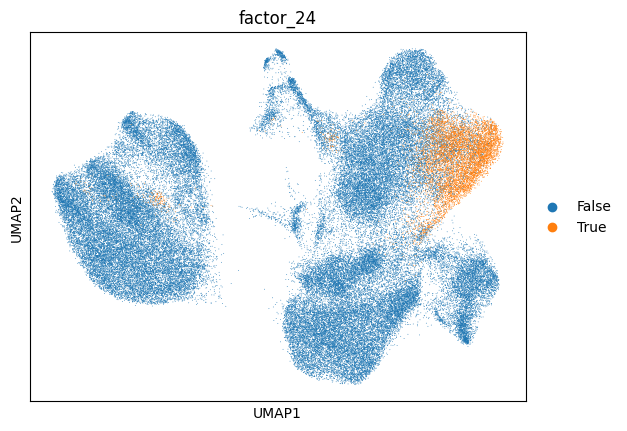

In [53]:
sc.pl.umap(adata_m, color=['factor_24'])

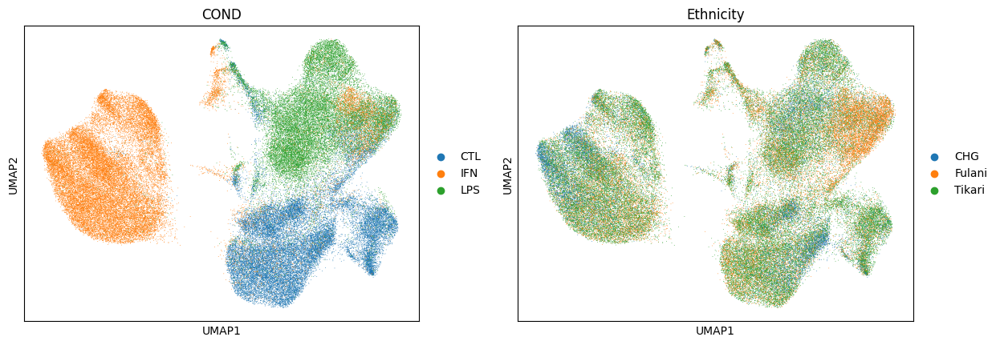

In [22]:
sc.pl.umap(adata_m, color=['COND','Ethnicity'])

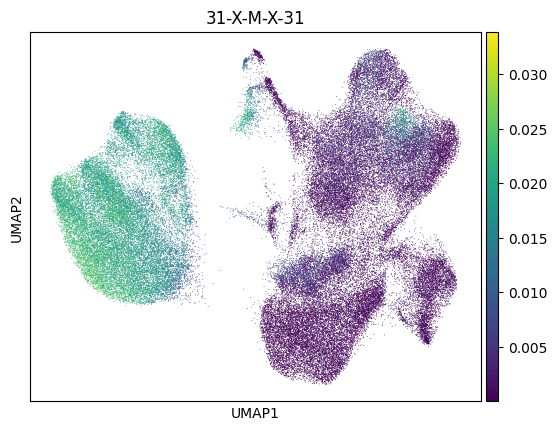

In [43]:
sc.pl.umap(adata_m, color='31-X-M-X-31')

In [96]:
median_24 = adata_m.obs[['TID','Ethnicity','24-X-M-X-M_IL17A_response']].groupby(['TID'])['24-X-M-X-M_IL17A_response'].median().reset_index().merge(adata.obs[['TID','Ethnicity']].drop_duplicates())

<Axes: xlabel='Ethnicity', ylabel='24-X-M-X-M_IL17A_response'>

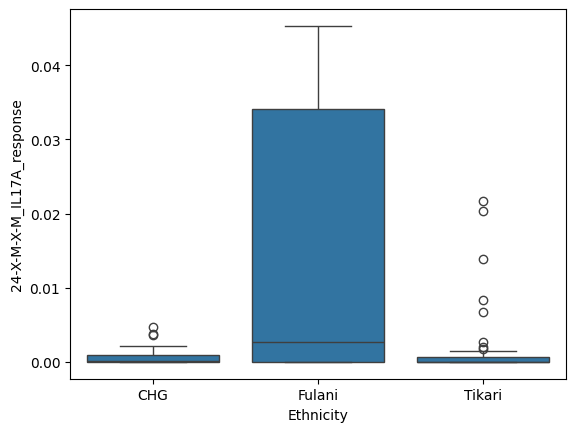

In [25]:
sns.boxplot(median_24, x='Ethnicity', y='24-X-M-X-M_IL17A_response')

In [87]:
adata_m.obs['factor_24'] = pd.Series(adata_m.obs['24-X-M-X-M_IL17A_response'] > 0.02, dtype="category")

In [19]:
frac_24 = adata_m.obs.groupby(['TID','COND'])['factor_24'].apply(lambda x: np.mean(x==True)).reset_index().merge(adata.obs[['TID','Ethnicity','SEX','AGE']].drop_duplicates())

In [16]:
site_info = site_collect[['TID','site','date']]

In [23]:
frac_24 = frac_24.merge(site_info)

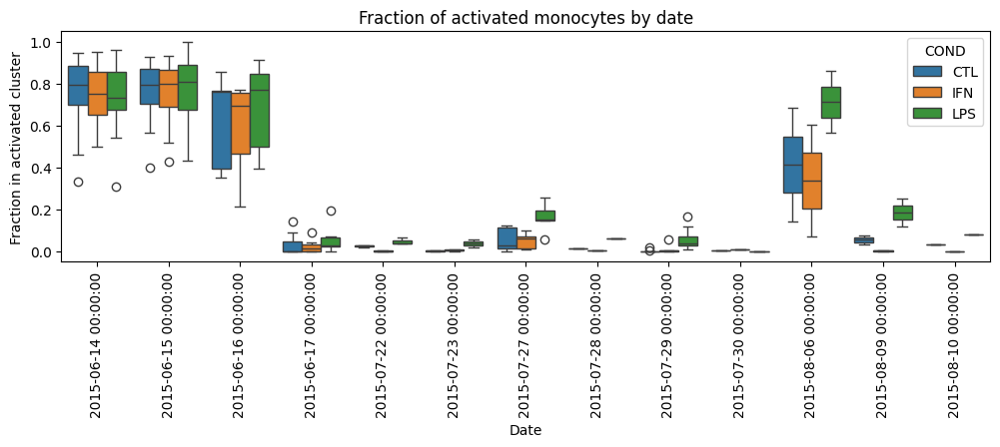

In [28]:
plt.figure(figsize=(12, 3))
ax = sns.boxplot(x='date', y='factor_24', data=frac_24[frac_24['Ethnicity']=="Fulani"].sort_values('date'), hue='COND')
#ax = sns.swarmplot(x='date', y='factor24', data=site_date_f24_frac, hue='Ethnicity')
ax.tick_params(axis='x', rotation=90)
plt.title('Fraction of activated monocytes by date')
plt.xlabel('Date')
plt.ylabel('Fraction in activated cluster')
plt.show()

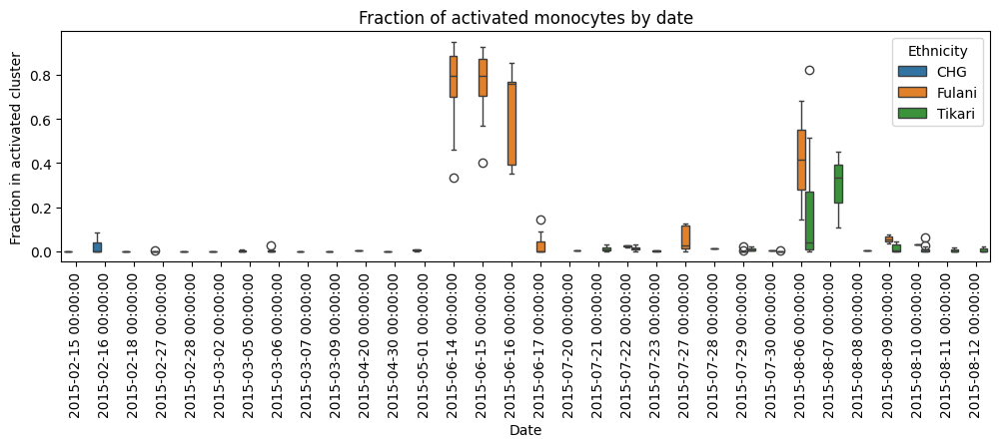

In [29]:
plt.figure(figsize=(12, 3))
ax = sns.boxplot(x='date', y='factor_24', data=frac_24[frac_24['COND']=="CTL"].sort_values('date'), hue='Ethnicity')
#ax = sns.swarmplot(x='date', y='factor24', data=site_date_f24_frac, hue='Ethnicity')
ax.tick_params(axis='x', rotation=90)
plt.title('Fraction of activated monocytes by date')
plt.xlabel('Date')
plt.ylabel('Fraction in activated cluster')
plt.show()

In [99]:
pd.crosstab(frac_24['Ethnicity'],frac_24['site'])

site,Bidou I,Missoume,Ndtoua,Njibot,Nkolbikong,Ntambang,Sabga
Ethnicity,,,,,,,
CHG,1,5,3,10,21,0,0
Fulani,0,0,0,0,0,21,39
Tikari,0,0,0,0,0,52,10


In [100]:
pd.crosstab(frac_24['Ethnicity'],frac_24['date'])

date,2015-02-15 00:00:00,2015-02-16 00:00:00,2015-02-18 00:00:00,2015-02-27 00:00:00,2015-02-28 00:00:00,2015-03-02 00:00:00,2015-03-05 00:00:00,2015-03-06 00:00:00,2015-03-07 00:00:00,2015-03-09 00:00:00,...,2015-07-28 00:00:00,2015-07-29 00:00:00,2015-07-30 00:00:00,2015-08-06 00:00:00,2015-08-07 00:00:00,2015-08-08 00:00:00,2015-08-09 00:00:00,2015-08-10 00:00:00,2015-08-11 00:00:00,2015-08-12 00:00:00
Ethnicity,,,,,,,,,,,,,,,,,,,,,
CHG,1,3,1,6,2,2,3,11,4,3,...,0,0,0,0,0,0,0,0,0,0
Fulani,0,0,0,0,0,0,0,0,0,0,...,1,9,1,2,0,0,2,1,0,0
Tikari,0,0,0,0,0,0,0,0,0,0,...,0,3,4,12,3,1,6,14,6,3


In [107]:
sabga_samps = frac_24[frac_24['site']=="Sabga"]

In [108]:
pd.crosstab(sabga_samps['Ethnicity'],sabga_samps['date'])

date,2015-06-14 00:00:00,2015-06-15 00:00:00,2015-06-16 00:00:00,2015-06-17 00:00:00,2015-07-20 00:00:00,2015-07-21 00:00:00,2015-07-22 00:00:00,2015-07-23 00:00:00
Ethnicity,,,,,,,,
Fulani,12,10,5,7,0,0,3,2
Tikari,0,0,0,0,1,3,6,0


<Axes: xlabel='site', ylabel='factor_24'>

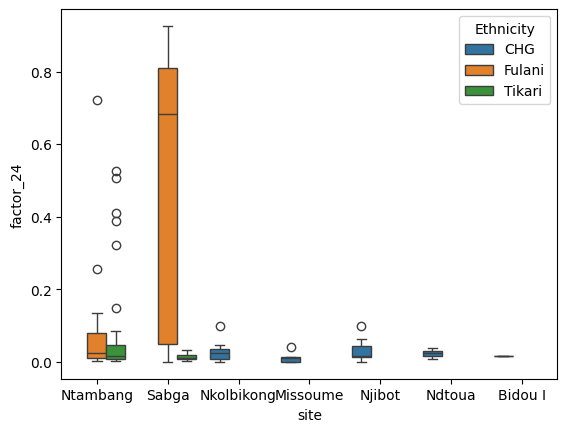

In [136]:
sns.boxplot(frac_24, x='site', y='factor_24', hue='Ethnicity')

([0, 1, 2, 3, 4, 5, 6, 7],
 [Text(0, 0, '2015-07-21 00:00:00'),
  Text(1, 0, '2015-06-14 00:00:00'),
  Text(2, 0, '2015-07-22 00:00:00'),
  Text(3, 0, '2015-06-16 00:00:00'),
  Text(4, 0, '2015-07-23 00:00:00'),
  Text(5, 0, '2015-06-15 00:00:00'),
  Text(6, 0, '2015-06-17 00:00:00'),
  Text(7, 0, '2015-07-20 00:00:00')])

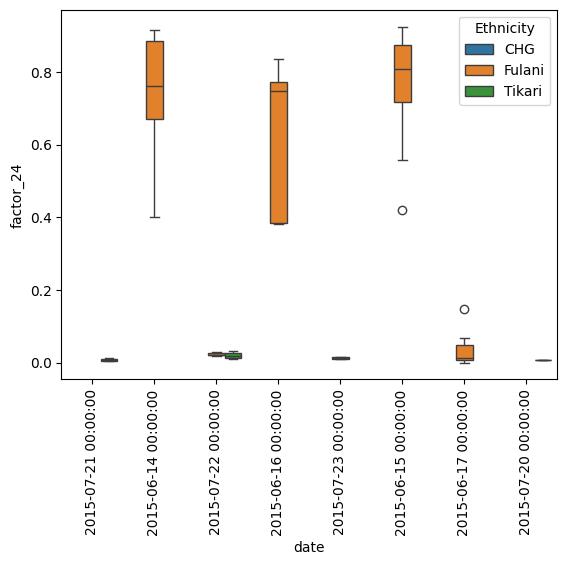

In [116]:
sns.boxplot(sabga_samps, x='date', y='factor_24', hue='Ethnicity')
plt.xticks(rotation=90)

In [134]:
adata.obs[['site','date']] = adata.obs[['TID']].reset_index().merge(site_info).set_index('index')[['site','date']]

In [137]:
adata.obs['Sabga'] = pd.Series(adata.obs['site']=="Sabga", dtype='category')

In [76]:
pheno.merge(frac_24).plot.scatter(x='factor_24', y='Subject_Measurement:Anthropometric:Body_Fat_Percentage::num::frac')

,TID,site
0,NaN,Meridi Western Equatoria
1,NaN,Dar Al Salam Alhaj Yousif
2,NaN,NaN
3,NaN,Kwamba Suleja
4,NaN,Foreigner Guadeloupe; French West Indies
...,...,...
15665,NA19983,NaN
15666,NA20128,NaN
15667,NA20129,NaN
15668,NA20279,NaN


<Axes: xlabel='Ethnicity', ylabel='factor_24'>

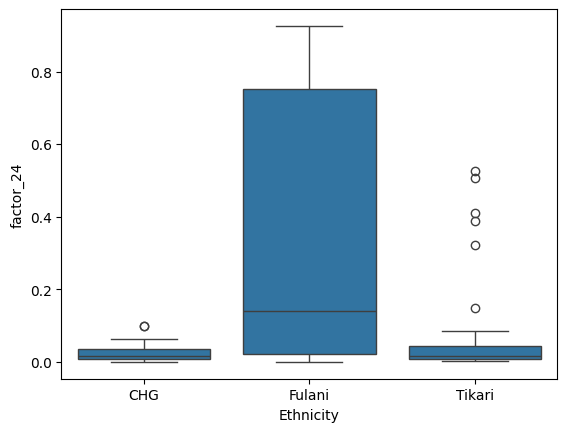

In [45]:
sns.boxplot(frac_24, x='Ethnicity', y='factor_24')

<Axes: >

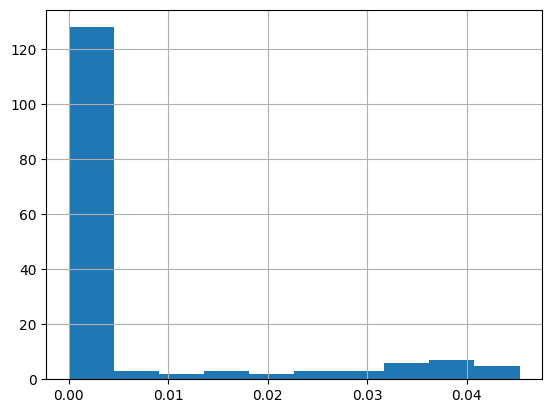

In [21]:
median_24['24-X-M-X-M_IL17A_response'].hist()

In [7]:
adata_mi = adata_m[adata_m.obs['COND']=="IFN"]

<Axes: >

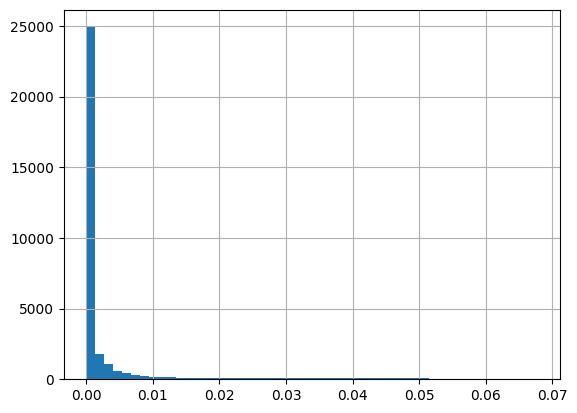

In [8]:
adata_mi.obs['24-X-M-X-M_IL17A_response'].hist(bins=50)

In [9]:
adata_mi.obs['factor_24'] = pd.Series(adata_mi.obs['24-X-M-X-M_IL17A_response'] > 0.02, dtype="category")

In [10]:
# get genes that differentiate IFN cells in factor 24 from the rest)
sc.tl.rank_genes_groups(adata_mi, groupby='factor_24')

In [12]:
sc.get.rank_genes_groups_df(adata_mi, group="True").head(15)

,names,scores,logfoldchanges,pvals,pvals_adj
0,CXCL8,144.219299,5.812652,0.0,0.0
1,IL1B,129.108521,7.450198,0.0,0.0
2,SOD2,121.724510,3.869273,0.0,0.0
3,KYNU,98.762421,2.762802,0.0,0.0
4,AC025580.2,98.696022,3.788397,0.0,0.0
5,ST3GAL1,91.782501,3.409598,0.0,0.0
6,MMP14,90.984100,3.962086,0.0,0.0
7,SOX5,89.237030,7.411920,0.0,0.0
8,NAMPT,84.100601,2.983351,0.0,0.0
9,EPB41L3,80.108688,2.937699,0.0,0.0


In [13]:
sc.get.rank_genes_groups_df(adata_mi, group="False").head(15)

,names,scores,logfoldchanges,pvals,pvals_adj
0,LPL,181.984787,6.389971,0.0,0.0
1,FABP5,169.908295,5.576745,0.0,0.0
2,MFSD12,167.708694,3.952071,0.0,0.0
3,FGL2,162.334427,5.727498,0.0,0.0
4,ACP5,151.453278,4.581734,0.0,0.0
5,CD52,146.724838,4.204122,0.0,0.0
6,ITGB7,133.487503,4.688055,0.0,0.0
7,DOCK3,130.035980,4.996988,0.0,0.0
8,SCIMP,129.140167,5.187401,0.0,0.0
9,CD84,128.947006,4.466215,0.0,0.0


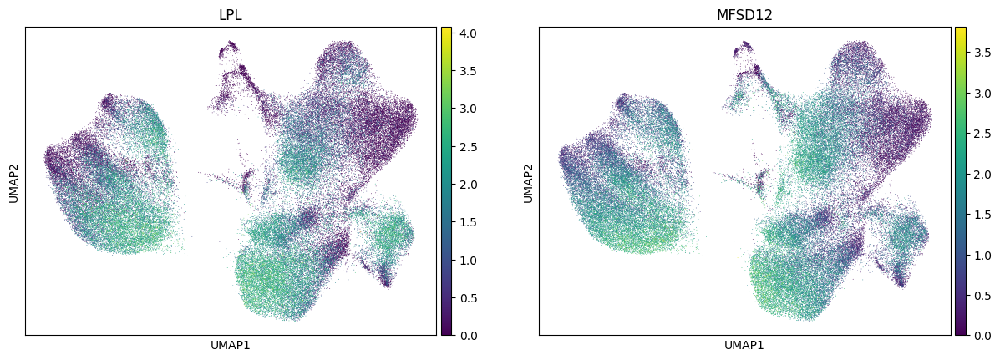

In [67]:
sc.pl.umap(adata_m, color=['LPL','MFSD12'])

In [81]:
adata_ml = adata_m[adata_m.obs['COND']=="LPS"]
adata_ml.obs['factor_24'] = pd.Series(adata_ml.obs['24-X-M-X-M_IL17A_response'] > 0.02, dtype="category")
sc.tl.rank_genes_groups(adata_ml, groupby='factor_24', method='wilcoxon')

In [85]:
sc.get.rank_genes_groups_df(adata_ml, group="True").head(10)

,names,scores,logfoldchanges,pvals,pvals_adj
0,SOX5,76.182953,4.365325,0.0,0.0
1,EPB41L3,75.902962,2.910522,0.0,0.0
2,NAMPT,75.451973,2.523022,0.0,0.0
3,CXCL5,73.186935,5.069417,0.0,0.0
4,PID1,73.003181,4.725481,0.0,0.0
5,CXCL1,70.693352,4.445156,0.0,0.0
6,MMP14,69.790359,2.164228,0.0,0.0
7,PFKFB3,69.543175,2.602283,0.0,0.0
8,SLC25A37,67.204407,2.868820,0.0,0.0
9,AC025580.2,65.056885,2.005345,0.0,0.0


In [86]:
sc.get.rank_genes_groups_df(adata_ml, group="False").head(10)

,names,scores,logfoldchanges,pvals,pvals_adj
0,MFSD12,67.629883,3.660080,0.0,0.0
1,CSF1,64.804688,3.861357,0.0,0.0
2,NEK6,63.080952,2.701889,0.0,0.0
3,VIM,62.716801,1.803548,0.0,0.0
4,REL,61.472668,2.054548,0.0,0.0
5,ARHGAP10,61.239582,2.141416,0.0,0.0
6,ATF3,61.104904,3.300838,0.0,0.0
7,RNF19A,60.738636,2.110821,0.0,0.0
8,LSP1,60.522018,2.667191,0.0,0.0
9,CD83,59.938332,1.882034,0.0,0.0


In [ ]:
adata_mc = adata_m[adata_m.obs['COND']=="CTL"]
adata_mc.obs['factor_24'] = pd.Series(adata_mc.obs['24-X-M-X-M_IL17A_response'] > 0.02, dtype="category")
sc.tl.rank_genes_groups(adata_mc, groupby='factor_24', method='wilcoxon')

In [ ]:
sc.get.rank_genes_groups_df(adata_mc, group="True").head(10)

In [ ]:
sc.get.rank_genes_groups_df(adata_mc, group="False").head(10)

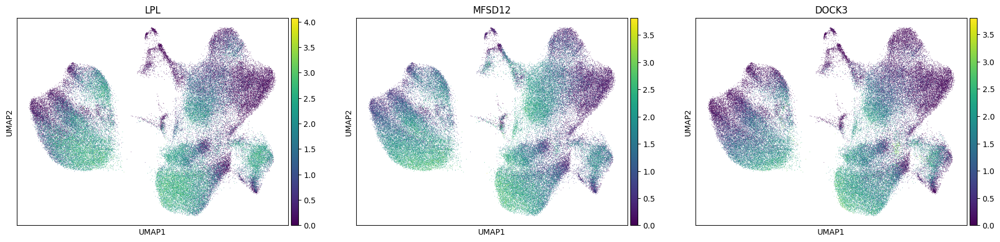

In [79]:
sc.pl.umap(adata_m, color=['LPL','MFSD12','DOCK3'])

In [ ]:
sc.tl.rank_genes_groups(adata_m, groupby='COND', method='wilcoxon')

In [ ]:
sc.get.rank_genes_groups_df(adata_m, group="True").head(10)

In [ ]:
sc.get.rank_genes_groups_df(adata_m, group="False").head(10)

In [45]:
adata.uns['SPECTRA_markers'][31]

array(['CTSL', 'EMP1', 'IL1RN', 'ATF3', 'RSAD2', 'APOBEC3A', 'IFITM3',
       'TNFSF13B', 'ISG15', 'IFIT3', 'TYMP', 'CCL3', 'MX1', 'HES4',
       'CCR1', 'CCL2', 'IFIT2', 'GMPR', 'CDKN1A', 'OAS1', 'IFIT1',
       'CMPK2', 'SCIMP', 'LAP3', 'MX2', 'MYOF', 'GBP1', 'TNFSF10',
       'LGALS3', 'IFI6', 'DOCK4', 'HERC5', 'RIN2', 'OAS3', 'MAFB',
       'USP18', 'SRGAP2B', 'SRGAP2', 'LY6E', 'PLSCR1', 'IRF7', 'DUSP6',
       'EPSTI1', 'IFIH1', 'OASL', 'IFI35', 'WARS', 'TFEC', 'DDX58',
       'IFI44'], dtype=object)

In [ ]:
sc.pl.umap(adata_m, color=['COND','Ethnicity'])

In [29]:
fulani_age = adata_m[adata_m.obs['Ethnicity']=="Fulani"].obs[['TID','SEX','AGE']].drop_duplicates().sort_values('AGE')

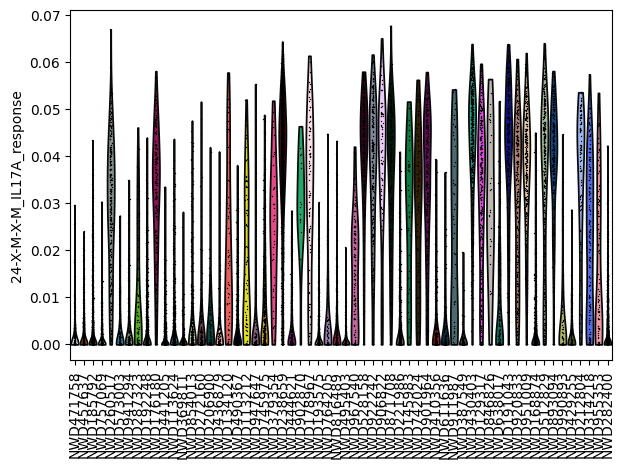

In [33]:
sc.pl.violin(adata_m[adata_m.obs['Ethnicity']=="Fulani"],
             keys='24-X-M-X-M_IL17A_response', 
             groupby='TID',
             order=fulani_age['TID'],
             rotation=90)

In [ ]:
sc.pl.violin(adata_m[(adata_m.obs['Ethnicity']=="Fulani")], keys='24-X-M-X-M_IL17A_response', groupby='TID', rotation=90)

## Association of factors with gene ontology categories

In [165]:
np.sum(adata.uns['SPECTRA_factors'][30,:] > 0.01)

135

(array([9.584e+03, 4.330e+02, 1.760e+02, 9.800e+01, 6.900e+01, 4.000e+01,
        2.700e+01, 3.200e+01, 1.700e+01, 9.000e+00, 1.200e+01, 7.000e+00,
        9.000e+00, 5.000e+00, 5.000e+00, 8.000e+00, 0.000e+00, 2.000e+00,
        6.000e+00, 2.000e+00, 1.000e+00, 2.000e+00, 3.000e+00, 0.000e+00,
        1.000e+00, 1.000e+00, 1.000e+00, 0.000e+00, 2.000e+00, 1.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 1.000e+00, 1.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00]),
 array([1.66897784e-17, 1.43612503e-03, 2.87225005e-03, 4.30837508e-03,
        5.74450011e-03, 7.18062513e-03, 8.61675016e-03, 1.00528752e-02,
        1.14890002e-02, 1.29251252e-02, 1.43612503e-02, 1.57973753e-02,
        1.72335003e-02, 1.86696253e-02, 2.01057504e-02, 2.15418754e-02,
        2.29780004e-02, 2.44141255e-02, 2.58502505e-02, 2.72863755e-02,
        2.872250

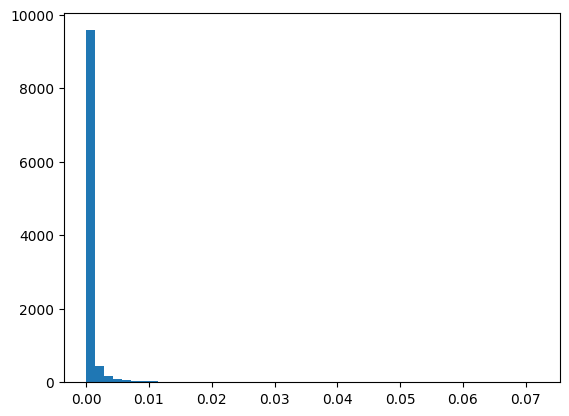

In [164]:
plt.hist(adata.uns['SPECTRA_factors'][30,:], bins=50)

In [145]:
names = gp.get_library_name()
names[:10]

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues',
 'Achilles_fitness_decrease',
 'Achilles_fitness_increase',
 'Aging_Perturbations_from_GEO_down',
 'Aging_Perturbations_from_GEO_up',
 'Allen_Brain_Atlas_10x_scRNA_2021']

In [270]:
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
# weight for factor 30, from most to least significant
gene_list = list(adata.var_names[adata.var['spectra_vocab']][np.argsort(-adata.uns['SPECTRA_factors'][1,:])][0:100])
enr = gp.enrichr(gene_list=gene_list, # or "./tests/data/gene_list.txt",
                 gene_sets=['MSigDB_Hallmark_2020','KEGG_2021_Human'],
                 background=list(adata.var_names[adata.var['spectra_vocab']]),
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk
                )

In [271]:
enr.results.head(10)

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,2.231120e-13,8.478257e-12,0,0,15.748571,458.773247,PPP1R15A;CEBPB;GADD45A;TNFAIP3;TRAF1;NFKB1;REL...
1,MSigDB_Hallmark_2020,p53 Pathway,5.488693e-10,1.042852e-08,0,0,16.666132,355.374605,TSPYL2;PPP1R15A;GADD45A;ZMAT3;DDIT4;MDM2;RPS27...
2,MSigDB_Hallmark_2020,DNA Repair,5.693014e-06,5.650048e-05,0,0,23.883295,288.421139,RALA;GPX4;RPA3;UPF3B;DDB2
3,MSigDB_Hallmark_2020,Inflammatory Response,5.947419e-06,5.650048e-05,0,0,7.920521,95.304094,NFKBIA;GPR183;EMP3;CD69;AHR;IL7R;HIF1A;NFKB1;RELA
4,MSigDB_Hallmark_2020,Apoptosis,9.974666e-06,7.580746e-05,0,0,10.709825,123.328580,GPX4;GADD45A;PMAIP1;CD69;SQSTM1;RELA;BIRC3
5,MSigDB_Hallmark_2020,Unfolded Protein Response,9.643813e-05,5.702726e-04,0,0,19.768939,182.795651,TSPYL2;CEBPB;DDIT4;ATF4
6,MSigDB_Hallmark_2020,KRAS Signaling Up,1.050502e-04,5.702726e-04,0,0,7.214656,66.093979,PPP1R15A;CXCR4;TNFAIP3;TRAF1;IL7R;IL2RG;BIRC3
7,MSigDB_Hallmark_2020,Myc Targets V1,1.499093e-04,7.120691e-04,0,0,17.391667,153.141977,DDX21;ERH;DEK;HNRNPC
8,MSigDB_Hallmark_2020,PI3K/AKT/mTOR Signaling,1.957360e-04,8.264410e-04,0,0,16.100309,137.476408,UBE2D3;CXCR4;IL2RG;SQSTM1
9,MSigDB_Hallmark_2020,IL-2/STAT5 Signaling,2.719063e-04,1.033244e-03,0,0,6.124037,50.278668,GPX4;SNX9;TRAF1;LTB;ITGAE;AHR;DHRS3


In [267]:
for factor in factors:
    print(results_ns_lmm[results_ns_lmm['factor']==factor].sort_values('pvalue').head(20))

                             var      param         pvalue  ctype  \
2                    COND[T.IFN]  -2.168012  1.785723e-149     NK   
2                    COND[T.IFN]  -1.422323   9.878244e-46    gdT   
3                    COND[T.LPS]  -1.086943   5.963200e-39     NK   
2                    COND[T.IFN]  -0.515044   6.178531e-16  CD8-T   
3                    COND[T.LPS]  -0.781262   6.341502e-15    gdT   
0                      Intercept   1.042479   3.848042e-14     NK   
11                     Group Var  14.412449   4.044371e-09  CD4-T   
11                     Group Var   6.341594   1.078847e-08  CD8-T   
11                     Group Var   2.047723   2.267347e-07      B   
11                     Group Var   1.673810   5.199025e-07    gdT   
10                           AGE   0.023133   7.407471e-06  CD8-T   
11                     Group Var   0.489550   3.431542e-04     NK   
10                           AGE   0.019563   7.310933e-04  CD4-T   
2                    COND[T.IFN]  

## Convergence of Spectra model

In [29]:
model.gene_scalings.keys()

dict_keys(['global', 'B', 'CD4-T', 'CD8-T', 'DNT', 'M', 'MAIT', 'NK', 'Progenitor', 'gdT'])

(array([8.00e+03, 5.67e+02, 3.81e+02, 3.03e+02, 2.35e+02, 1.73e+02,
        1.24e+02, 8.40e+01, 7.70e+01, 6.30e+01, 4.50e+01, 4.90e+01,
        4.00e+01, 4.10e+01, 3.40e+01, 2.40e+01, 2.00e+01, 2.80e+01,
        1.80e+01, 1.30e+01, 1.30e+01, 1.10e+01, 1.20e+01, 1.30e+01,
        1.50e+01, 1.40e+01, 4.00e+00, 9.00e+00, 9.00e+00, 9.00e+00,
        1.00e+01, 1.00e+01, 5.00e+00, 4.00e+00, 4.00e+00, 4.00e+00,
        4.00e+00, 4.00e+00, 4.00e+00, 7.00e+00, 2.00e+00, 5.00e+00,
        2.00e+00, 2.00e+00, 2.00e+00, 2.00e+00, 0.00e+00, 3.00e+00,
        0.00e+00, 5.80e+01]),
 array([3.18352562e-08, 2.00000200e-02, 4.00000103e-02, 5.99999987e-02,
        7.99999833e-02, 9.99999717e-02, 1.19999960e-01, 1.39999956e-01,
        1.59999937e-01, 1.79999933e-01, 1.99999914e-01, 2.19999909e-01,
        2.39999890e-01, 2.59999871e-01, 2.79999882e-01, 2.99999863e-01,
        3.19999844e-01, 3.39999825e-01, 3.59999835e-01, 3.79999816e-01,
        3.99999797e-01, 4.19999778e-01, 4.39999789e-01, 4.59999770

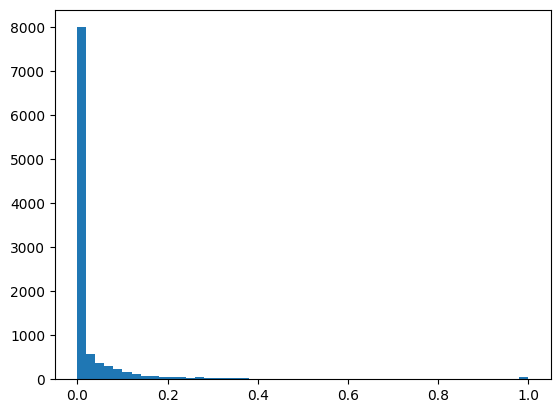

In [35]:
plt.hist(model.gene_scalings['gdT'], bins=50, )

In [36]:
adata.var_names[adata.var['spectra_vocab']][model.gene_scalings['gdT'] > 0.8]

Index(['ISG15', 'IFI6', 'IFI44L', 'PYHIN1', 'CD247', 'RABGAP1L', 'C1orf21',
       'RSAD2', 'EIF2AK2', 'TMSB10', 'GNLY', 'ARHGAP15', 'ZEB2', 'WIPF1',
       'STAT1', 'STAT4', 'DOCK10', 'SP110', 'RPL32', 'CBLB', 'CD96', 'ZBTB20',
       'PARP14', 'ARAP2', 'HERC5', 'RPL34', 'DDX60L', 'PARP8', 'NR3C1',
       'RPS14', 'RIPOR2', 'RPS18', 'FYN', 'RPS12', 'UTRN', 'AOAH', 'TRGC1',
       'SAMD9', 'SAMD9L', 'LY6E', 'DDX58', 'CCSER2', 'IFIT3', 'TRIM22',
       'PDE3B', 'MALAT1', 'KLRD1', 'RPS26', 'EPSTI1', 'TPT1', 'TRDC', 'RPS29',
       'PRKCH', 'RORA', 'RPLP1', 'ISG20', 'IL32', 'RPS15A', 'MT2A', 'RPL13',
       'XAF1', 'SLFN5', 'SLFN12L', 'CCL5', 'PITPNC1', 'RNF213', 'SMCHD1',
       'RPL13A', 'NKG7', 'MX2', 'MX1', 'RPL10', 'MT-ATP6', 'MT-CO3', 'MT-ND3',
       'MT-CYB'],
      dtype='object')

## Average scores by individual

In [12]:
scores_df = pd.DataFrame(adata.obsm['SPECTRA_cell_scores'], index=adata.obs.index, columns=adata.uns['SPECTRA_overlap'].index)

In [46]:
adata.obs[adata.uns['SPECTRA_overlap'].index] = scores_df

In [14]:
scores_df.columns

Index(['0-X-global-X-0', '1-X-global-X-1', '2-X-global-X-2', '3-X-B-X-3',
       '4-X-B-X-4', '5-X-B-X-5', '6-X-B-X-6', '7-X-B-X-7', '8-X-CD4-T-X-8',
       '9-X-CD4-T-X-9', '10-X-CD4-T-X-10', '11-X-CD4-T-X-11',
       '12-X-CD4-T-X-12', '13-X-CD4-T-X-13', '14-X-CD4-T-X-14',
       '15-X-CD4-T-X-15', '16-X-CD8-T-X-16', '17-X-CD8-T-X-17',
       '18-X-CD8-T-X-18', '19-X-CD8-T-X-19', '20-X-CD8-T-X-20',
       '21-X-DNT-X-21', '22-X-M-X-M_IL17A_response', '23-X-M-X-23',
       '24-X-M-X-M_IL17A_response', '25-X-M-X-25',
       '26-X-M-X-DC_antigen-crosspresentation', '27-X-M-X-27',
       '28-X-M-X-DC_antigen-crosspresentation', '29-X-M-X-M_IL17A_response',
       '30-X-M-X-neutro_CXCL8_response', '31-X-M-X-31', '32-X-M-X-32',
       '33-X-M-X-Mac_IL4-IL13_response', '34-X-M-X-34', '35-X-M-X-35',
       '36-X-MAIT-X-36', '37-X-NK-X-37', '38-X-NK-X-38',
       '39-X-Progenitor-X-39', '40-X-gdT-X-40'],
      dtype='object')

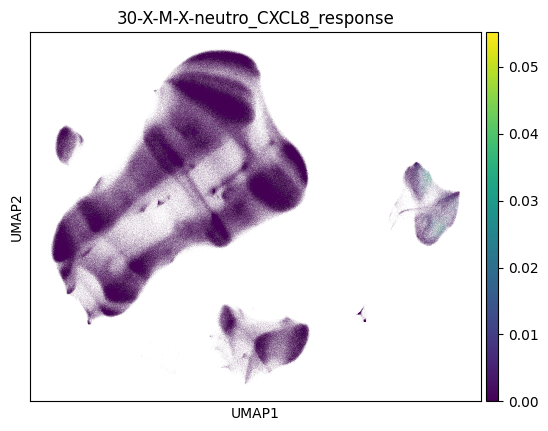

In [216]:
sc.pl.umap(adata, color='30-X-M-X-neutro_CXCL8_response')

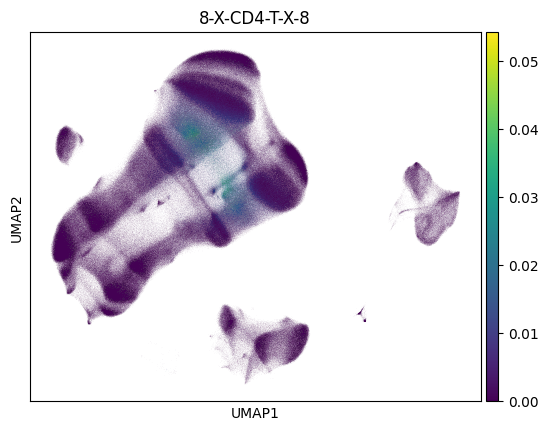

In [194]:
sc.pl.umap(adata, color='8-X-CD4-T-X-8')

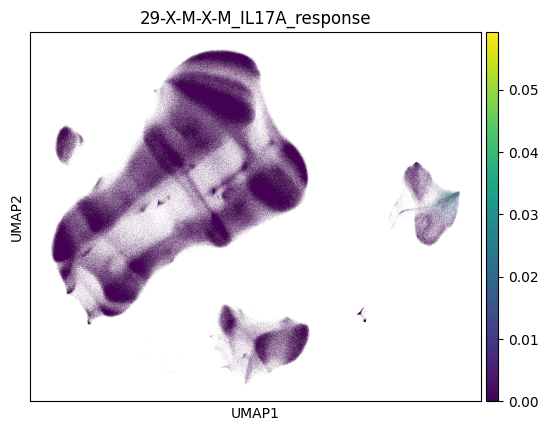

In [264]:
sc.pl.umap(adata, color='29-X-M-X-M_IL17A_response')

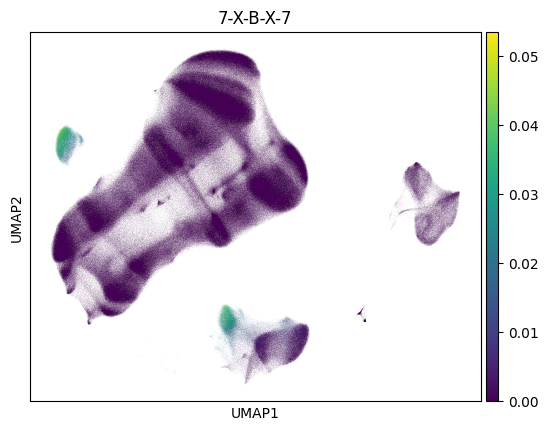

In [190]:
sc.pl.umap(adata, color='7-X-B-X-7')

Factor 7 appears to be the IFN-B response of B cells.

In [17]:
adata.uns['SPECTRA_overlap'].index

Index(['0-X-global-X-0', '1-X-global-X-1', '2-X-global-X-2', '3-X-B-X-3',
       '4-X-B-X-4', '5-X-B-X-5', '6-X-B-X-6', '7-X-B-X-7', '8-X-CD4-T-X-8',
       '9-X-CD4-T-X-9', '10-X-CD4-T-X-10', '11-X-CD4-T-X-11',
       '12-X-CD4-T-X-12', '13-X-CD4-T-X-13', '14-X-CD4-T-X-14',
       '15-X-CD4-T-X-15', '16-X-CD8-T-X-16', '17-X-CD8-T-X-17',
       '18-X-CD8-T-X-18', '19-X-CD8-T-X-19', '20-X-CD8-T-X-20',
       '21-X-DNT-X-21', '22-X-M-X-M_IL17A_response', '23-X-M-X-23',
       '24-X-M-X-M_IL17A_response', '25-X-M-X-25',
       '26-X-M-X-DC_antigen-crosspresentation', '27-X-M-X-27',
       '28-X-M-X-DC_antigen-crosspresentation', '29-X-M-X-M_IL17A_response',
       '30-X-M-X-neutro_CXCL8_response', '31-X-M-X-31', '32-X-M-X-32',
       '33-X-M-X-Mac_IL4-IL13_response', '34-X-M-X-34', '35-X-M-X-35',
       '36-X-MAIT-X-36', '37-X-NK-X-37', '38-X-NK-X-38',
       '39-X-Progenitor-X-39', '40-X-gdT-X-40'],
      dtype='object')

In [ ]:
#scores_df.to_csv("spectra_scores.040125.csv")

In [16]:
scores_means = scores_df.merge(adata.obs[['FID','COND','cytopus_names']], left_index=True, right_index=True) \
    .groupby(['FID','COND','cytopus_names']).mean().reset_index().merge(adata.obs[['FID','AGE','SEX','BATCH','Ethnicity']].drop_duplicates())

In [196]:
# Drop Progenitor, DNT, and MAIT due to low cell numbers and NaN
scores_means = scores_means[~scores_means['cytopus_names'].isin(set(['Progenitor','DNT','MAIT']))]

<Axes: >

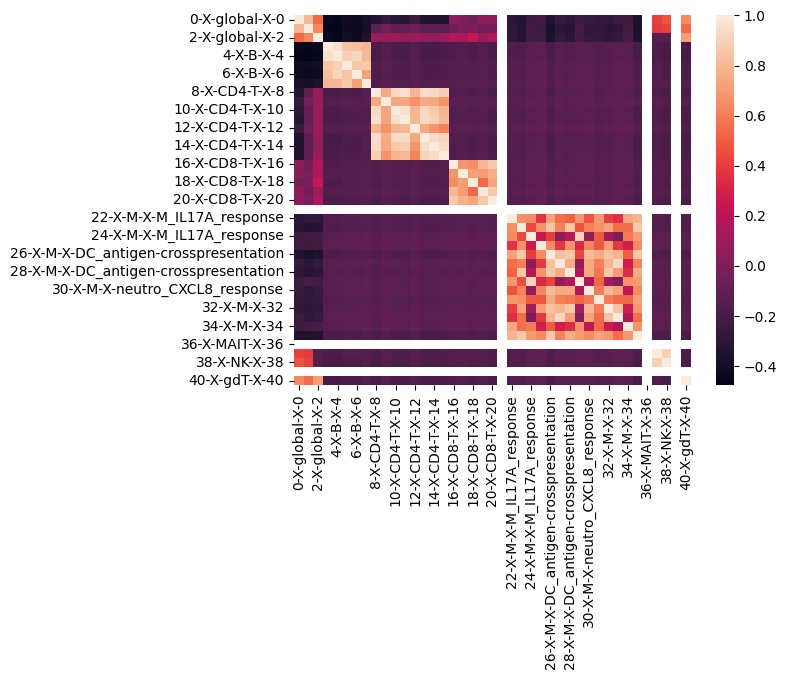

In [20]:
sns.heatmap(scores_means[(scores_means['COND']=="CTL") & (scores_means['Ethnicity']=="Fulani")][scores_df.columns].corr())

In [10]:
# Run linear mixed model on CTL cells in Monocytes across all factors that are non-zero

In [17]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [137]:
scores_means['ct2'].value_counts()

B cells:Activated                         486
B cells:CD5+                              486
TRAV1-2- CD8+ T cells:Naive               486
TRAV1-2- CD8+ T cells:NKT-like            486
TRAV1-2- CD8+ T cells:Memory              486
Progenitor cells:Progenitor cells         486
NK cells:Proliferative                    486
NK cells:CD56dim CD57low                  486
NK cells:CD56dim CD57int                  486
NK cells:CD56dim CD57-                    486
NK cells:CD56dim CD57+                    486
NK cells:CD56bright                       486
Myeloid cells:pDCs                        486
Myeloid cells:cDCs                        486
Myeloid cells:Non-classical monocytes     486
Myeloid cells:Classical monocytes         486
MAIT cells:MAIT cells                     486
DN T cells:DN T cells                     486
CD4+ T cells:Treg                         486
CD4+ T cells:Naive                        486
CD4+ T cells:Helper memory                486
CD4+ T cells:Cytotoxic/effector me

In [18]:
sc_means_sub = scores_means[(scores_means['COND'].isin(["CTL"]))]
sc_means_sub['Ethnicity'] = pd.Categorical(sc_means_sub['Ethnicity'], categories=['Tikari','Fulani','CHG'])

/tmp/ipykernel_274222/1134410557.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sc_means_sub['Ethnicity'] = pd.Categorical(sc_means_sub['Ethnicity'], categories=['Tikari','Fulani','CHG'])


In [25]:
# sc_means_sub = scores_means[(scores_means['COND'].isin(["CTL","IFN"])) & \
#     (scores_means['cytopus_names'].isin(['B'])) & \
#     (scores_means['Ethnicity'].isin(['CHG']))]
# sc_means_sub['Ethnicity'] = pd.Categorical(sc_means_sub['Ethnicity'], categories=['CHG'])
# sc_means_sub['COND'] = pd.Categorical(sc_means_sub['COND'], categories=['CTL','IFN'])

In [19]:
sc_means_sub = sc_means_sub[sc_means_sub.apply(lambda x: np.sum(x.isna()), axis=1)==0]

In [20]:
# get factors that are non-zero
factor_gt0 = adata.uns['SPECTRA_overlap'].index[sc_means_sub[adata.uns['SPECTRA_overlap'].index].apply(sum) > 0]

In [314]:
factor_gt0 = ['0-X-global-X-0', '1-X-global-X-1', '2-X-global-X-2']

In [21]:
# OLS
param_ols = []
pval_ols = []
#factor_gt0 = adata.uns['SPECTRA_overlap'].index[sc_means_sub[adata.uns['SPECTRA_overlap'].index].apply(sum) > 0]
for factor in factor_gt0:
    sc_means_sub[factor] = (sc_means_sub[factor] - np.mean(sc_means_sub[factor])) / np.std(sc_means_sub[factor])
    formula = "Q(\"" + factor + "\")" + " ~ SEX + AGE + Ethnicity"
    md = smf.ols(formula, sc_means_sub)
    mdf = md.fit()
    param_ols.append(list(mdf.params))
    pval_ols.append(list(mdf.pvalues))

In [22]:
param_ols_df = pd.DataFrame(param_ols, index=factor_gt0, columns=["Intercept","SEX","Ethnicity_F","Ethnicity_C","AGE"])
pval_ols_df = pd.DataFrame(pval_ols, index=factor_gt0, columns=["Intercept","SEX","Ethnicity_F","Ethnicity_C","AGE"])

In [106]:
# param_ols_df = pd.DataFrame(param_ols, index=factor_gt0, columns=["Intercept","SEX","Ethnicity_F","Ethnicity_C","AGE"])
# pval_ols_df = pd.DataFrame(pval_ols, index=factor_gt0, columns=["Intercept","SEX","Ethnicity_F","Ethnicity_C","AGE"])

In [24]:
pval_ols_df.sort_values('Ethnicity_F').head(10)

,Intercept,SEX,Ethnicity_F,Ethnicity_C,AGE
24-X-M-X-M_IL17A_response,0.004408,0.261936,1.927511e-07,0.797283,0.022894
29-X-M-X-M_IL17A_response,0.010909,0.962058,5.441794e-05,0.605983,0.056919
30-X-M-X-neutro_CXCL8_response,0.105825,0.548194,4.084085e-04,0.007761,0.651523
1-X-global-X-1,0.687644,0.037568,1.130006e-02,0.012087,0.891770
27-X-M-X-27,0.093528,0.974540,2.378407e-02,0.004397,0.458527
33-X-M-X-Mac_IL4-IL13_response,0.074981,0.277153,3.747688e-02,0.029312,0.163316
16-X-CD8-T-X-16,0.704279,0.912312,5.143401e-02,0.493079,0.203423
34-X-M-X-34,0.068660,0.923165,8.464170e-02,0.646412,0.055542
32-X-M-X-32,0.336603,0.537774,1.068226e-01,0.052341,0.161640
20-X-CD8-T-X-20,0.020539,0.721236,1.534627e-01,0.551740,0.011983


In [25]:
param_ols_df.iloc[np.argsort(pval_ols_df['Ethnicity_F'])].head(10)

,Intercept,SEX,Ethnicity_F,Ethnicity_C,AGE
24-X-M-X-M_IL17A_response,-0.264343,-0.063932,0.326773,0.019067,0.003759
29-X-M-X-M_IL17A_response,-0.237877,-0.002729,0.254535,0.038552,0.003166
30-X-M-X-neutro_CXCL8_response,0.151457,0.034550,-0.223414,-0.199813,-0.000753
1-X-global-X-1,0.037429,-0.119085,0.159066,-0.187295,-0.000226
27-X-M-X-27,0.157370,0.001840,-0.142968,-0.214219,-0.001238
33-X-M-X-Mac_IL4-IL13_response,0.167182,0.062693,-0.131630,-0.163893,-0.002330
16-X-CD8-T-X-16,-0.035640,0.006356,-0.123302,-0.051539,0.002127
34-X-M-X-34,-0.170812,0.005558,0.108981,-0.034444,0.003199
32-X-M-X-32,0.089865,0.035416,-0.101636,0.145383,-0.002331
20-X-CD8-T-X-20,-0.217533,-0.020576,0.090252,0.044714,0.004203


In [ ]:
# LMM
param_lmm = []
pval_lmm = []
factor_gt0 = adata.uns['SPECTRA_overlap'].index[sc_means_sub[adata.uns['SPECTRA_overlap'].index].apply(sum) > 0]
for factor in factor_gt0:
    formula = "Q(\"" + factor + "\")" + " ~ AGE + SEX + COND"
    md = smf.mixedlm(formula, sc_means_sub, groups=sc_means_sub['FID'])
    mdf = md.fit()
    param_lmm.append(list(mdf.params))
    pval_lmm.append(list(mdf.pvalues))

In [195]:
param_lmm_df = pd.DataFrame(param_lmm, index=factor_gt0, columns=["Intercept","SEX","COND","AGE","GROUP"])
pval_lmm_df = pd.DataFrame(pval_lmm, index=factor_gt0, columns=["Intercept","SEX","COND","AGE","GROUP"])

In [197]:
param_lmm_df.iloc[np.argsort(pval_lmm_df['COND'])].head()

,Intercept,SEX,COND,AGE,GROUP
7-X-B-X-7,-0.000728,0.001012,0.021009,0.000053,3.470449e-10
4-X-B-X-4,0.019091,-0.000536,-0.006164,-0.000021,6.954820e-01
3-X-B-X-3,0.020984,-0.000417,-0.006753,-0.000104,3.143337e+00
6-X-B-X-6,0.016380,0.000299,-0.003292,0.000130,1.349743e+01
2-X-global-X-2,0.001383,0.000208,-0.000470,0.000007,4.954908e+00


In [ ]:
adata

<Axes: xlabel='Ethnicity', ylabel='30-X-M-X-neutro_CXCL8_response'>

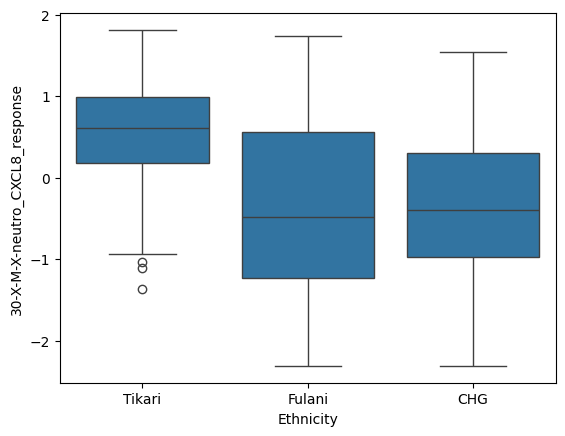

In [157]:
sns.boxplot(sc_means_sub, x='Ethnicity', y='30-X-M-X-neutro_CXCL8_response')

In [61]:
adata.uns['SPECTRA_markers'][23]

array(['CYP27A1', 'PLA2G7', 'MMP9', 'GPNMB', 'CYP1B1', 'MGST1', 'FNIP2',
       'SLC7A11', 'SLC1A3', 'LGALS3', 'RASAL2', 'NRP1', 'MGLL',
       'LINC01705', 'CTSB', 'TNS3', 'GM2A', 'KYNU', 'RBM47', 'NRP2',
       'CREG1', 'PGD', 'MITF', 'MYOF', 'SDC2', 'ASPH', 'C15orf48',
       'CEBPB', 'C5AR1', 'CTSL', 'SH3BP5', 'SLC38A6', 'ARMC9', 'DPYSL3',
       'CHI3L1', 'PTGR1', 'DOCK4', 'FGR', 'CSTB', 'CTSD', 'CD68',
       'PDE4DIP', 'DMXL2', 'TM4SF19', 'NPL', 'NCF2', 'RDX', 'SGK1',
       'CXCL8', 'LHFPL2'], dtype=object)

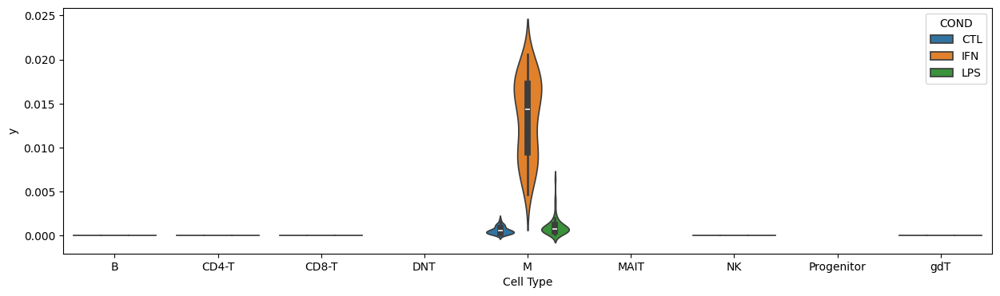

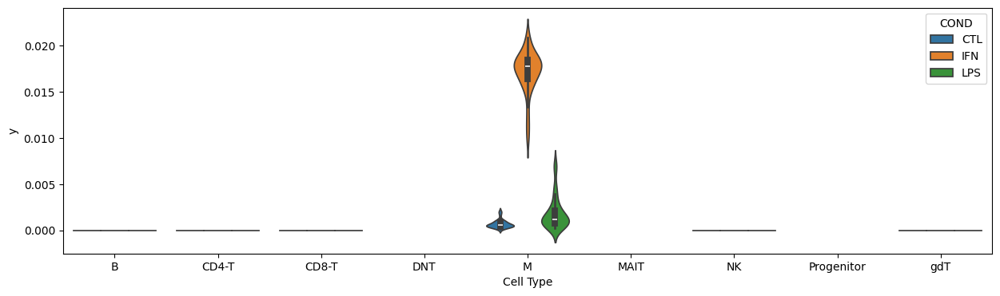

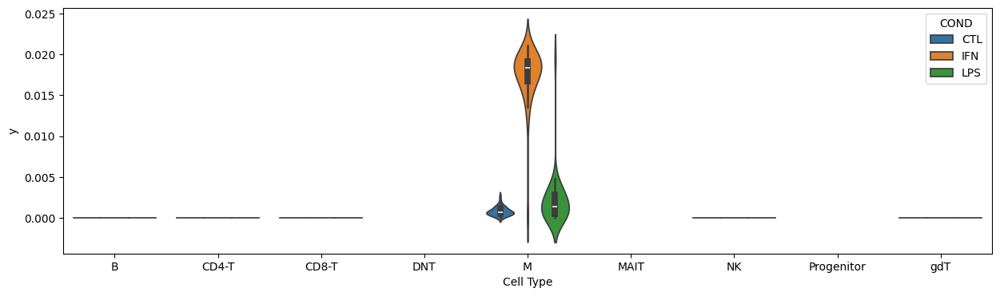

In [213]:
for POP in ['Fulani','Tikari','CHG']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[31]]
    plt.figure(figsize = (15,4))
    ax = sns.violinplot(pd.DataFrame({'y' : y, 'Cell Type' : scores_means[scores_means['Ethnicity']==POP]['cytopus_names'],
                             'COND' : scores_means[scores_means['Ethnicity']==POP]['COND']},
                             index=scores_means[scores_means['Ethnicity']==POP].index),
               x = 'Cell Type', y = 'y', hue = 'COND')

In [104]:
#param_ols_df = pd.DataFrame(param_ols, index=factor_gt0, columns=["Intercept","SEX","Ethnicity","COND","Ethnicity:COND","AGE"])
#pval_ols_df = pd.DataFrame(pval_ols, index=factor_gt0, columns=["Intercept","SEX","Ethnicity","COND","Ethnicity:COND","AGE"])

In [130]:
plt.violinplot(

<function matplotlib.pyplot.violinplot(dataset: 'ArrayLike | Sequence[ArrayLike]', positions: 'ArrayLike | None' = None, vert: 'bool' = True, widths: 'float | ArrayLike' = 0.5, showmeans: 'bool' = False, showextrema: 'bool' = True, showmedians: 'bool' = False, quantiles: 'Sequence[float | Sequence[float]] | None' = None, points: 'int' = 100, bw_method: "Literal['scott', 'silverman'] | float | Callable[[GaussianKDE], float] | None" = None, *, data=None) -> 'dict[str, Collection]'>

<Axes: xlabel='SEX', ylabel='32-X-M-X-32'>

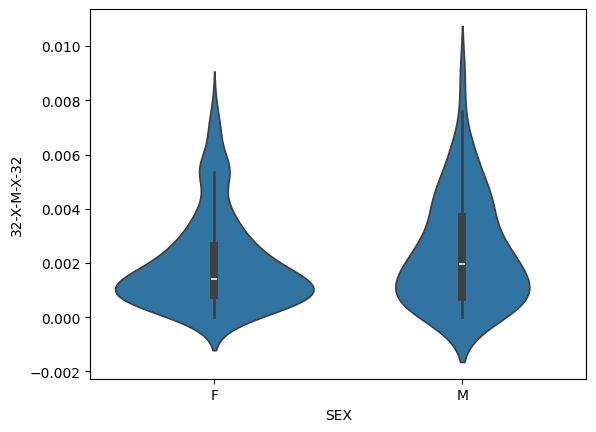

In [152]:
sns.violinplot(sc_means_sub,
               x = 'SEX', y = '32-X-M-X-32')

In [134]:
pval_ols_df.sort_values('AGE').head()

,Intercept,SEX,Ethnicity_F,EthnicityT,COND_IFN,COND_LPS,Ethnicity_F:COND_IFN,Ethnicity_T:COND_IFN,Ethnicity_F:COND_LPS,Ethnicity_T:COND_LPS,AGE
18-X-CD8-T-X-18,6.987886e-17,0.198262,0.217610,0.317347,0.377127,0.667448,0.968162,0.996368,0.856766,0.961270,1.130226e-07
12-X-CD4-T-X-12,3.541398e-03,0.212139,0.259121,0.047313,0.316814,0.596529,0.866439,0.864813,0.822167,0.864801,3.853350e-07
20-X-CD8-T-X-20,1.351806e-03,0.775432,0.421676,0.644698,0.118119,0.694136,0.786193,0.785542,0.904151,0.966632,8.700917e-06
19-X-CD8-T-X-19,2.745351e-07,0.005956,0.000520,0.000857,0.205773,0.773559,0.754091,0.898644,0.881136,0.981335,3.291367e-05
24-X-M-X-M_IL17A_response,5.501269e-01,0.079802,0.000009,0.911635,0.802203,0.128771,0.935012,0.893033,0.473579,0.607097,8.080390e-04


In [79]:
bar_df.sort_values('Ethnicity:COND').head()

,Intercept,SEX,Ethnicity,COND,Ethnicity:COND,AGE
40-X-gdT-X-40,6.409889e-40,3.640164e-07,0.008238,3.650112e-91,0.132469,7.484130e-06
1-X-global-X-1,1.194270e-81,4.070460e-03,0.111194,1.601762e-29,0.348963,7.861658e-09
0-X-global-X-0,4.856226e-130,7.783389e-01,0.765541,9.349313e-126,0.629460,1.157557e-01
2-X-global-X-2,6.064993e-68,5.314945e-01,0.018656,3.042044e-41,0.985248,4.989835e-05


In [27]:
phenos = pd.read_csv("/project/tishkofflab/data/Electronic_Field_Data/2024/2024_freeze_3/TishkoffLab/Phenotypes/Subject_Data.TishkoffLab.Phenotypes.2024_freeze_3.utf8.txt", sep="\t")

/tmp/ipykernel_274222/62586573.py:1: DtypeWarning: Columns (4,5,6,9,11,72,73,107,113,114,115,116,117,118,120,121,122,123) have mixed types. Specify dtype option on import or set low_memory=False.
  phenos = pd.read_csv("/project/tishkofflab/data/Electronic_Field_Data/2024/2024_freeze_3/TishkoffLab/Phenotypes/Subject_Data.TishkoffLab.Phenotypes.2024_freeze_3.utf8.txt", sep="\t")


In [81]:
phenos[['ID:field','Biospecimen_Measurement:Blood:TCL:HDL::num::mg/dL']]

,ID:field,Biospecimen_Measurement:Blood:TCL:HDL::num::mg/dL
0,4,NaN
1,AC001,NaN
2,NCHA32,NaN
3,KS-103;KS103,NaN
4,MGF-0,NaN
...,...,...
15665,NA19983,NaN
15666,NA20128,NaN
15667,NA20129,NaN
15668,NA20279,NaN


<Axes: xlabel='27-X-M-X-27', ylabel='24-X-M-X-M_IL17A_response'>

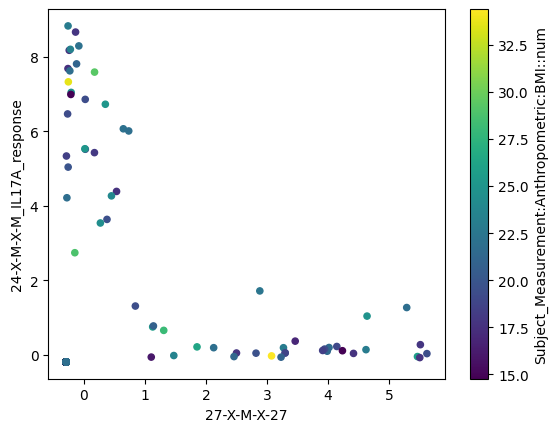

In [28]:
# plot factor 
sc_means_sub[(sc_means_sub['COND']=="CTL") & (sc_means_sub['Ethnicity']=="Fulani")] \
    .merge(phenos[['ID:field','Subject_Measurement:Anthropometric:BMI::num']], left_on="FID", right_on="ID:field") \
    .plot.scatter('27-X-M-X-27', '24-X-M-X-M_IL17A_response', c='Subject_Measurement:Anthropometric:BMI::num', colormap='viridis')

<Axes: xlabel='24-X-M-X-M_IL17A_response', ylabel='30-X-M-X-neutro_CXCL8_response'>

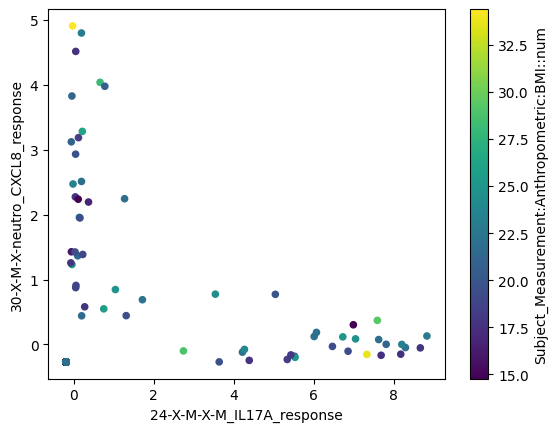

In [29]:
# plot factor 
sc_means_sub[(sc_means_sub['COND']=="CTL") & (sc_means_sub['Ethnicity']=="Fulani")] \
    .merge(phenos[['ID:field','Subject_Measurement:Anthropometric:BMI::num']], left_on="FID", right_on="ID:field") \
    .plot.scatter('24-X-M-X-M_IL17A_response', '30-X-M-X-neutro_CXCL8_response', c='Subject_Measurement:Anthropometric:BMI::num', colormap='viridis')

<Axes: xlabel='24-X-M-X-M_IL17A_response', ylabel='30-X-M-X-neutro_CXCL8_response'>

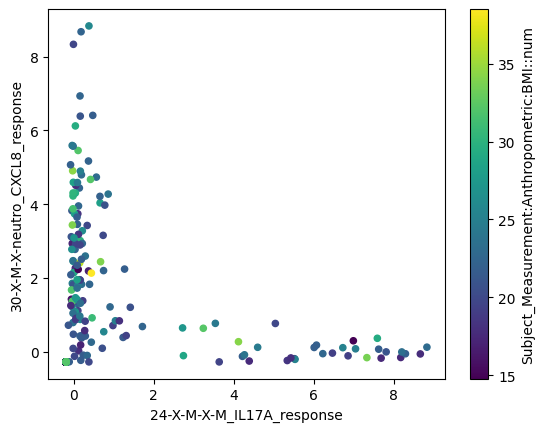

In [32]:
# plot factor 
sc_means_sub[(sc_means_sub['COND']=="CTL")] \
    .merge(phenos[['ID:field','Subject_Measurement:Anthropometric:BMI::num']], left_on="FID", right_on="ID:field") \
    .plot.scatter('24-X-M-X-M_IL17A_response', '30-X-M-X-neutro_CXCL8_response', c='Subject_Measurement:Anthropometric:BMI::num', colormap='viridis')

The top genes for factor 27 include CSF1 "Colony-stimulating factor-1 (CSF-1, also known as macrophage-CSF) is the primary regulator of the survival, proliferation, differentiation and function of mononuclear phagocytes" (PMID: 16337366) and LPL (crucial for breaking down triglycerides in the blood). 

<Axes: xlabel='27-X-M-X-27', ylabel='24-X-M-X-M_IL17A_response'>

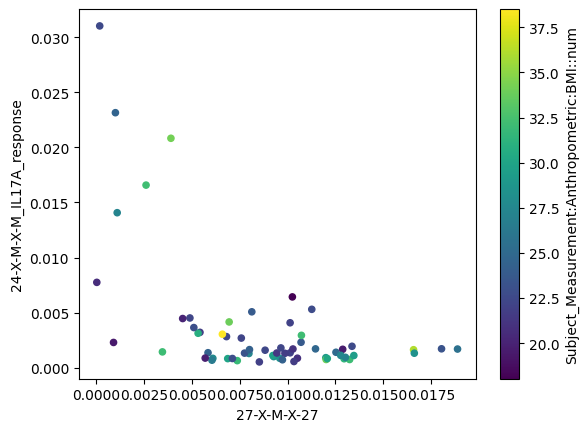

In [97]:
sc_means_sub[(sc_means_sub['COND']=="CTL") & (sc_means_sub['Ethnicity']=="Tikari")] \
    .merge(phenos[['ID:field','Subject_Measurement:Anthropometric:BMI::num']], left_on="FID", right_on="ID:field") \
    .plot.scatter('27-X-M-X-27', '24-X-M-X-M_IL17A_response', c='Subject_Measurement:Anthropometric:BMI::num', colormap='viridis')

<Axes: xlabel='27-X-M-X-27', ylabel='30-X-M-X-neutro_CXCL8_response'>

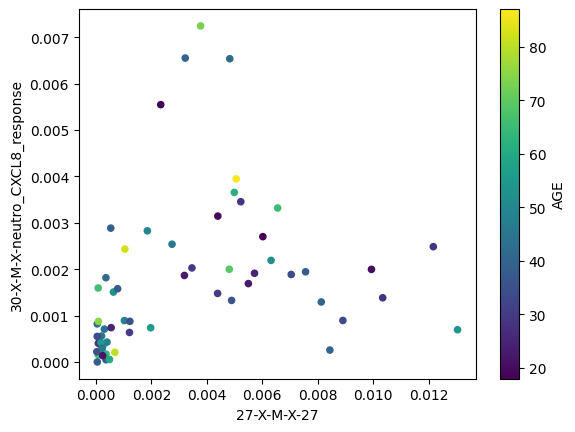

In [76]:
# plot factor 
sc_means_sub[(sc_means_sub['COND']=="LPS") & (sc_means_sub['Ethnicity']=="Fulani")] \
    .plot.scatter('27-X-M-X-27', '30-X-M-X-neutro_CXCL8_response', c="AGE", colormap='viridis')

<Axes: xlabel='26-X-M-X-DC_antigen-crosspresentation', ylabel='24-X-M-X-M_IL17A_response'>

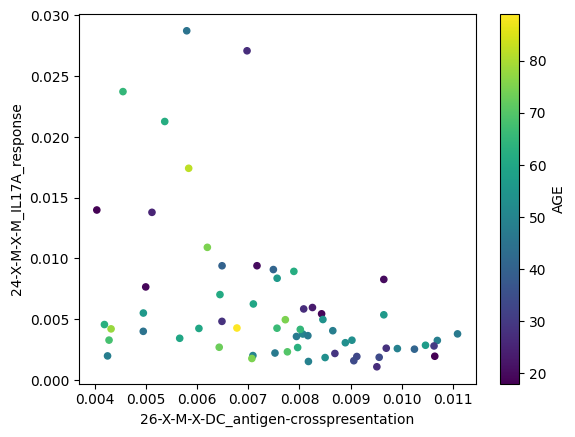

In [48]:
sc_means_sub[(sc_means_sub['COND']=="LPS") & (sc_means_sub['Ethnicity']=="Tikari")] \
    .plot.scatter('26-X-M-X-DC_antigen-crosspresentation', '24-X-M-X-M_IL17A_response', c="AGE", colormap='viridis')

In [18]:
from patsy import dmatrices

In [21]:
formula = "Q(\"" + factor + "\")" + " ~ AGE + SEX + Ethnicity * COND"
y, X = dmatrices(formula, data=sc_means_sub, return_type='dataframe')

In [22]:
formula

'Q("0-X-global-X-0") ~ AGE + SEX + Ethnicity * COND'

In [44]:
#formula = factor + " ~ AGE + SEX + Ethnicity"
formula = "Q(\"" + factor + "\")" + " ~ AGE + SEX + Ethnicity"
md = smf.mixedlm(formula, sc_means_sub, groups=sc_means_sub['BATCH'])
mdf = md.fit()

/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/home/derkelly/miniconda3/envs/ctypist/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2262: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


In [24]:
sc_means_sub[factor]

1084    0.002688
1102    0.002231
1111    0.006670
1129    0.004532
1138    0.003546
          ...   
4315    0.000876
4324    0.002573
4342    0.002582
4351    0.001827
4369    0.001678
Name: 0-X-global-X-0, Length: 244, dtype: float64

In [45]:
print(mdf.summary())

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: Q("7-X-B-X-7")
No. Observations: 204     Method:             REML          
No. Groups:       29      Scale:              0.0002        
Min. group size:  2       Log-Likelihood:     584.0912      
Max. group size:  12      Converged:          Yes           
Mean group size:  7.0                                       
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          0.013    0.003  4.349 0.000  0.007  0.019
SEX[T.M]           0.001    0.002  0.359 0.719 -0.003  0.004
Ethnicity[T.CHG]  -0.002    0.002 -1.032 0.302 -0.006  0.002
AGE                0.000    0.000  0.349 0.727 -0.000  0.000
Group Var          0.000                                    



In [35]:
sc_means_sub[['AGE', 'SEX', 'Ethnicity']]

,AGE,SEX,Ethnicity
1080,53.0,M,Fulani
1107,46.0,M,Fulani
1134,64.0,M,Fulani
1161,43.0,M,Fulani
1188,37.0,M,Fulani
...,...,...,...
4239,34.0,M,Tikari
4266,75.0,F,Tikari
4293,47.0,F,Tikari
4320,27.0,F,Tikari


In [199]:
# OLS regression
factor_pvals = []
factor_betas = []

for factor in factor_gt0:

    y = sc_means_sub[factor]
    y_scale = (y - np.mean(y))/np.std(y)
    
    model = sm.OLS(y_scale, X).fit()
    factor_pvals.append(list(model.pvalues))
    factor_betas.append(list(model.params))

In [200]:
factor_pval_df = pd.DataFrame(factor_pvals, index=factor_gt0, columns=X_df.columns)
factor_beta_df = pd.DataFrame(factor_betas, index=factor_gt0, columns=X_df.columns)

In [202]:
factor_beta_df.iloc[np.argsort(factor_pval_df['Fulani']),:]

,Intercept,EBT1,EBT10,EBT20,EBT6,EBT7,EBT8,EBT9,FZ1,FZ2,...,NX29,NX41,WYJ1,WYJ2,WYJ3,WYJ4,WYJ5,M,AGE,Fulani
7-X-B-X-7,-0.760742,1.085786,0.987473,1.394890,1.128356,0.092054,-0.334857,-0.572208,-0.395559,-0.333895,...,1.044022,1.195163,-0.389217,1.083768,0.473910,0.893938,1.086570,-0.164370,-0.000354,0.592640
4-X-B-X-4,-0.942458,0.355161,0.858198,0.213797,-0.530571,0.561807,1.090753,0.837052,-0.590170,1.730980,...,0.218389,0.185692,2.008583,0.104245,0.443823,0.941433,-0.789998,0.029241,0.011071,-0.387436
6-X-B-X-6,1.284725,-1.756781,-1.199154,-1.879170,-1.929910,-0.803615,-0.769152,-1.537673,-1.143448,-1.568908,...,-1.745752,-2.324998,-1.553494,-0.942328,-1.085457,-1.466326,1.316387,0.654139,-0.000658,0.190769
2-X-global-X-2,-0.103681,-0.113762,0.008771,0.816631,0.192932,1.230531,0.435152,0.264760,3.830615,1.134491,...,-0.444790,-0.280391,1.698845,0.829228,1.457096,1.645054,1.133999,0.104604,0.000067,-0.108271
1-X-global-X-1,-0.200815,-0.419599,-0.511126,-2.203861,-1.147498,-0.602365,0.045434,0.411112,-0.604136,0.810228,...,-0.076583,-0.120943,-0.250399,-0.652951,-0.921620,-1.634794,-0.889494,0.195766,0.005397,-0.148290
5-X-B-X-5,1.074804,-1.407644,-1.087301,-1.628359,-1.721368,-1.109969,0.203938,-0.268924,-0.176766,-0.692601,...,-1.590527,-2.127201,-1.403360,-0.828513,-0.611002,-1.381598,-0.393003,0.093034,0.000826,0.074099
3-X-B-X-3,0.032352,0.655871,0.331836,1.800385,1.167696,0.113099,-0.288544,0.487274,1.726345,-0.769169,...,0.497554,0.689886,0.386830,0.819870,0.788435,1.229310,1.411402,-0.057514,-0.008468,0.078526
0-X-global-X-0,-0.318792,0.277939,0.113962,1.472669,0.175553,1.040837,0.275399,0.209758,3.936599,2.694922,...,0.262830,0.018393,0.525787,1.433930,0.793100,0.474316,1.171062,-0.013660,-0.002577,0.006172


In [204]:
factor_pval_df.sort_values('Fulani').head(10)

,Intercept,EBT1,EBT10,EBT20,EBT6,EBT7,EBT8,EBT9,FZ1,FZ2,...,NX29,NX41,WYJ1,WYJ2,WYJ3,WYJ4,WYJ5,M,AGE,Fulani
7-X-B-X-7,0.255593,0.138656,0.178346,0.101244,0.103090,0.893800,0.633531,0.415894,6.422532e-01,0.664606,...,0.140175,0.134018,0.622659,0.161591,0.538706,0.247455,0.209863,0.417104,0.947442,0.000305
4-X-B-X-4,0.221216,0.672059,0.308342,0.825939,0.502706,0.479505,0.179048,0.301554,5.471083e-01,0.053112,...,0.787356,0.838684,0.029317,0.906349,0.616703,0.289534,0.426967,0.899985,0.075930,0.035507
6-X-B-X-6,0.065449,0.021867,0.115371,0.033995,0.007867,0.262314,0.291720,0.036766,1.967482e-01,0.051589,...,0.018364,0.005593,0.060338,0.239367,0.175884,0.068622,0.143218,0.002348,0.905952,0.246160
2-X-global-X-2,0.797673,0.796909,0.984194,0.113461,0.643566,0.004040,0.308077,0.534484,5.643942e-11,0.016775,...,0.298602,0.560064,0.000607,0.078357,0.002367,0.000652,0.032378,0.394587,0.983601,0.260711
1-X-global-X-1,0.750218,0.543100,0.459815,0.006887,0.080003,0.356811,0.945439,0.536255,4.535991e-01,0.267380,...,0.908366,0.871843,0.737749,0.371041,0.207750,0.026832,0.277256,0.307387,0.289805,0.322890
5-X-B-X-5,0.140282,0.077989,0.172628,0.078596,0.023041,0.140830,0.789183,0.724495,8.483906e-01,0.408448,...,0.039726,0.015114,0.104763,0.323335,0.465866,0.101209,0.675158,0.672074,0.887466,0.666489
3-X-B-X-3,0.966557,0.437552,0.694612,0.068090,0.144368,0.887302,0.722534,0.549086,8.218858e-02,0.388878,...,0.541522,0.452721,0.672546,0.358716,0.377371,0.170020,0.159786,0.805881,0.175492,0.668101
0-X-global-X-0,0.599779,0.675461,0.863879,0.058034,0.779057,0.099899,0.666693,0.742874,1.910799e-06,0.000216,...,0.681693,0.979667,0.465703,0.043189,0.259689,0.499279,0.138427,0.940854,0.598694,0.965818


In [179]:
adata.uns['SPECTRA_markers'][12]

array(['MALAT1', 'CCL5', 'THEMIS', 'CD2', 'PLEKHA5', 'TOX', 'ST8SIA1',
       'IL7R', 'IFNG-AS1', 'SYTL2', 'PLCB1', 'PRR5L', 'PPP2R2B', 'TGFBR3',
       'NCALD', 'TNFAIP3', 'JUN', 'ZFYVE28', 'ARHGAP35', 'CD6', 'NFATC2',
       'RORA', 'LINC02384', 'RNF19A', 'SAMD3', 'GLCCI1', 'MYO1F',
       'C1orf21', 'MT-ATP6', 'TPRG1', 'FYN', 'CD96', 'EML4', 'CD226',
       'ITK', 'PCED1B', 'PYHIN1', 'CD3G', 'ZBTB20', 'PTPRM', 'AOAH',
       'ATXN1', 'KIAA1671', 'STAT4', 'TBC1D2B', 'ATP2B4', 'SYNE1',
       'RABGAP1L', 'ARAP2', 'ITGB1'], dtype=object)

In [98]:
adata.uns['SPECTRA_markers'][37]

array(['GZMB', 'CD38', 'GNLY', 'PRF1', 'LINGO2', 'KLRD1', 'NKG7',
       'IFITM3', 'MALAT1', 'ISG15', 'CLIC3', 'IFI6', 'MX1', 'AOAH',
       'ZBP1', 'PLAAT4', 'IFIT3', 'OASL', 'LY6E', 'ISG20', 'CCL5', 'GZMA',
       'HERC5', 'RSAD2', 'NCAM1', 'IFIT2', 'MX2', 'CCL4', 'IFIT1',
       'EPSTI1', 'PLSCR1', 'SAMD9L', 'BST2', 'CST7', 'TYROBP', 'FASLG',
       'IFI35', 'XAF1', 'TRIM22', 'AF165147.1', 'OAS1', 'IFITM2', 'IRF7',
       'APOBEC3G', 'SAMD9', 'MT2A', 'IFI44L', 'EIF2AK2', 'CARD16', 'OAS3'],
      dtype=object)

In [15]:
adata.uns['SPECTRA_markers'][24]

array(['CXCL5', 'IL1B', 'SERPINB2', 'CXCL3', 'CXCL8', 'CXCL1', 'PID1',
       'S100A9', 'EREG', 'CXCL2', 'MT1G', 'S100A8', 'SOX5', 'IER3',
       'CCL3L1', 'AC025580.2', 'GLIS3', 'FCER1G', 'CD14', 'CCL3',
       'C15orf48', 'EPB41L3', 'TLR2', 'THBS1', 'MMP14', 'NAMPT',
       'TNFAIP6', 'CTSL', 'MT1H', 'ITGB8', 'PTGS2', 'ABCA1', 'HCK',
       'PLAUR', 'IL24', 'MET', 'SLC7A11', 'MT1M', 'PILRA', 'DOCK4',
       'CCL4', 'SLC25A37', 'SOD2', 'IL1A', 'ANPEP', 'KYNU', 'MARCKS',
       'SNX9', 'MT1E', 'MT1F'], dtype=object)

In [30]:
adata.uns['SPECTRA_markers'][30]

array(['CCL4', 'CCL3L1', 'INHBA', 'CCL3', 'LINC01010', 'CCL4L2',
       'ALDH1A2', 'LINC02345', 'PPARG', 'SLC8A1', 'LPL', 'CSF1',
       'CLEC12A', 'IL1RN', 'AQP9', 'CD86', 'ATF3', 'CT69', 'SASH1',
       'MSR1', 'SPRED1', 'MS4A7', 'MIR155HG', 'SGK1', 'RASGEF1B', 'RCAN1',
       'MYOF', 'ITGAX', 'MYO1E', 'FNIP2', 'FGD4', 'VMO1', 'HAVCR2',
       'MOB3B', 'EMP1', 'CD83', 'NEK6', 'IL3RA', 'CDK14', 'PRR16', 'CTSL',
       'RBM47', 'P2RX7', 'JAKMIP2', 'NR4A3', 'VASP', 'SNX9', 'AC006581.2',
       'C5AR1', 'SDC2'], dtype=object)

In [48]:
adata.uns['SPECTRA_markers'][29]

array(['CXCL1', 'IL1B', 'SOX5', 'SERPINB2', 'TNFAIP6', 'ITGB8', 'IL6',
       'CXCL3', 'PID1', 'AC025580.2', 'PTGS2', 'CXCL2', 'CXCL8', 'HCK',
       'TNIP3', 'DOCK4', 'MIR3945HG', 'IL1A', 'TNFAIP2', 'EREG', 'KYNU',
       'CCL20', 'EPB41L3', 'MARCKS', 'CCL3', 'IDO1', 'SLC25A37', 'IER3',
       'MET', 'THBS1', 'SOD2', 'PLD1', 'IL24', 'RNF144B', 'NAMPT',
       'SLC7A11', 'CCL4', 'CCL3L1', 'GLIS3', 'MMP14', 'ABCA1', 'IRAK2',
       'IRAK3', 'AQP9', 'EBF1', 'CXCL5', 'AC083837.1', 'AZIN1-AS1',
       'CCL4L2', 'PILRA'], dtype=object)

In [192]:
adata.uns['SPECTRA_markers'][21]

array(['GZMK', 'NUCB2', 'AFF3', 'MYB', 'SESN3', 'AP000820.2', 'GPR183',
       'IFNG-AS1', 'TIGIT', 'PGM2L1', 'FXYD2', 'MIR4422HG', 'ST8SIA1',
       'DTHD1', 'TCF7', 'BRD7', 'AP000787.1', 'CD38', 'SH2D1A', 'SESTD1',
       'LYAR', 'PECAM1', 'PCAT1', 'KLF2', 'HAVCR2', 'CLDND1',
       'AL450352.1', 'BCL2', 'CTLA4', 'COL19A1', 'CEMIP2', 'SLAMF6',
       'RCSD1', 'SPTBN1', 'IL32', 'IKZF2', 'LEF1', 'TRPS1', 'LAYN',
       'IPCEF1', 'BTBD11', 'AL353660.1', 'PTPN3', 'TESPA1', 'RAC2',
       'AC008014.1', 'LDLRAD4', 'ANTXR2', 'LINC01891', 'ETS1'],
      dtype=object)

In [62]:
adata.uns['SPECTRA_overlap']

,B_IgM-ligation_response,B_Breg_UP,B_effector-2_UP,B_effector-1_UP,CD4-T_TH17_UP,CD4-T_IL4_response,CD4-T_TH2_UP,CD4-T_TH9_UP,CD4-T_TH22_UP,CD4-T_IL12_response,...,Mac_LPS_response,neutro_CXCL8_response,p-DC_CpG-TLR9_response,NK_IL15_response,CD8-T_terminal-exhaustion,CD8-T_progenitor-exhaustion_UP,CD8-T_IL12_response,CD8-T_tumor-reactive-like_UP,leuko_transendothelial-migration,leuko_ROS_production
0-X-global-X-0,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.142857,0.000000,...,0.00,0.000000,0.000000,0.06,0.000000,0.000000,0.04,0.000,0.06,0.000000
1-X-global-X-1,0.02,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.02,0.000000,0.000000,0.12,0.000000,0.000000,0.04,0.000,0.02,0.111111
2-X-global-X-2,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.02,0.000,0.00,0.000000
3-X-B-X-3,0.02,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.02,0.000,0.00,0.000000
4-X-B-X-4,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.00,0.000000,0.000000,0.00,0.000000,0.066667,0.08,0.000,0.02,0.000000
5-X-B-X-5,0.02,0.2,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.02,0.000000,0.000000,0.06,0.076923,0.066667,0.00,0.125,0.00,0.000000
6-X-B-X-6,0.02,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000,0.02,0.000000
7-X-B-X-7,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.00,0.000000,0.000000,0.06,0.000000,0.000000,0.04,0.000,0.00,0.000000
8-X-CD4-T-X-8,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.00,0.000000,0.000000,0.04,0.000000,0.133333,0.00,0.000,0.02,0.000000
9-X-CD4-T-X-9,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.00,0.000000,0.000000,0.06,0.000000,0.000000,0.06,0.000,0.00,0.000000


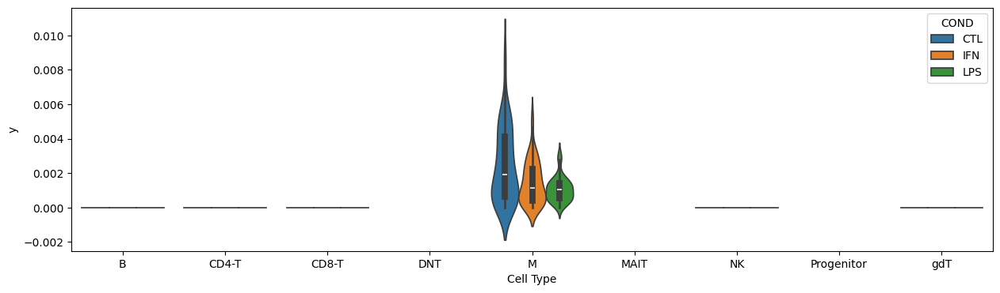

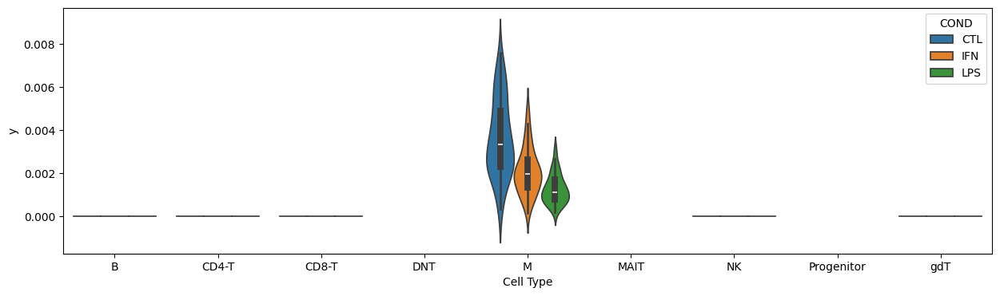

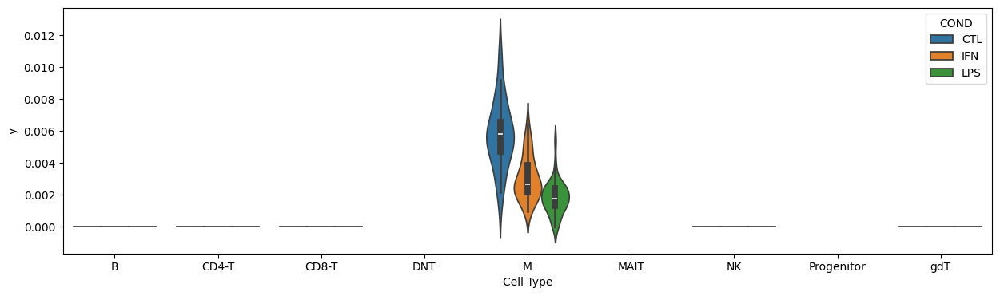

In [122]:
for POP in ['Fulani','Tikari','CHG']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[32]]
    plt.figure(figsize = (15,4))
    ax = sns.violinplot(pd.DataFrame({'y' : y, 'Cell Type' : scores_means[scores_means['Ethnicity']==POP]['cytopus_names'],
                             'COND' : scores_means[scores_means['Ethnicity']==POP]['COND']},
                             index=scores_means[scores_means['Ethnicity']==POP].index),
               x = 'Cell Type', y = 'y', hue = 'COND')

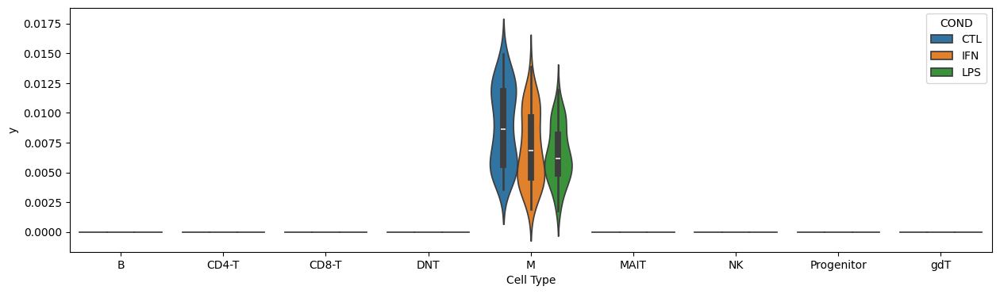

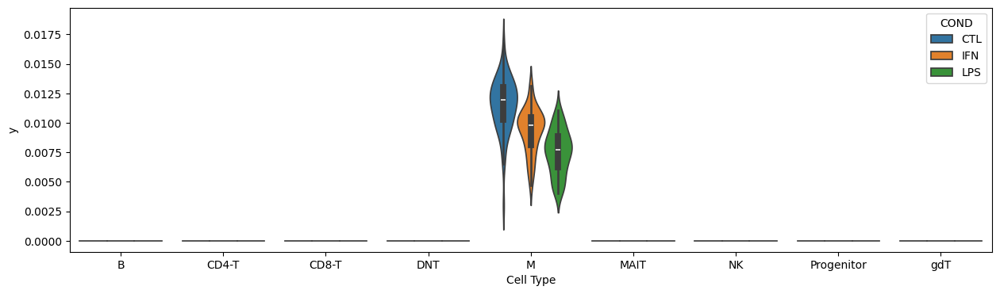

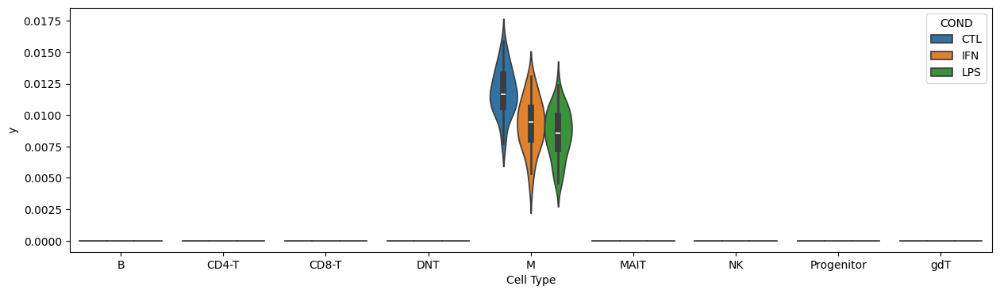

In [31]:
for POP in ['Fulani','Tikari','CHG']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[26]]
    plt.figure(figsize = (15,4))
    ax = sns.violinplot(pd.DataFrame({'y' : y, 'Cell Type' : scores_means[scores_means['Ethnicity']==POP]['cytopus_names'],
                             'COND' : scores_means[scores_means['Ethnicity']==POP]['COND']},
                             index=scores_means[scores_means['Ethnicity']==POP].index),
               x = 'Cell Type', y = 'y', hue = 'COND')

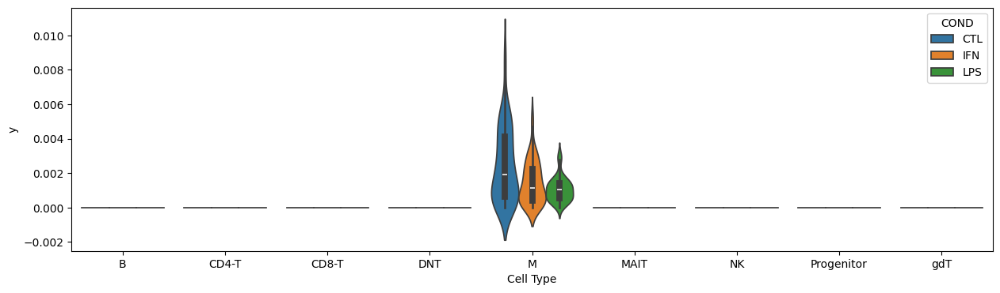

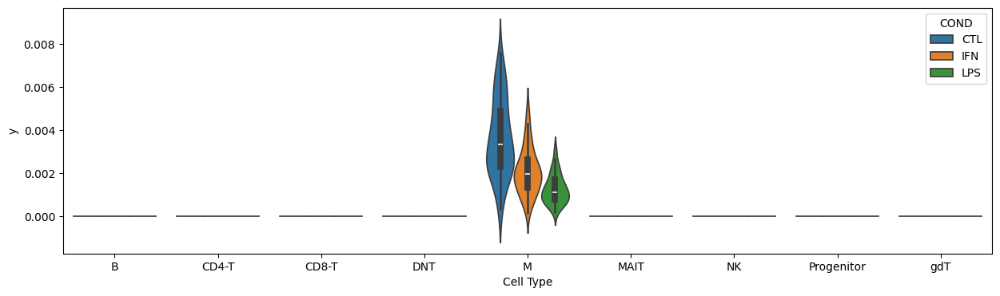

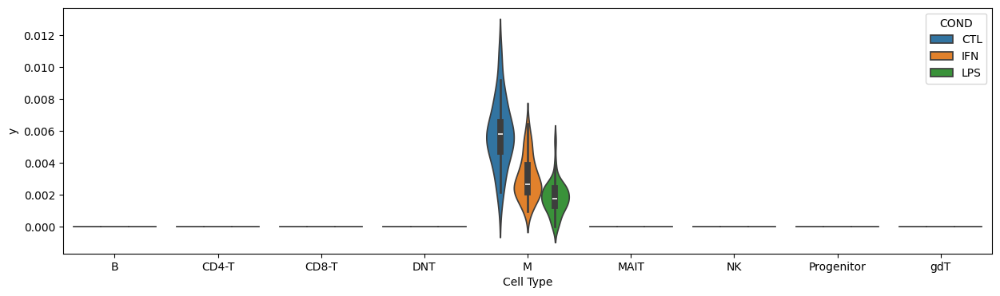

In [54]:
for POP in ['Fulani','Tikari','CHG']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[32]]
    plt.figure(figsize = (15,4))
    ax = sns.violinplot(pd.DataFrame({'y' : y, 'Cell Type' : scores_means[scores_means['Ethnicity']==POP]['cytopus_names'],
                             'COND' : scores_means[scores_means['Ethnicity']==POP]['COND']},
                             index=scores_means[scores_means['Ethnicity']==POP].index),
               x = 'Cell Type', y = 'y', hue = 'COND')

In [146]:
pd.DataFrame(factor_pvals, index=factor_gt0, columns=X_df.columns)

,Intercept,EBT1,EBT10,EBT20,EBT6,EBT7,EBT8,EBT9,FZ1,FZ2,...,NX29,NX41,WYJ1,WYJ2,WYJ3,WYJ4,WYJ5,M,AGE,Fulani
0-X-global-X-0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1-X-global-X-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2-X-global-X-2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22-X-M-X-M_IL17A_response,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23-X-M-X-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24-X-M-X-M_IL17A_response,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25-X-M-X-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26-X-M-X-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27-X-M-X-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28-X-M-X-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
#so you can construct a dataframe for the factor gene weights

#include cell type specificity as a prefix into the index
index_labels = adata.uns['SPECTRA_overlap'].index
gene_weights = pd.DataFrame(adata.uns['SPECTRA_factors'], 
                            index= index_labels,
                            columns=adata.var[adata.var['spectra_vocab']].index)

In [78]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [100]:
X_df = pd.concat([pd.DataFrame({'Intercept' : 1}, index=adata.obs.index),
                  pd.get_dummies(adata.obs['BATCH']).drop('EBT5', axis=1),
                  pd.get_dummies(adata.obs['SEX'])[['M']],
                  adata.obs[['AGE']],
                  pd.get_dummies(adata.obs['COND']).drop('CTL', axis=1),
                  pd.get_dummies(adata.obs['Ethnicity']).drop('Tikari', axis=1)],
                 axis=1)
X = X_df.to_numpy()

In [101]:
factor_pvals = []
factor_betas = []

In [102]:
for i in range(adata.obsm['SPECTRA_cell_scores'].shape[1]):
    y = adata.obsm['SPECTRA_cell_scores'][:,i]

    model = sm.OLS(y, X).fit()
    factor_pvals.append(model.pvalues)

KeyboardInterrupt: 

In [ ]:
factor_pval_df = pd.DataFrame(factor_pvals, index=adata.uns['SPECTRA_overlap'].index, columns=X_df.columns)

In [ ]:
factor_pval_df.sort_values('EBT1')

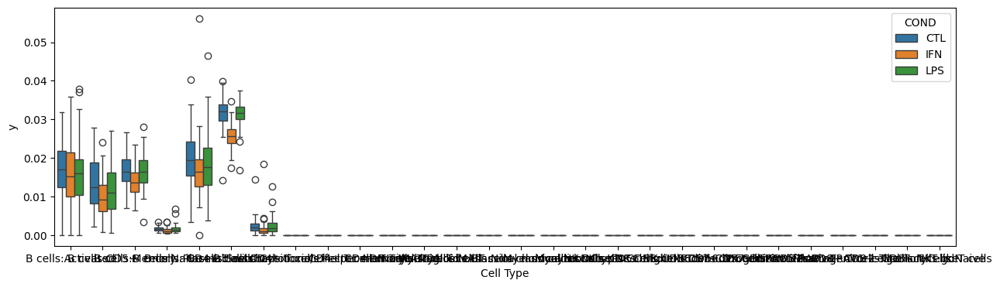

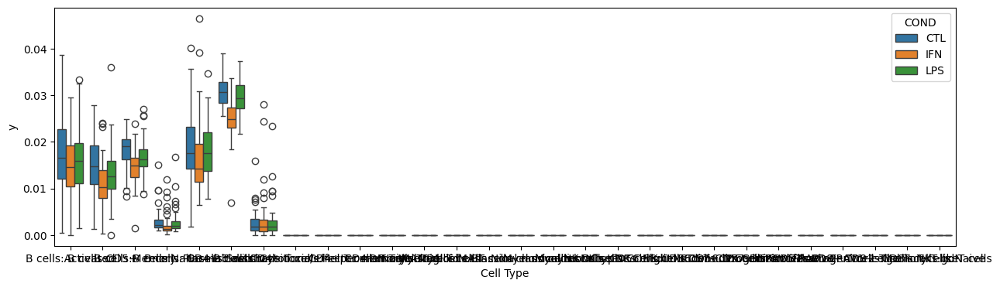

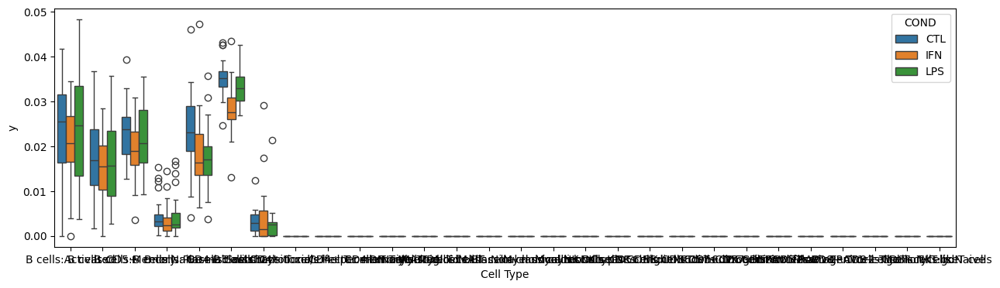

In [160]:
for POP in ['Fulani','Tikari','CHG']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[6]]
    plt.figure(figsize = (15,4))
    ax = sns.boxplot(pd.DataFrame({'y' : y, 'Cell Type' : scores_means[scores_means['Ethnicity']==POP]['ct2'],
                             'COND' : scores_means[scores_means['Ethnicity']==POP]['COND']},
                             index=scores_means[scores_means['Ethnicity']==POP].index),
               x = 'Cell Type', y = 'y', hue = 'COND')

In [161]:
adata.uns['SPECTRA_markers'][6]

array(['OSBPL10', 'BANK1', 'GNG7', 'TBC1D9', 'BLK', 'AP002075.1',
       'MARCH1', 'SETBP1', 'IGHA1', 'RALGPS2', 'TNFRSF13B', 'EBF1',
       'TFEC', 'AIM2', 'IGHA2', 'COBLL1', 'SOX5', 'ADAM28', 'AC120193.1',
       'DENND5B', 'TEX9', 'IGHG1', 'AFF3', 'SGPP1', 'COL4A4', 'ARHGAP24',
       'IGHG3', 'CDK14', 'LARGE1', 'SCIMP', 'SSPN', 'C12orf74', 'MS4A1',
       'CCDC50', 'AL592429.2', 'CLECL1', 'TSBP1-AS1', 'IGHG2', 'CIITA',
       'USP6NL', 'COL4A3', 'POU2AF1', 'LINC01781', 'LINC00926', 'ANGPTL1',
       'WDFY4', 'GRAMD1C', 'PLCG2', 'MEF2C', 'ZDHHC14'], dtype=object)

In [190]:
adata.uns['SPECTRA_overlap'].iloc[18]

B_IgM-ligation_response             0.000000
B_Breg_UP                           0.000000
B_effector-2_UP                     0.000000
B_effector-1_UP                     0.000000
CD4-T_TH17_UP                       0.000000
CD4-T_IL4_response                  0.000000
CD4-T_TH2_UP                        0.000000
CD4-T_TH9_UP                        0.000000
CD4-T_TH22_UP                       0.000000
CD4-T_IL12_response                 0.000000
Treg_FoxP3-stabilization            0.000000
M_IL17A_response                    0.000000
M_mac_CSF1_response                 0.000000
M_angiogenic-effectors              0.000000
mast_granule-exocytosis             0.000000
mast_mast-cell-granule-effectors    0.000000
DC_LPS_response                     0.020000
DC_antigen-crosspresentation        0.000000
Mac_IFNG_response                   0.000000
Mac_CSF1_response                   0.000000
Mac_IL4-IL13_response               0.000000
Mac_LPS_response                    0.000000
neutro_CXC

In [158]:
y = scores_means[adata.uns['SPECTRA_overlap'].index[18]]
plt.figure(figsize = (6,4))
sns.lmplot(pd.DataFrame({'y' : y, 'AGE' : scores_means[scores_means['cytopus_names']=='CD8-T']['AGE']},
                         index=scores_means[scores_means['cytopus_names']=='CD8-T'].index),
           x = 'AGE', y = 'y')

KeyError: 'cytopus_names'

<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

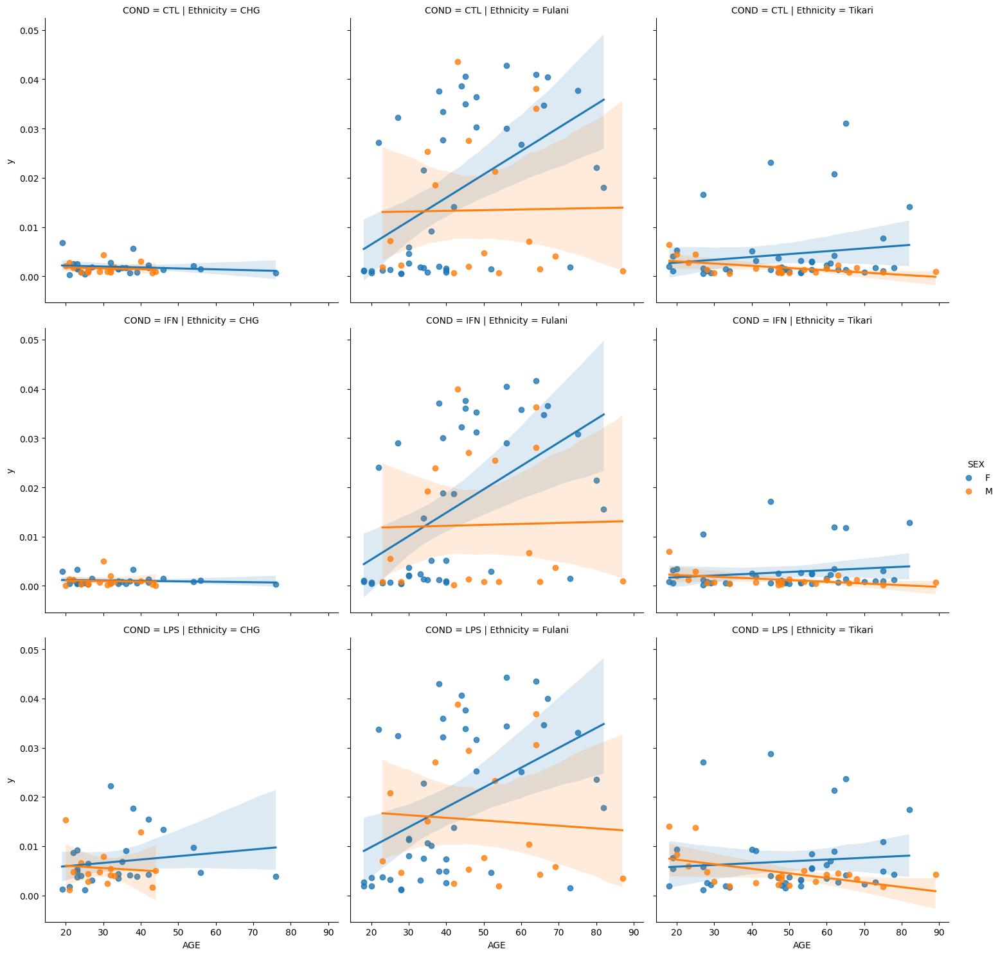

In [90]:
y = scores_means[adata.uns['SPECTRA_overlap'].index[24]]
plt.figure(figsize = (6,4))
sns.lmplot(pd.DataFrame({'y' : y, 'AGE' : scores_means[scores_means['cytopus_names']=='M']['AGE'],
                        'Ethnicity': scores_means[scores_means['cytopus_names']=='M']['Ethnicity'],
                        'SEX': scores_means[scores_means['cytopus_names']=='M']['SEX'],
                        'COND': scores_means[scores_means['cytopus_names']=='M']['COND']},
                         index=scores_means[scores_means['cytopus_names']=='M'].index),
           x = 'AGE', y = 'y', col='Ethnicity', row='COND', hue='SEX')

<Figure size 600x400 with 0 Axes>

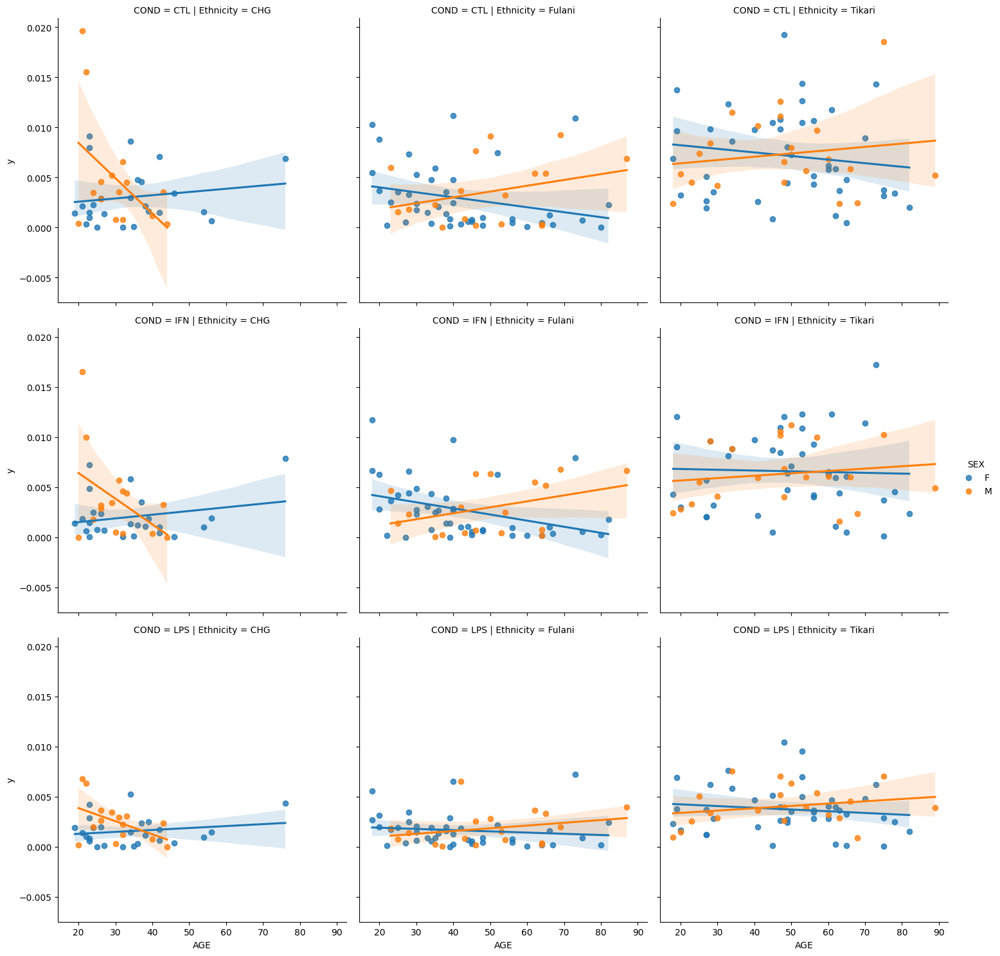

In [31]:
y = scores_means[adata.uns['SPECTRA_overlap'].index[30]]
plt.figure(figsize = (6,4))
sns.lmplot(pd.DataFrame({'y' : y, 'AGE' : scores_means[scores_means['cytopus_names']=='M']['AGE'],
                        'Ethnicity': scores_means[scores_means['cytopus_names']=='M']['Ethnicity'],
                        'SEX': scores_means[scores_means['cytopus_names']=='M']['SEX'],
                        'COND': scores_means[scores_means['cytopus_names']=='M']['COND']},
                         index=scores_means[scores_means['cytopus_names']=='M'].index),
           x = 'AGE', y = 'y', col='Ethnicity', row='COND', hue='SEX')

<Figure size 600x400 with 0 Axes>

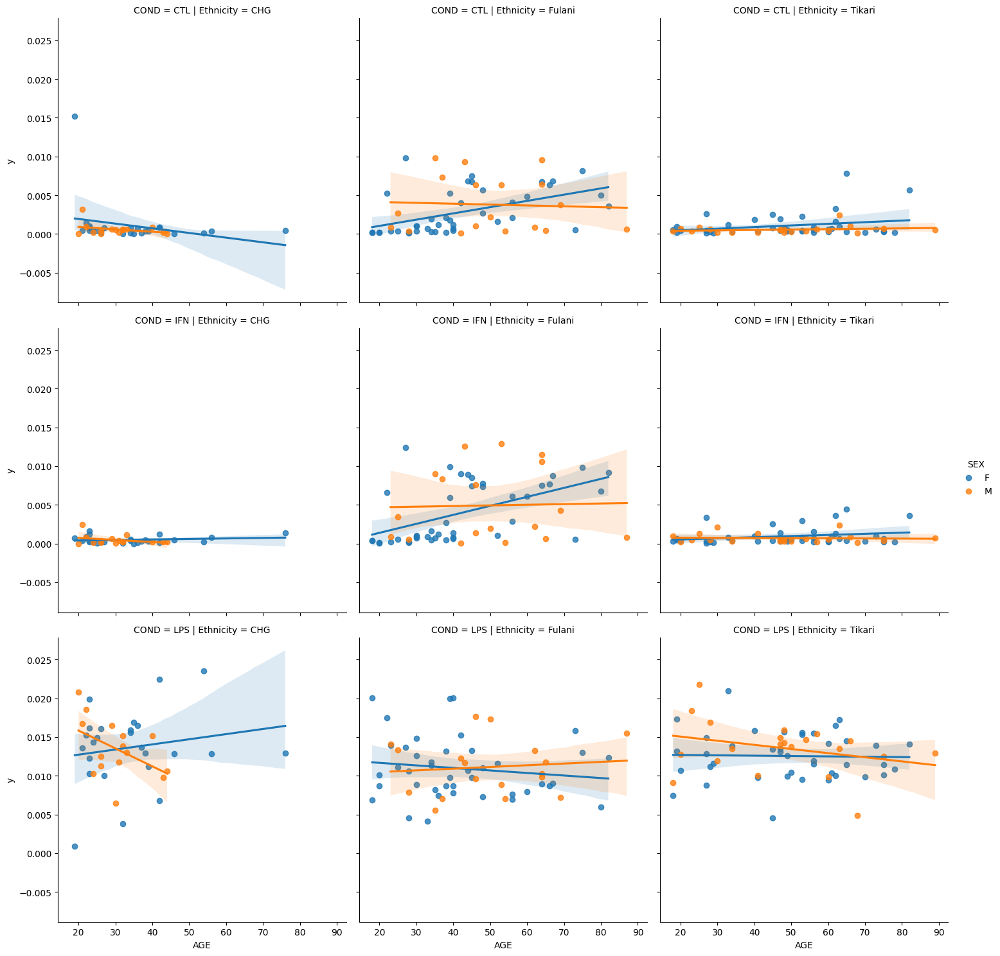

In [110]:
y = scores_means[adata.uns['SPECTRA_overlap'].index[29]]
plt.figure(figsize = (6,4))
sns.lmplot(pd.DataFrame({'y' : y, 'AGE' : scores_means[scores_means['ct2']=='Myeloid cells:Classical monocytes']['AGE'],
                        'Ethnicity': scores_means[scores_means['ct2']=='Myeloid cells:Classical monocytes']['Ethnicity'],
                        'SEX': scores_means[scores_means['ct2']=='Myeloid cells:Classical monocytes']['SEX'],
                        'COND': scores_means[scores_means['ct2']=='Myeloid cells:Classical monocytes']['COND']},
                         index=scores_means[scores_means['ct2']=='Myeloid cells:Classical monocytes'].index),
           x = 'AGE', y = 'y', col='Ethnicity', row='COND', hue='SEX')

In [79]:
adata.uns['SPECTRA_markers'][24]

array(['CXCL5', 'IL1B', 'SERPINB2', 'CXCL3', 'CXCL8', 'CXCL1', 'PID1',
       'S100A9', 'EREG', 'CXCL2', 'MT1G', 'S100A8', 'SOX5', 'IER3',
       'CCL3L1', 'AC025580.2', 'GLIS3', 'FCER1G', 'CD14', 'CCL3',
       'C15orf48', 'EPB41L3', 'TLR2', 'THBS1', 'MMP14', 'NAMPT',
       'TNFAIP6', 'CTSL', 'MT1H', 'ITGB8', 'PTGS2', 'ABCA1', 'HCK',
       'PLAUR', 'IL24', 'MET', 'SLC7A11', 'MT1M', 'PILRA', 'DOCK4',
       'CCL4', 'SLC25A37', 'SOD2', 'IL1A', 'ANPEP', 'KYNU', 'MARCKS',
       'SNX9', 'MT1E', 'MT1F'], dtype=object)

In [81]:
adata.uns['SPECTRA_markers'][26]

array(['LGALS3', 'FTH1', 'CSTB', 'IFI30', 'FTL', 'C15orf48', 'S100A11',
       'TYROBP', 'CEBPB', 'CD63', 'ATP6V0B', 'TXN', 'IL1RN', 'GPX4',
       'ANXA5', 'CD68', 'SMIM25', 'GSTO1', 'CTSL', 'PIM3', 'PLA2G7',
       'VIM', 'NPC2', 'LGALS1', 'S100A6', 'DYNLL1', 'TIMP1', 'UPP1',
       'PRDX1', 'RPS27L', 'TALDO1', 'TMSB10', 'CD9', 'CTSZ', 'CST3',
       'SEC61G', 'MFSD12', 'ANXA2', 'RAC1', 'CDKN1A', 'VASP', 'CTSB',
       'CYBA', 'CLIC1', 'NCF2', 'SEC61B', 'MYL12B', 'TYMP', 'HMOX1',
       'LMNA'], dtype=object)

In [85]:
adata.uns['SPECTRA_markers'][27]

array(['CSF1', 'TM4SF19', 'LPL', 'RGCC', 'SCG5', 'OCSTAMP', 'CCL3',
       'ATF3', 'IL1RN', 'SPP1', 'MATK', 'EMP1', 'MMP9', 'DOCK3', 'SPRED1',
       'GREM1', 'SDC2', 'RASAL2', 'INHBA', 'NRP1', 'PHLDA1', 'GPC4',
       'SH3RF3', 'CD9', 'C5AR1', 'CTSL', 'GPAT3', 'PLAUR', 'DUSP6',
       'TGM2', 'ITGAM', 'MMP19', 'CXCL5', 'MFSD12', 'MYO1E', 'DCSTAMP',
       'LINC02345', 'CCR1', 'ASPH', 'RAB7B', 'TNFSF14', 'LINC01705',
       'ACTN1', 'EGR2', 'AC067751.1', 'ALCAM', 'FLRT2', 'CD109', 'ITGAX',
       'CDCP1'], dtype=object)

<Figure size 600x400 with 0 Axes>

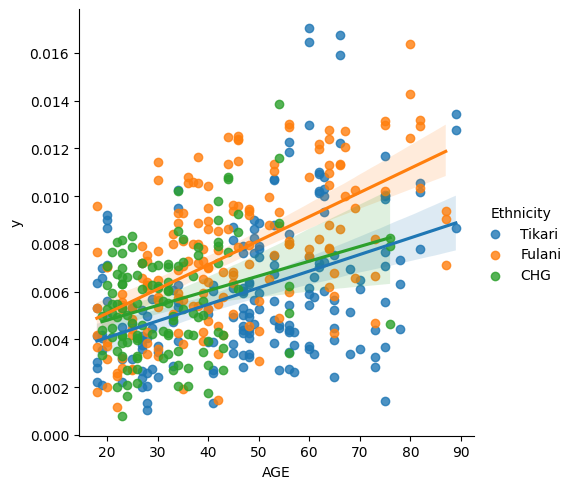

In [72]:
y = scores_means[adata.uns['SPECTRA_overlap'].index[20]]
plt.figure(figsize = (6,4))
sns.lmplot(pd.DataFrame({'y' : y, 'AGE' : scores_means[scores_means['cytopus_names']=='CD8-T']['AGE'],
                        'Ethnicity': scores_means[scores_means['cytopus_names']=='CD8-T']['Ethnicity']},
                         index=scores_means[scores_means['cytopus_names']=='CD8-T'].index),
           x = 'AGE', y = 'y', hue='Ethnicity')

<Figure size 600x400 with 0 Axes>

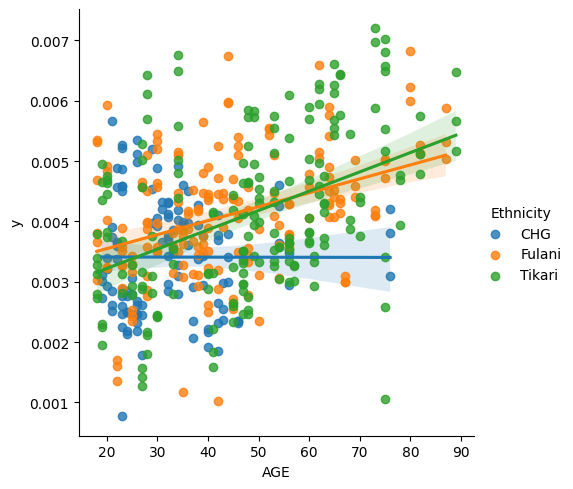

In [203]:
y = scores_means[adata.uns['SPECTRA_overlap'].index[8]]
plt.figure(figsize = (6,4))
sns.lmplot(pd.DataFrame({'y' : y, 'AGE' : scores_means[scores_means['cytopus_names']=='CD4-T']['AGE'],
                        'Ethnicity': scores_means[scores_means['cytopus_names']=='CD4-T']['Ethnicity']},
                         index=scores_means[scores_means['cytopus_names']=='CD4-T'].index),
           x = 'AGE', y = 'y', hue='Ethnicity')

In [204]:
adata.uns['SPECTRA_markers'][8]

array(['TSHZ2', 'FAAH2', 'ST8SIA1', 'AL109930.1', 'TBC1D4', 'ARID5B',
       'ICOS', 'SESN3', 'AC139720.1', 'RBMS3', 'MALAT1', 'AP000787.1',
       'SPON1', 'AL353660.1', 'LINC01727', 'INPP4B', 'PVT1', 'PLCL1',
       'RTKN2', 'IL2RA', 'TIGIT', 'MAF', 'TSPAN5', 'ZEB1', 'CMTM8',
       'PYHIN1', 'GPRIN3', 'LDLRAD4', 'F5', 'LIMS1', 'DLGAP1', 'GLCCI1',
       'AC053513.1', 'PASK', 'TAFA2', 'CTLA4', 'TNIK', 'ZC3H12D', 'CASK',
       'LEF1', 'BCL2', 'IL6ST', 'ITK', 'MT-ATP6', 'AL136456.1', 'ANK3',
       'TP53INP1', 'C1orf112', 'AP000820.2', 'BICDL1'], dtype=object)

## Heatmap

I'm going to take the top X genes per factor (or perhaps filter by some threshold) and create a heatmap. Let's say top 20 genes -> 800 rows.

First create a dictionary of cluster names and markers

In [143]:
# colors for plots
pop_cols = {'CHG': '#60B944',
            'Fulani': '#DD6060',
            'Tikari': '#538AE5'
           }

cond_cols = {'CTL':'#A8C9FF', 'IFN':'#C625C7', 'LPS':'#FF933B'}

# ctype_cols = {'Macrophages': '#E93E3E',
#               'Dendritic cells': '#E9A53E',
#               'ILC and NK cells': '#EAEB4C',
#               'Age-associated B cells': '#1E20B3',
#               'Memory B cells': '#7879BE',
#               'Naive B cells': '#B2B3FF',
#               'Regulatory T cells': '#00CD2A',
#               'Naive T cells': '#82FB9B',
#               'Cytotoxic T cells': '#49C79C',
#               'T helper cells': '#95E75F',
#               'MAIT cells': '#41E6E2',
#               'Mast cells': '#EE2FA6',
#               'Plasma cells': '#01D3E2',
#               'Plasmablasts': '#0091E5'}

ctype_cols = {'M': '#E93E3E',
              'NK': '#f7d825',
              'B': '#7879BE',
              'CD4-T': '#49C79C',
              'CD8-T': '#49753d',
              'gdT': '#49c7c3'}

In [ ]:
gex_means = pd.read_csv("output/ctype_cond_fid.means.tsv.gz")

In [17]:
factors = list(adata.uns['SPECTRA_overlap'].index)

In [ ]:
[item for sublist in list_of_lists for item in sublist]

In [104]:
genes_top20 = [i for x in adata.uns['SPECTRA_markers'] for i in x[0:20]]

In [107]:
len(genes_top20)

820

In [154]:
len(adata.uns['SPECTRA_markers'])

41

In [121]:
fid_eth_AGE_SEX = adata.obs[['FID','Ethnicity','AGE','SEX']].drop_duplicates()

In [122]:
genes_top20_df = gex_means.loc[genes_top20].transpose()
genes_top20_df.index = pd.MultiIndex.from_tuples(genes_top20_df.index)
genes_top20_df = genes_top20_df.reset_index(names=['cytopus_names','COND','FID'])

In [123]:
genes_top20_df = genes_top20_df.merge(fid_eth_AGE_SEX)

In [125]:
genes_top20_df['cytopus_names'].value_counts()

B             486
CD4-T         486
CD8-T         486
M             486
NK            486
gdT           486
MAIT          472
Progenitor    427
DNT           212
Name: cytopus_names, dtype: int64

In [126]:
genes_top20_df.head()

,cytopus_names,COND,FID,CCL5,CST7,CRIP1,CD52,IL32,GZMB,GNLY,...,LAG3,PRF1,GZMB,KLRB1,LINC02384,SYTL2,AF165147.1,Ethnicity,AGE,SEX
0,B,CTL,D0005,0.034435,0.010219,0.442037,1.379301,0.023869,0.000000,0.006953,...,0.001654,0.002837,0.000000,0.011934,0.023279,0.012232,0.019930,CHG,39.0,F
1,B,IFN,D0005,0.008146,0.006217,0.363076,1.061141,0.026033,0.005623,0.000688,...,0.009715,0.006058,0.005623,0.009340,0.076550,0.009159,0.014428,CHG,39.0,F
2,B,LPS,D0005,0.043529,0.013670,0.455668,1.346836,0.036303,0.012101,0.014321,...,0.001366,0.006981,0.012101,0.012451,0.043614,0.011635,0.042118,CHG,39.0,F
3,CD4-T,CTL,D0005,0.172048,0.040507,0.468493,1.102918,1.129525,0.011146,0.021451,...,0.007829,0.012051,0.011146,0.074570,0.006084,0.064976,0.072811,CHG,39.0,F
4,CD4-T,IFN,D0005,0.128310,0.025582,0.204628,0.760052,1.294981,0.008052,0.027346,...,0.061396,0.017765,0.008052,0.077539,0.022963,0.084356,0.206201,CHG,39.0,F


In [139]:
from scipy.stats import zscore

# group by cell type and calculate z-score
gex_df_list = []
for ctype in ['B','CD4-T','CD8-T','M','NK','gdT']:

    ctype_df = genes_top20_df[genes_top20_df['cytopus_names']==ctype]

    conds = ctype_df['COND']
    eths = ctype_df['Ethnicity']
    ages = ctype_df['AGE']
    sexes = ctype_df['SEX']
    gex_df_tmp = ctype_df.drop(['cytopus_names','COND','FID','Ethnicity','AGE','SEX'], axis=1).apply(zscore, axis=0)
    gex_df_tmp['ctype'] = ctype
    gex_df_tmp['cond'] = conds
    gex_df_tmp['ethnicity'] = eths
    gex_df_tmp['age'] = ages
    gex_df_tmp['sex'] = sexes
    gex_df_list.append(gex_df_tmp)
                    
gex_df_z = pd.concat(gex_df_list)

In [148]:
gex_df_z = gex_df_z.sort_values(['ctype','ethnicity','cond','sex','age'])

In [150]:
gex_df_z_sub = gex_df_z.drop(['ctype','ethnicity','cond','sex','age','pop_col','ctype_col','cond_col'], axis=1)
#gex_df_z_sub = gex_df_z_sub.loc[:,~gex_df_z_sub.isna().any(axis=0)]

In [151]:
gex_df_z['pop_col'] = gex_df_z['ethnicity'].apply(lambda x: pop_cols[x])
gex_df_z['ctype_col'] = gex_df_z['ctype'].apply(lambda x: ctype_cols[x])
gex_df_z['cond_col'] = gex_df_z['cond'].apply(lambda x: cond_cols[x])

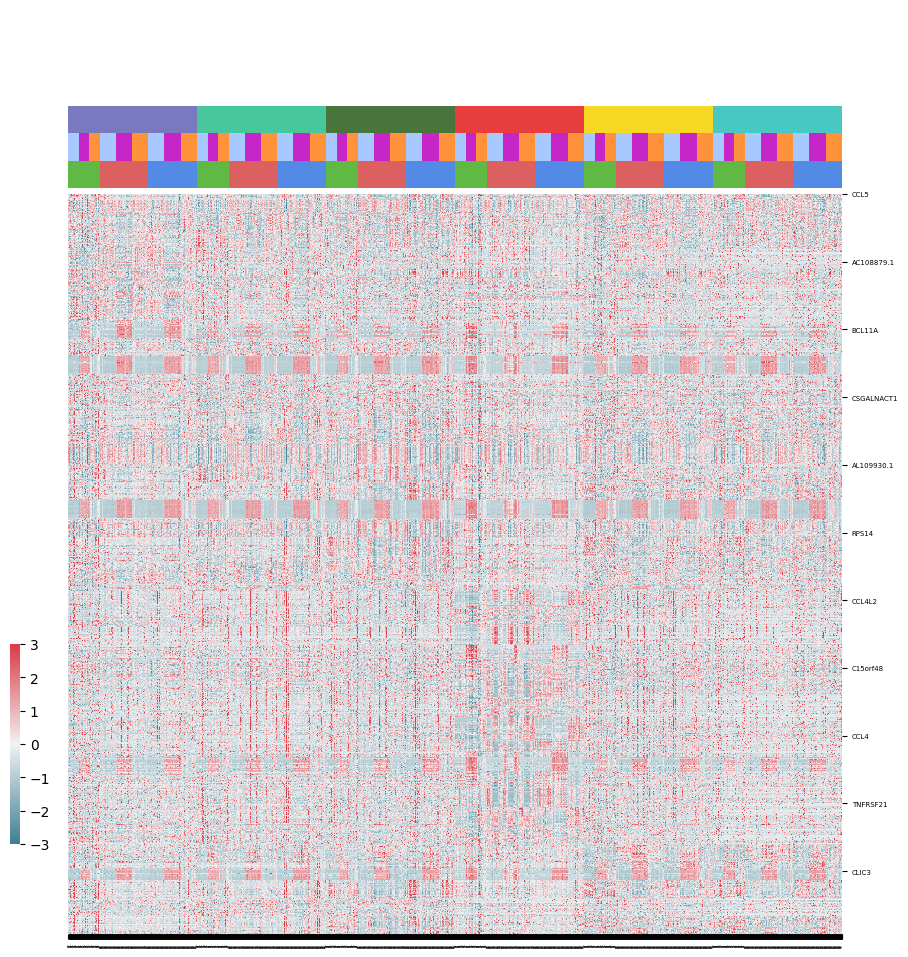

In [153]:
cmap = sns.diverging_palette(220, 10, as_cmap=True)
cg = sns.clustermap(gex_df_z_sub.transpose(),
                    method ='complete', cmap=cmap,
                    center=0, yticklabels=75, xticklabels=1, z_score=None,
                    row_cluster=False, col_cluster=False, vmin=-3, vmax=3, cbar_pos=(.05, .15, .01, .2),
                    dendrogram_ratio=0.1, colors_ratio=(0.005, 0.03),
                    col_colors=[gex_df_z['ctype_col'], gex_df_z['cond_col'], gex_df_z['pop_col']])
plt.setp(cg.ax_heatmap.xaxis.get_majorticklabels(), rotation=90, size=1)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), size=5)
cg.ax_row_dendrogram.set_visible(False)

## Visualization

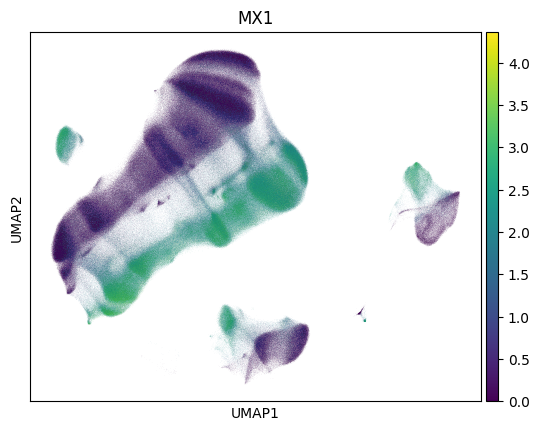

In [10]:
sc.pl.umap(adata, color="MX1")

In [13]:
adata

AnnData object with n_obs × n_vars = 2416314 × 36601 backed at '../../test/test123/write/qc_020725.spectra_out.4k.h5ad'
    obs: 'donor_id', 'library', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'log10_total_counts', 'doublet_score', 'predicted_doublet', 'FID', 'LID', 'TID', 'COHORT', 'COND', 'SEX', 'AGE', 'POP', 'Ethnicity', 'FCluster_names', 'Cluster_names', 'SCluster_names', 'cytopus_names', 'BATCH', 'ct2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'spectra_vocab'
    uns: 'SPECTRA_L', 'SPECTRA_factors', 'SPECTRA_markers', 'SPECTRA_overlap', 'hvg', 'log1p'
    obsm: 'SPECTRA_cell_scores', 'X_umap'

In [14]:
gdt_gex = grouped_obs_mean(adata, group_key=['cytopus_names','COND','FID'])


KeyboardInterrupt



In [ ]:
gdt_gex.head()

## Association with biological factors in CTL cells

In [4]:
adata = sc.read_h5ad("output/qc_020725.spectra_out.CTL.10k.h5ad", backed='r')

In [6]:
adata_umap = sc.read_h5ad("../../test/test123/write/qc_020725_wctypes.harmony.umap.h5ad", backed='r')

In [7]:
adata.obsm['X_umap'] = adata_umap[adata.obs_names].obsm['X_umap']

In [8]:
scores_df = pd.DataFrame(adata.obsm['SPECTRA_cell_scores'], index=adata.obs.index, columns=adata.uns['SPECTRA_overlap'].index)

In [9]:
adata.obs[adata.uns['SPECTRA_overlap'].index] = scores_df

In [18]:
site_date_info = adata.obs[['FID']].reset_index().merge(site_collect[['FID','site','date']]).set_index('index')

In [20]:
adata.obs.loc[site_date_info.index,'site'] = site_date_info['site']
adata.obs.loc[site_date_info.index,'date'] = site_date_info['date']
adata.obs['site'] = pd.Series(adata.obs['site'], dtype="category")
adata.obs['date'] = pd.Series(adata.obs['date'], dtype="category")

In [22]:
contam_dates = ["2015-06-14 00:00:00", "2015-06-15 00:00:00", "2015-06-16 00:00:00"]

In [23]:
adata.obs['Sabga_June'] = pd.Series((adata.obs['site']=="Sabga") & 
                                    (adata.obs['date'].isin(contam_dates)), dtype='category')

In [24]:
scores_means = scores_df.merge(adata.obs[['FID','COND','cytopus_names']], left_index=True, right_index=True) \
    .groupby(['FID','COND','cytopus_names']).mean().reset_index().merge(adata.obs[['FID','AGE','SEX','Ethnicity','Sabga_June']].drop_duplicates())

In [26]:
scores_means['Ethnicity'] = pd.Categorical(scores_means['Ethnicity'], categories=['Tikari','Fulani','CHG'])

In [27]:
# Drop Progenitor, DNT, and MAIT due to low cell numbers and NaN
scores_means = scores_means[~scores_means['cytopus_names'].isin(['Progenitor','DNT','MAIT'])]

In [28]:
factors = adata.uns['SPECTRA_overlap'].index

In [ ]:
# LMM with individual as random effect
# Sabga as covariate
results_list_ctl = []

for factor in factors:
    
    scores_factor = scores_means[['cytopus_names','FID','AGE','SEX','Ethnicity','Sabga_June',factor]]
    ctype_scores = scores_factor.groupby('cytopus_names').sum().reset_index()
    ctype_keep = ctype_scores[~(ctype_scores[factor]==0)]['cytopus_names'].astype(str)

    for ctype in ctype_keep:
        
        scores_sub = scores_factor[scores_factor['cytopus_names']==ctype]
        scores_sub[factor] = (scores_sub[factor] - np.mean(scores_sub[factor])) / np.std(scores_sub[factor])
        formula = "Q(\"" + factor + "\")" + " ~ AGE + SEX + Ethnicity + Sabga_June"
        md = smf.mixedlm(formula, scores_sub, groups=scores_sub['FID'])
        mdf = md.fit()

        results_df = mdf.params.to_frame('param')\
            .merge(mdf.pvalues.to_frame('pvalue'), left_index=True, right_index=True)\
            .reset_index(names="var")
        results_df['ctype'] = ctype
        results_df['factor'] = factor
        
        results_list_ctl.append(results_df)

In [ ]:
# LMM with individual as random effect
# remove samples from Sabga
results_list_ns_ctl = []

scores_means_nosabga = scores_means[scores_means['Sabga_June']==False]

for factor in factors:
    
    scores_factor = scores_means_nosabga[['cytopus_names','FID','AGE','SEX','Ethnicity',factor]]
    ctype_scores = scores_factor.groupby('cytopus_names').sum().reset_index()
    ctype_keep = ctype_scores[~(ctype_scores[factor]==0)]['cytopus_names'].astype(str)

    for ctype in ctype_keep:
        
        scores_sub = scores_factor[scores_factor['cytopus_names']==ctype]
        scores_sub[factor] = (scores_sub[factor] - np.mean(scores_sub[factor])) / np.std(scores_sub[factor])
        formula = "Q(\"" + factor + "\")" + " ~ AGE + SEX + Ethnicity"
        md = smf.mixedlm(formula, scores_sub, groups=scores_sub['FID'])
        mdf = md.fit()

        results_df = mdf.params.to_frame('param')\
            .merge(mdf.pvalues.to_frame('pvalue'), left_index=True, right_index=True)\
            .reset_index(names="var")
        results_df['ctype'] = ctype
        results_df['factor'] = factor
        
        results_list_ns_ctl.append(results_df)

In [32]:
results_ctl_lmm = pd.concat(results_list_ctl)

In [33]:
results_ns_ctl_lmm = pd.concat(results_list_ns_ctl)

In [34]:
for factor in factors:
    print(results_ctl_lmm[results_ctl_lmm['factor']==factor].sort_values('pvalue').head(10))

                   var     param        pvalue  ctype          factor
5                  AGE  0.017410  7.429558e-49  CD4-T  0-X-global-X-0
2  Ethnicity[T.Fulani] -0.660854  2.328674e-16    gdT  0-X-global-X-0
0            Intercept -0.848517  4.022447e-15  CD4-T  0-X-global-X-0
2  Ethnicity[T.Fulani] -0.913997  4.125918e-14     NK  0-X-global-X-0
5                  AGE  0.020984  2.612492e-10    gdT  0-X-global-X-0
0            Intercept -0.909984  7.819667e-08    gdT  0-X-global-X-0
3     Ethnicity[T.CHG]  0.800674  4.150874e-07    gdT  0-X-global-X-0
3     Ethnicity[T.CHG]  0.648428  1.378831e-05     NK  0-X-global-X-0
2  Ethnicity[T.Fulani] -0.564893  2.047766e-04  CD8-T  0-X-global-X-0
5                  AGE  0.014748  3.114582e-04  CD8-T  0-X-global-X-0
                   var     param        pvalue  ctype          factor
0            Intercept  1.034664  3.168793e-20    gdT  1-X-global-X-1
5                  AGE -0.030104  2.991997e-16  CD8-T  1-X-global-X-1
5                  A

In [35]:
for factor in factors:
    print(results_ns_ctl_lmm[results_ns_ctl_lmm['factor']==factor].sort_values('pvalue').head(10))

                   var     param        pvalue  ctype          factor
0            Intercept -1.032483  5.775788e-36    gdT  0-X-global-X-0
2  Ethnicity[T.Fulani] -0.910903  1.672519e-16     NK  0-X-global-X-0
4                  AGE  0.020557  8.186805e-12    gdT  0-X-global-X-0
4                  AGE  0.019065  1.725548e-10  CD4-T  0-X-global-X-0
0            Intercept -0.823922  2.943031e-09  CD4-T  0-X-global-X-0
3     Ethnicity[T.CHG]  0.787297  9.543630e-07    gdT  0-X-global-X-0
2  Ethnicity[T.Fulani] -0.652889  2.604827e-05    gdT  0-X-global-X-0
3     Ethnicity[T.CHG]  0.704034  6.526779e-05     NK  0-X-global-X-0
3     Ethnicity[T.CHG]  0.550603  2.767267e-04      B  0-X-global-X-0
4                  AGE  0.015331  2.856900e-04  CD8-T  0-X-global-X-0
                   var     param         pvalue  ctype          factor
0            Intercept  1.327352  6.694255e-130  CD8-T  1-X-global-X-1
4                  AGE -0.021930   6.858402e-32    gdT  1-X-global-X-1
4                

In [102]:
len(adata.uns['SPECTRA_markers'][0])

50

In [41]:
results_ctl_lmm[results_ctl_lmm['var']=="Ethnicity[T.Fulani]"].sort_values('pvalue').head(10)

,var,param,pvalue,ctype,factor
2,Ethnicity[T.Fulani],-0.660854,2.328674e-16,gdT,0-X-global-X-0
2,Ethnicity[T.Fulani],-0.913997,4.125918e-14,NK,0-X-global-X-0
2,Ethnicity[T.Fulani],0.573189,1.006831e-13,NK,1-X-global-X-1
2,Ethnicity[T.Fulani],0.887928,1.510263e-08,NK,37-X-NK-X-37
2,Ethnicity[T.Fulani],0.536674,1.227107e-07,M,27-X-M-X-27
2,Ethnicity[T.Fulani],-0.564893,2.047766e-04,CD8-T,0-X-global-X-0
2,Ethnicity[T.Fulani],-0.516266,2.755142e-04,CD4-T,11-X-CD4-T-X-11
2,Ethnicity[T.Fulani],0.561064,3.054768e-04,gdT,1-X-global-X-1
2,Ethnicity[T.Fulani],-0.681934,3.418324e-04,B,5-X-B-X-5
2,Ethnicity[T.Fulani],-0.465993,4.857719e-04,M,30-X-M-X-neutro_CXCL8_response


In [37]:
results_ns_ctl_lmm[results_ns_ctl_lmm['var']=="Ethnicity[T.Fulani]"].sort_values('pvalue').head()

,var,param,pvalue,ctype,factor
2,Ethnicity[T.Fulani],-0.814496,0.000000e+00,B,5-X-B-X-5
2,Ethnicity[T.Fulani],-0.910903,1.672519e-16,NK,0-X-global-X-0
2,Ethnicity[T.Fulani],0.910418,4.976709e-10,NK,37-X-NK-X-37
2,Ethnicity[T.Fulani],-0.652889,2.604827e-05,gdT,0-X-global-X-0
2,Ethnicity[T.Fulani],-0.696582,7.235044e-04,B,3-X-B-X-3


In [38]:
results_ns_ctl_lmm[results_ns_ctl_lmm['var']=="Ethnicity[T.CHG]"].sort_values('pvalue').head()

,var,param,pvalue,ctype,factor
3,Ethnicity[T.CHG],-1.036169,9.688519e-24,gdT,2-X-global-X-2
3,Ethnicity[T.CHG],1.257242,5.996352e-22,B,6-X-B-X-6
3,Ethnicity[T.CHG],1.272354,3.873992e-18,CD8-T,19-X-CD8-T-X-19
3,Ethnicity[T.CHG],1.198101,2.724797e-17,M,28-X-M-X-DC_antigen-crosspresentation
3,Ethnicity[T.CHG],1.334795,7.280821e-17,M,23-X-M-X-23


In [39]:
results_ns_ctl_lmm[results_ns_ctl_lmm['var']=="AGE"].sort_values('pvalue').head()

,var,param,pvalue,ctype,factor
4,AGE,-0.029465,2.095927e-41,CD8-T,18-X-CD8-T-X-18
4,AGE,-0.021930,6.858402e-32,gdT,1-X-global-X-1
4,AGE,0.021836,1.242473e-29,CD8-T,19-X-CD8-T-X-19
4,AGE,-0.029553,8.860882e-26,CD8-T,1-X-global-X-1
4,AGE,0.025600,9.251708e-21,CD8-T,17-X-CD8-T-X-17


In [40]:
results_ns_ctl_lmm[results_ns_ctl_lmm['var']=="SEX[T.M]"].sort_values('pvalue').head()

,var,param,pvalue,ctype,factor
1,SEX[T.M],0.391697,3.187283e-11,M,31-X-M-X-31
1,SEX[T.M],0.673344,3.148368e-05,CD8-T,20-X-CD8-T-X-20
1,SEX[T.M],0.561558,5.312072e-05,CD4-T,15-X-CD4-T-X-15
1,SEX[T.M],0.464055,3.858885e-04,NK,38-X-NK-X-38
1,SEX[T.M],0.582234,6.264052e-04,CD4-T,1-X-global-X-1


In [42]:
adata.uns['SPECTRA_markers'][5]

array(['IGKC', 'BASP1', 'CD83', 'ID3', 'FABP5', 'MARCKS', 'MS4A1',
       'HLA-DQA1', 'ENTPD1', 'HLA-DRA', 'RPL12', 'HSP90AB1', 'MIR155HG',
       'YBX1', 'ACTG1', 'HLA-DRB1', 'PRDX1', 'ANKRD33B', 'HLA-DPA1',
       'HERPUD1', 'CD79A', 'HLA-DQB1', 'CCL22', 'HDAC9', 'HSPD1',
       'SEC61B', 'SWAP70', 'PAX5', 'CTSH', 'INPP5F', 'REL', 'CD40',
       'RACK1', 'SPIB', 'GPX4', 'IRF4', 'ACTB', 'C1QBP', 'EBF1', 'RPS2',
       'ENO1', 'PKM', 'RPS6', 'LDHA', 'CD58', 'RPS23', 'RPL10', 'RPL32',
       'SEC11C', 'ATP5PF'], dtype=object)

In [99]:
adata.uns['SPECTRA_markers'][27]

array(['MMP9', 'MRC1', 'SCG5', 'CCL24', 'EMP1', 'CSF1', 'CCL1', 'RGCC',
       'SLC7A11', 'MITF', 'IL1RN', 'NRP1', 'MYO1E', 'RASAL2', 'ITGAX',
       'ITGAM', 'CYP1B1', 'INHBA', 'ASPH', 'OCSTAMP', 'AC067751.1',
       'SPRED1', 'CCR1', 'GSN', 'SDC2', 'MOB3B', 'EGR2', 'PLAUR', 'DUSP6',
       'CLEC5A', 'ARHGAP10', 'SLC16A6', 'CSF1R', 'SLC11A1', 'HBEGF',
       'CXCL5', 'CXCL8', 'EREG', 'C5AR1', 'MMP19', 'GREM1', 'TGM2',
       'ARHGAP31', 'LUCAT1', 'DOCK3', 'SPP1', 'MATK', 'CASS4',
       'AP000331.1', 'SERPINE1'], dtype=object)

In [85]:
adata.uns['SPECTRA_markers'][2]

array(['GRIP1', 'AC092652.1', 'AC024382.1', 'MBNL1-AS1', 'AC092652.2',
       'AC026470.2', 'AC012459.1', 'CYREN', 'ACO1', 'OPRM1', 'AL133334.1',
       'CASC19', 'HIF1A-AS3', 'AC002463.1', 'AC010149.1', 'MYCBP2-AS1',
       'AC090772.2', 'AP001610.2', 'ANGPT2', 'STRADB', 'FILIP1L',
       'AP000779.1', 'AC009554.1', 'ALG13-AS1', 'AC104365.1',
       'AC009950.1', 'C1orf112', 'AC087854.1', 'HBA2', 'AP000919.2',
       'AL157938.2', 'C11orf65', 'AC099063.1', 'AL023584.2', 'PGAP1',
       'LIPA', 'AC098829.1', 'AL121985.1', 'AC023424.3', 'AC131571.1',
       'AC068282.1', 'TMLHE-AS1', 'USP3-AS1', 'ZBTB20-AS5', 'AC009126.1',
       'AC010260.1', 'ATP8B1', 'GPATCH11', 'ESR2', 'AC053513.1'],
      dtype=object)

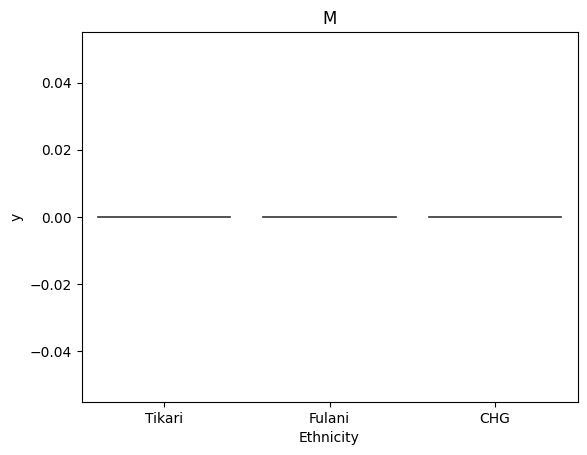

In [44]:
for ctype in ['M']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[27]]
    ax = sns.violinplot(pd.DataFrame({'y' : y, 'Ethnicity' : scores_means[scores_means['cytopus_names']==ctype]['Ethnicity'],
                             'COND' : scores_means[scores_means['cytopus_names']==ctype]['COND']},
                             index=scores_means[scores_means['cytopus_names']==ctype].index),
               x = 'Ethnicity', y = 'y', hue = 'Ethnicity')
    plt.title(ctype)

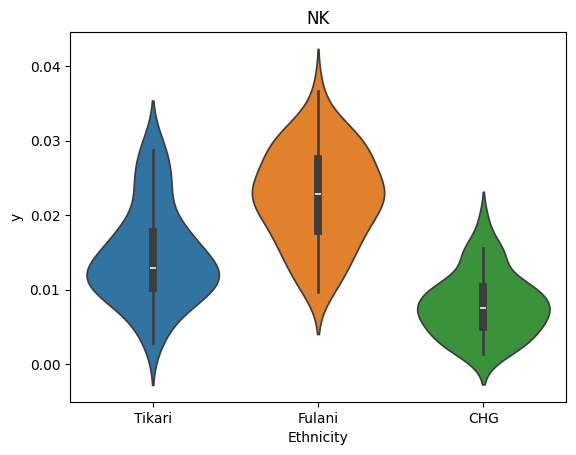

In [45]:
for ctype in ['NK']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[37]]
    ax = sns.violinplot(pd.DataFrame({'y' : y, 'Ethnicity' : scores_means[scores_means['cytopus_names']==ctype]['Ethnicity'],
                             'COND' : scores_means[scores_means['cytopus_names']==ctype]['COND']},
                             index=scores_means[scores_means['cytopus_names']==ctype].index),
               x = 'Ethnicity', y = 'y', hue = 'Ethnicity')
    plt.title(ctype)

In [ ]:
sc.pl.umap(adata, color=

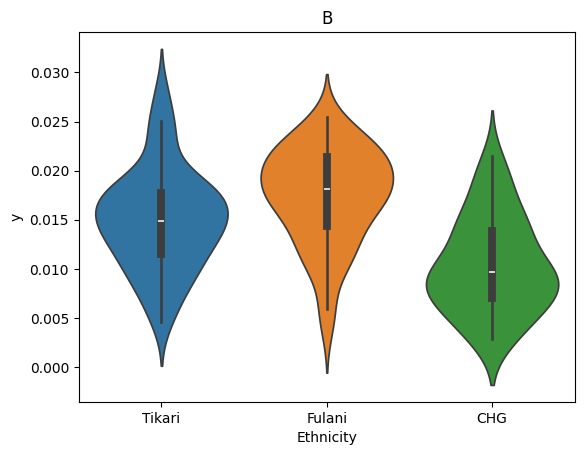

In [93]:
for ctype in ['B']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[7]]
    ax = sns.violinplot(pd.DataFrame({'y' : y, 'Ethnicity' : scores_means[scores_means['cytopus_names']==ctype]['Ethnicity'],
                             'COND' : scores_means[scores_means['cytopus_names']==ctype]['COND']},
                             index=scores_means[scores_means['cytopus_names']==ctype].index),
               x = 'Ethnicity', y = 'y', hue = 'Ethnicity')
    plt.title(ctype)

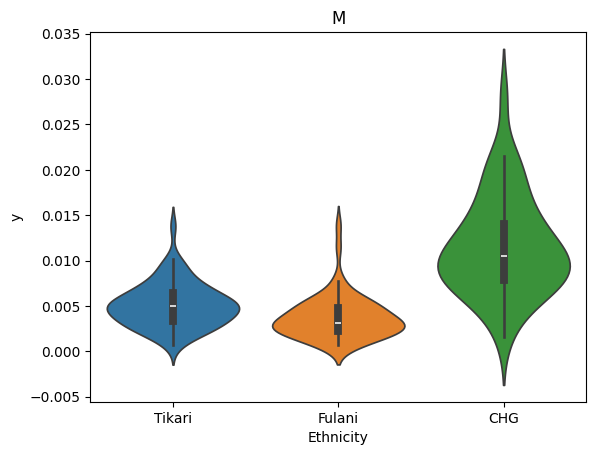

In [73]:
for ctype in ['M']:
    y = scores_means[adata.uns['SPECTRA_overlap'].index[23]]
    ax = sns.violinplot(pd.DataFrame({'y' : y, 'Ethnicity' : scores_means[scores_means['cytopus_names']==ctype]['Ethnicity'],
                             'COND' : scores_means[scores_means['cytopus_names']==ctype]['COND']},
                             index=scores_means[scores_means['cytopus_names']==ctype].index),
               x = 'Ethnicity', y = 'y', hue = 'Ethnicity')
    plt.title(ctype)

In [70]:
markers_all = np.unique([i for x in adata.uns['SPECTRA_markers'] for i in x[0:100]])

In [47]:
len(markers_all)

1087

In [93]:
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
# weight for factor 30, from most to least significant
gene_list = list(adata.var_names[adata.var['spectra_vocab']][np.argsort(-adata.uns['SPECTRA_factors'][3,:])][0:100])
enr = gp.enrichr(gene_list=gene_list, # or "./tests/data/gene_list.txt",
                 gene_sets=['MSigDB_Hallmark_2020','KEGG_2021_Human','GO_Biological_Process_2025'],
                 background=list(adata.var_names[adata.var['spectra_vocab']]),
#                 background=markers_all,
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk
                )

In [41]:
adata.uns['SPECTRA_markers'][3]

array(['IGHM', 'IGHD', 'TCL1A', 'AFF3', 'ACSM3', 'COL19A1', 'AP001636.3',
       'BANK1', 'PLEKHG1', 'ADAM28', 'AL589693.1', 'KHDRBS2',
       'AC120193.1', 'COBLL1', 'RALGPS2', 'AC108879.1', 'CCSER1',
       'RUBCNL', 'LINC00926', 'OSBPL10', 'FCRL1', 'MARCH1', 'PSD3',
       'GNG7', 'NIBAN3', 'AP002075.1', 'C12orf42', 'LARGE1', 'EBF1',
       'LINC02397', 'CD79B', 'PCDH9', 'MEF2C', 'BACH2', 'GLYATL1',
       'FAM111B', 'ALOX5', 'ARHGAP24', 'RAB30', 'PRKCE', 'TBC1D9',
       'BCL11A', 'BLNK', 'BTLA', 'PAX5', 'MEF2C-AS1', 'ROR1', 'CHPT1',
       'STRBP', 'ANGPTL1'], dtype=object)

In [91]:
enr.results.sort_values('P-value').head(10)

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
164,GO_Biological_Process_2025,B Cell Receptor Signaling Pathway (GO:0050853),4.090678e-08,0.000035,0,0,41.664894,708.801923,BLK;SYK;BLNK;PLCG2;BCL2;MS4A1
165,GO_Biological_Process_2025,B Cell Activation (GO:0042113),3.426455e-07,0.000148,0,0,18.670251,277.935985,TPD52;BANK1;BLNK;PLCG2;BCL2;PAX5;MS4A1
166,GO_Biological_Process_2025,Antigen Receptor-Mediated Signaling Pathway (G...,5.214239e-07,0.000150,0,0,17.420550,252.017910,BLK;SYK;BLNK;BCL2;PLCG2;PDE4B;MS4A1
167,GO_Biological_Process_2025,B Cell Differentiation (GO:0030183),5.693014e-06,0.001225,0,0,23.883295,288.421139,TPD52;BLNK;PLCG2;PAX5;MS4A1
168,GO_Biological_Process_2025,Fc-epsilon Receptor Signaling Pathway (GO:0038...,1.262588e-05,0.002174,0,0,36.277778,409.204703,LYN;MAP3K1;SYK;PLCG2
169,GO_Biological_Process_2025,Fc Receptor Signaling Pathway (GO:0038093),2.092135e-05,0.003002,0,0,31.089286,334.978986,LYN;MAP3K1;SYK;PLCG2
170,GO_Biological_Process_2025,Lymphocyte Differentiation (GO:0030098),5.579967e-05,0.006863,0,0,14.063428,137.733592,TPD52;BLNK;PLCG2;PAX5;MS4A1
171,GO_Biological_Process_2025,Lipopolysaccharide-Mediated Signaling Pathway ...,6.641273e-05,0.007148,0,0,53.886598,518.368696,LYN;PRKCE;PLCG2
172,GO_Biological_Process_2025,Positive Regulation of Reactive Oxygen Species...,1.123907e-04,0.010752,0,0,18.907609,171.936897,SYK;PRKCE;PLCG2;TGFBR2
24,KEGG_2021_Human,NF-kappa B signaling pathway,1.507797e-04,0.018514,0,0,11.182599,98.403418,LYN;SYK;BLNK;BCL2;PLCG2


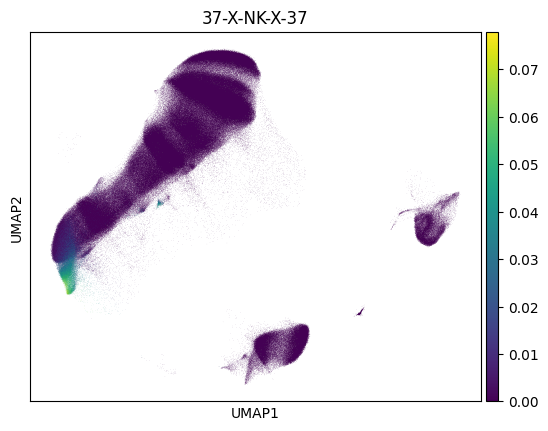

In [64]:
sc.pl.umap(adata, color='37-X-NK-X-37')

## What's up with MX2

In [6]:
adata = sc.read_h5ad(spectra_file)

In [8]:
adata_umap = sc.read_h5ad("../../test/test123/write/qc_020725_wctypes.harmony.umap.h5ad", backed='r')

(2416314, 36601)

In [12]:
adata.obsm['X_umap'] = adata_umap[adata.obs_names].obsm['X_umap']

In [18]:
gex_means = grouped_obs_mean(adata, group_key=['cytopus_names','COND','FID'])

In [22]:
gex_means.to_csv("output/ctype_cond_fid.means.csv.gz")

In [97]:
foo = gex_means.loc['HERC6'].to_frame()

In [98]:
foo.index = pd.MultiIndex.from_tuples(foo.index)
bar = foo.reset_index(names=['cytopus_names','COND','FID'])

In [99]:
fid_eth = adata.obs[['FID','Ethnicity']].drop_duplicates()

In [100]:
gdt_mx2_ctl = bar[(bar['cytopus_names']=="gdT") & (bar['COND']=="CTL")].merge(fid_eth)
gdt_mx2_lps = bar[(bar['cytopus_names']=="gdT") & (bar['COND']=="LPS")].merge(fid_eth)

<Axes: xlabel='Ethnicity', ylabel='HERC6'>

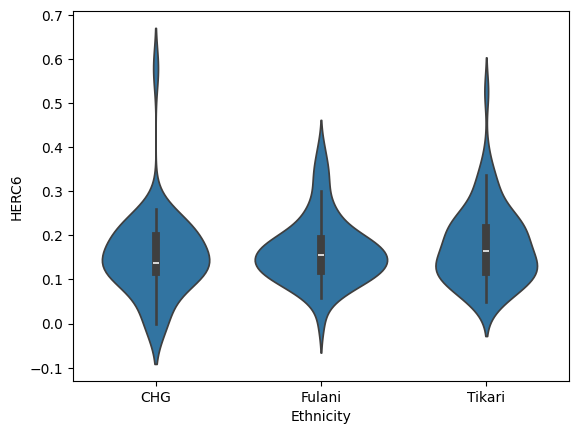

In [101]:
sns.violinplot(gdt_mx2_ctl, x='Ethnicity', y='HERC6')

<Axes: xlabel='Ethnicity', ylabel='HERC6'>

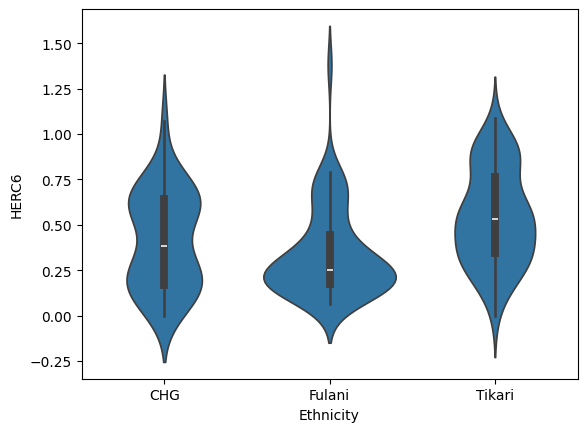

In [102]:
sns.violinplot(gdt_mx2_lps, x='Ethnicity', y='HERC6')